In [1]:
%load_ext autoreload
%autoreload 2

In [78]:
import numpy as np
import pandas as pd
from n00ter_stats import * 
from n00_config_params import *
from n00bis_config_analysis_functions import *
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm

# FUNCTIONS

In [3]:
def get_ROI_counts(df):

    ROI_list = df['ROI'].unique()

    ROI_counts_plot = {}
    ROI_counts_sujet = {}

    for ROI in ROI_list:

        ROI_counts_plot[ROI] = 0
        ROI_counts_sujet[ROI] = len(df.query(f"ROI == '{ROI}'")['sujet'].unique())

        for sujet in df.query(f"ROI == '{ROI}'")['sujet'].unique():

            ROI_counts_plot[ROI] += df.query(f"ROI == '{ROI}' and sujet == '{sujet}'")['chan'].unique().shape[0]
        
    return ROI_counts_plot, ROI_counts_sujet

In [4]:
def get_pval(pval):

    if pval > 0.05:

        return pval

    elif pval < 0.001:

        return '***'

    elif pval < 0.01:

        return '**'

    elif pval < 0.05:

        return '*'

# LOAD DF

## Cxy

In [5]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_Cxy_FR_CV = pd.read_excel(f'df_Cxy_FR_CV_filt_bi.xlsx')
df_Cxy_ALLCOND = pd.read_excel(f'df_Cxy_ALLCOND_filt_bi.xlsx')

In [6]:
df_ROI_count_FR_CV = df_Cxy_FR_CV.groupby(['ROI']).size().reset_index(name='count_plot')
df_ROI_count_FR_CV['count_sujet'] = df_Cxy_FR_CV.groupby(['ROI', 'sujet']).size().reset_index(name='count_sujet').groupby('ROI').size().reset_index(name='count_sujet')['count_sujet'].values

Cxy_ROI_list_FR_CV_filt = df_Cxy_FR_CV['ROI'].unique()

In [7]:
df_ROI_count_allcond = df_Cxy_ALLCOND.groupby(['ROI']).size().reset_index(name='count_plot')
df_ROI_count_allcond['count_sujet'] = df_Cxy_ALLCOND.groupby(['ROI', 'sujet']).size().reset_index(name='count_sujet').groupby('ROI').size().reset_index(name='count_sujet')['count_sujet'].values

Cxy_ROI_list_ALLCOND_filt = df_Cxy_ALLCOND['ROI'].unique()

## Pxx

In [8]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_Pxx_FR_CV = pd.read_excel(f'df_Pxx_FR_CV_filt_bi.xlsx')
df_Pxx_ALLCOND = pd.read_excel(f'df_Pxx_ALLCOND_filt_bi.xlsx')

In [9]:
Pxx_ROI_list_FR_CV_filt = df_Pxx_FR_CV['ROI'].unique()

In [10]:
Pxx_ROI_list_ALLCOND_filt = df_Pxx_ALLCOND['ROI'].unique()

## FC

In [67]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_fc_FR_CV = pd.read_excel(f'df_WPLI_FC_FR_CV_bi.xlsx')
df_fc_ALLCOND = pd.read_excel(f'df_WPLI_FC_ALLCOND_bi.xlsx')

# ANATOMY

## FR_CV

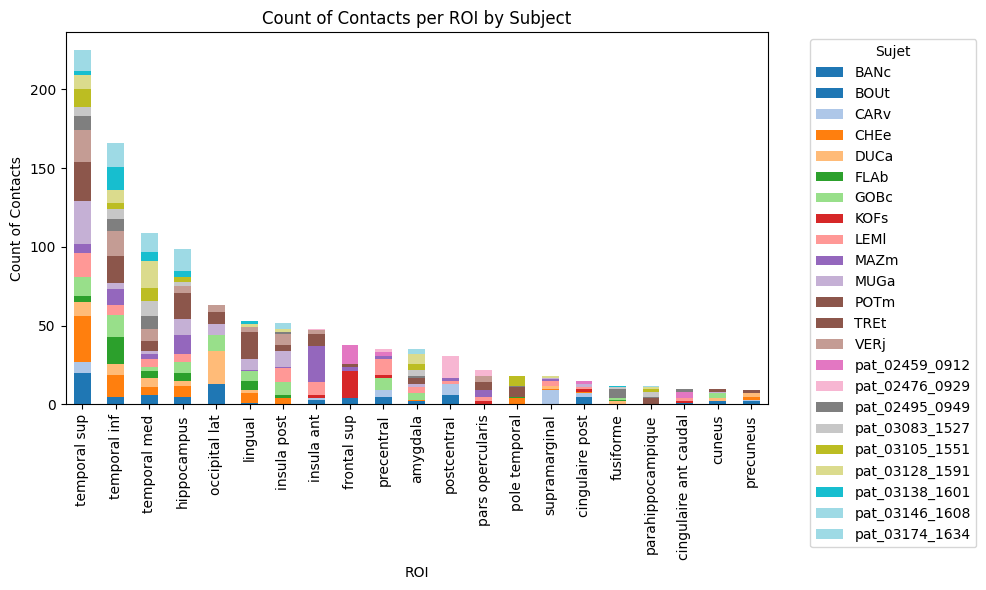

In [11]:
roi_counts = df_Cxy_FR_CV.query("ROI != 'WM'").groupby(['ROI', 'sujet']).size().reset_index(name='count')
roi_pivot = roi_counts.pivot(index='ROI', columns='sujet', values='count').fillna(0)
roi_pivot = roi_pivot.loc[roi_pivot.sum(axis=1).sort_values(ascending=False).index]

ax = roi_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')

plt.title('Count of Contacts per ROI by Subject')
plt.xlabel('ROI')
plt.ylabel('Count of Contacts')
plt.legend(title='Sujet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## ALLCOND

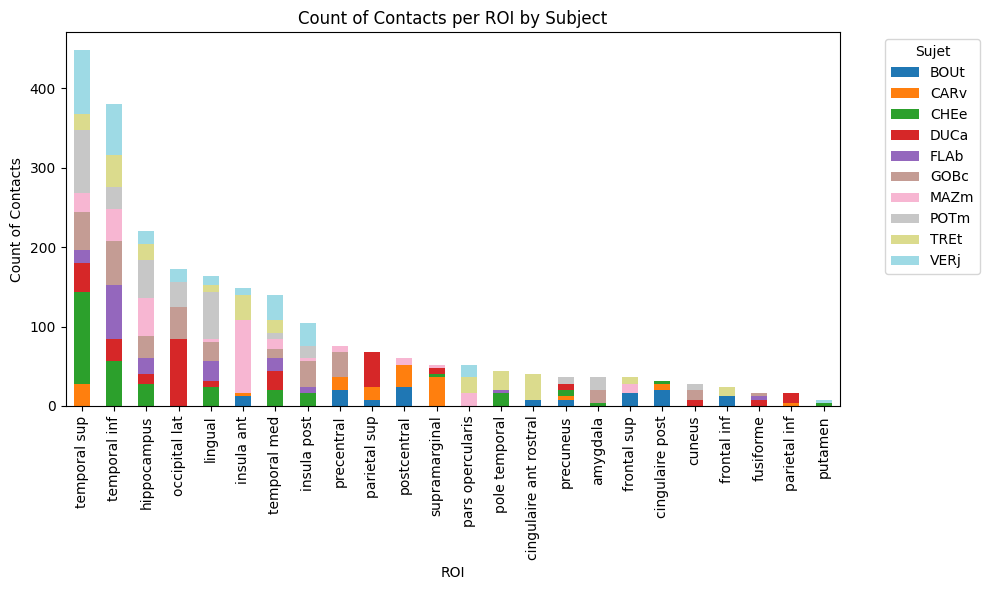

In [12]:
roi_counts = df_Cxy_ALLCOND.query("ROI != 'WM'").groupby(['ROI', 'sujet']).size().reset_index(name='count')
roi_pivot = roi_counts.pivot(index='ROI', columns='sujet', values='count').fillna(0)
roi_pivot = roi_pivot.loc[roi_pivot.sum(axis=1).sort_values(ascending=False).index]

ax = roi_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')

plt.title('Count of Contacts per ROI by Subject')
plt.xlabel('ROI')
plt.ylabel('Count of Contacts')
plt.legend(title='Sujet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Cxy

## FR_CV

### PROPORTION

In [13]:
data_df = {'ROI' : [], 'Cxy_p' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:
    
    signi = (df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy'] > df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy_surr']).sum()
    prop_Cxy = signi/df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    
    data_df['ROI'].append(ROI)
    data_df['Cxy_p'].append(prop_Cxy)

df_Cxy_p = pd.DataFrame(data_df) 
df_Cxy_p

,ROI,Cxy_p
0,amygdala,0.371429
1,temporal sup,0.155556
2,hippocampus,0.212121
3,temporal inf,0.132530
4,temporal med,0.128440
5,pole temporal,0.055556
6,cingulaire post,0.133333
7,precuneus,0.222222
8,supramarginal,0.611111
9,lingual,0.188679


/tmp/ipykernel_494082/3009641518.py:4: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI)


Text(0.5, 1.0, 'FR_CV Cxy_p')

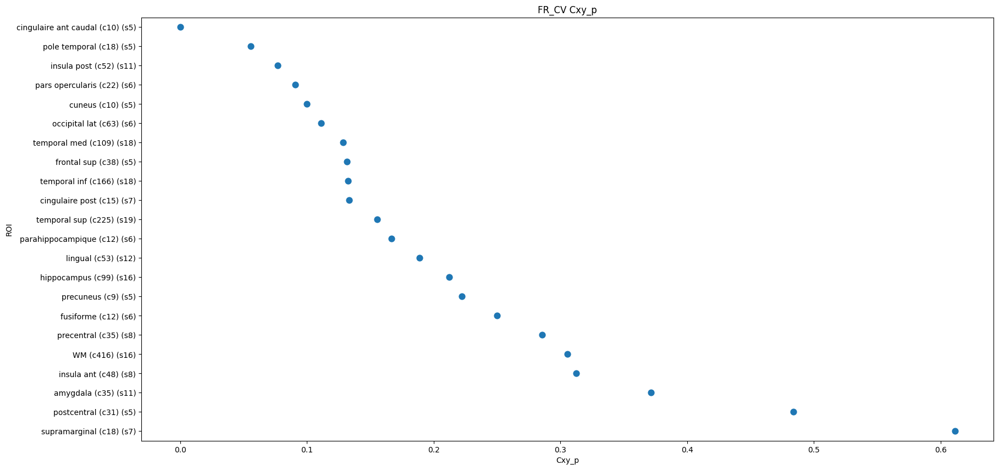

In [14]:
df_plot = df_Cxy_p

fig, ax = plt.subplots(figsize = (20,10))
g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI)

ROI_labels = []

for ROI in df_plot.sort_values('Cxy_p').ROI:

    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')

ax.set_title('FR_CV Cxy_p')

/tmp/ipykernel_494082/1374946785.py:4: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI)


Text(0.5, 1.0, 'FR_CV Cxy_p')

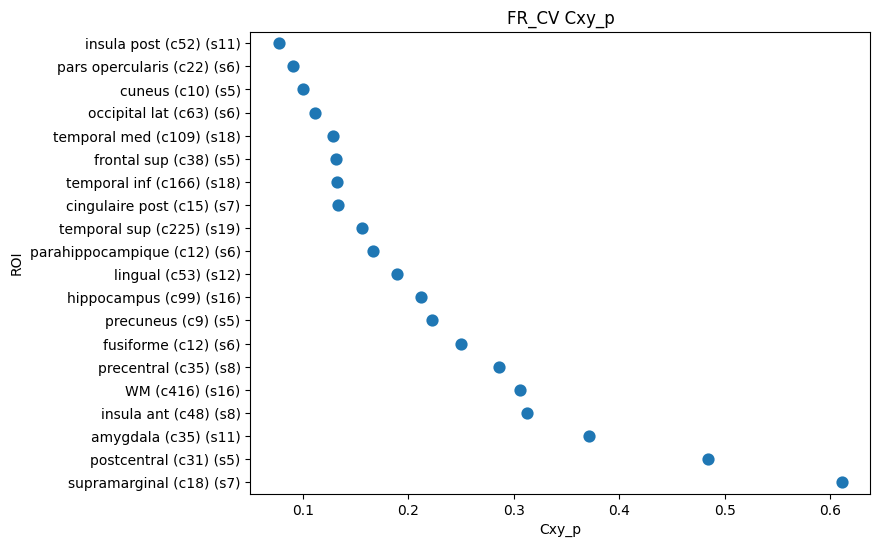

In [15]:
df_plot = df_Cxy_p.sort_values('Cxy_p').iloc[-20:]

fig, ax = plt.subplots(figsize = (8,6))
g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI)

ROI_labels = []

for ROI in df_plot.sort_values('Cxy_p').ROI:

    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')

ax.set_title('FR_CV Cxy_p')

### OLS subject wise

In [16]:
df_Cxy_FR_CV_subjectwise = df_Cxy_FR_CV[['ROI', 'sujet', 'Cxy', 'resp']].groupby(['ROI', 'sujet']).median().reset_index()

In [17]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_lmm = df_Cxy_FR_CV_subjectwise.query(f"ROI == '{ROI}'")[['Cxy', 'resp']]

    x = _df_lmm['resp']
    y = _df_lmm['Cxy']

    x = sm.add_constant(x)

    mdl = sm.OLS(y, x).fit()
    mdl_fit = mdl.predict(x) 

    coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
    intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
    pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)

    
    # fig, axs = plt.subplots(ncols=2, figsize=(10,5))

    # sns.histplot(mdl_fit.resid, ax=axs[0])
    # sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

    # plt.suptitle(f"{ROI}")

    # fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', 'stats', f'{ROI}_qqplot_distrib_LMM_FR_CV_Cxy.png'))

    # plt.close()

    # plt.show()


df_lmm = pd.DataFrame(data)

/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:418: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=11 observations were given.
  return hypotest_fun_in(*args, **kwds)
/tmp/ipykernel_494082/975078885.py:15: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:418: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=11 observations were given.
  return hypotest_fun_in(*args, **kwds)
/tmp/ipykernel_494082/975078885.py:16: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal

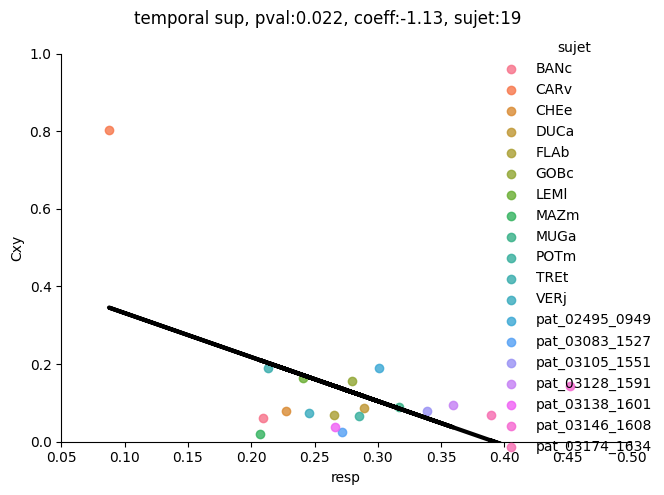

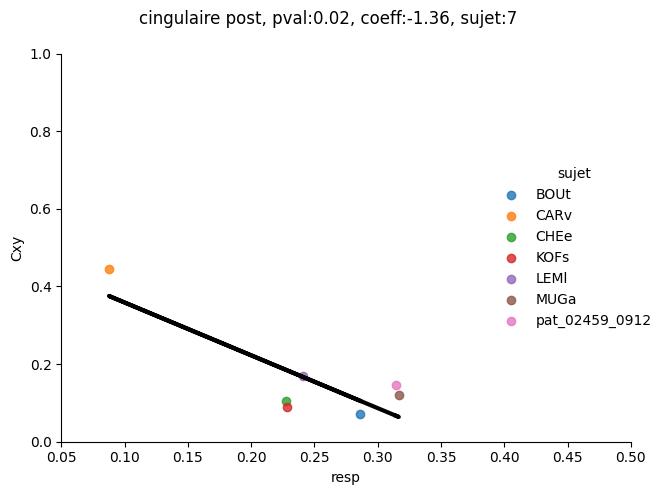

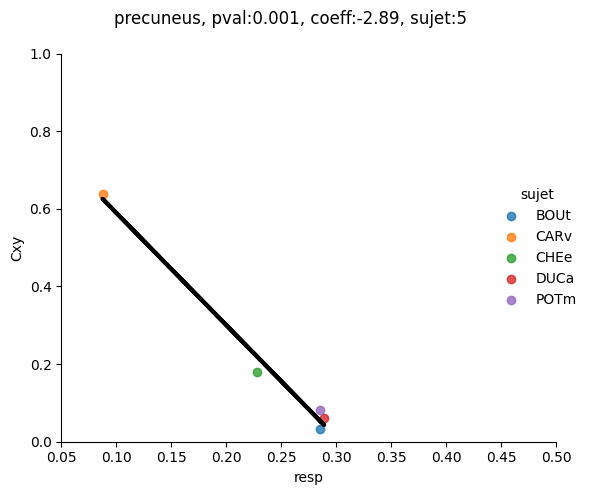

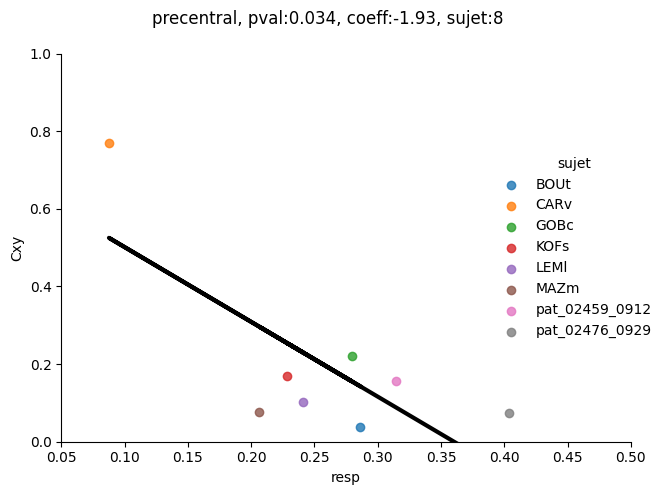

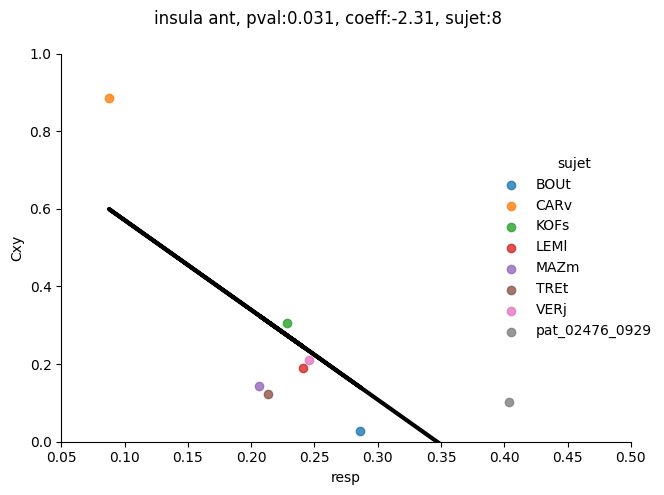

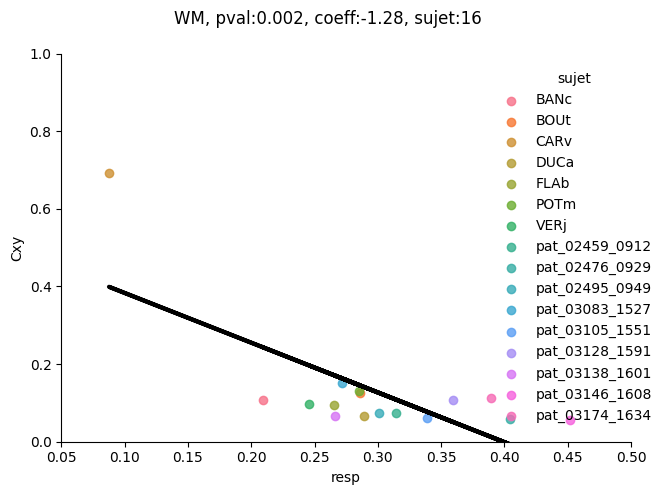

In [18]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_lmm = df_Cxy_FR_CV_subjectwise.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]

    if df_lmm.query(f"ROI == '{ROI}'")['p'].values != 1:
        continue
    
    pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(data=_df_lmm, x="resp", y="Cxy", hue='sujet')
    _coeff = df_lmm.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_lmm['resp'].values*_coeff + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05,0.5)
    plt.plot(_df_lmm['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')
    plt.suptitle(f"{ROI}, pval:{pval}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

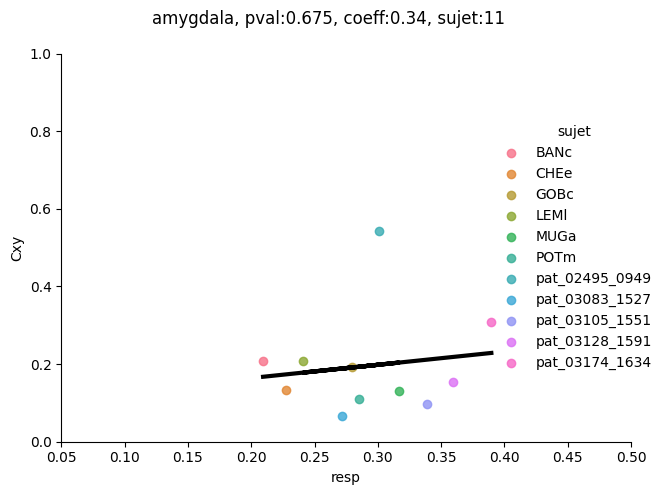

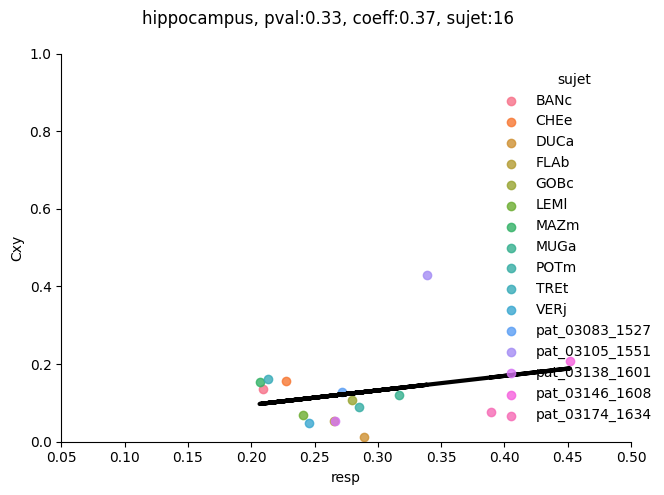

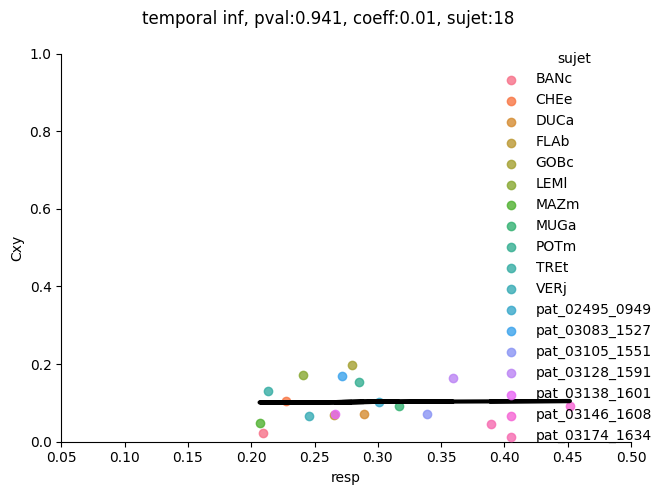

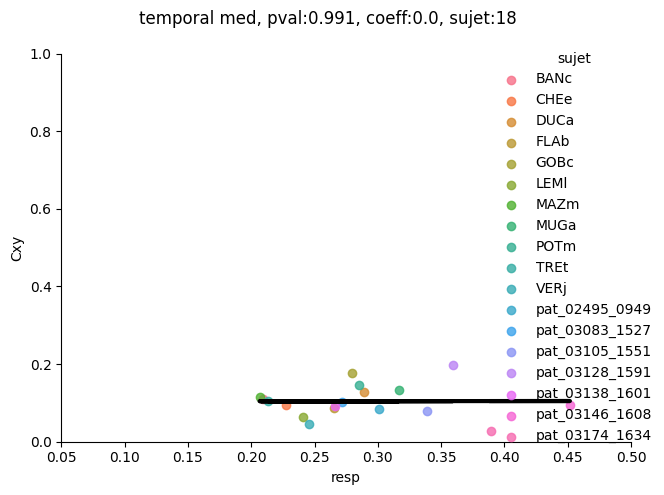

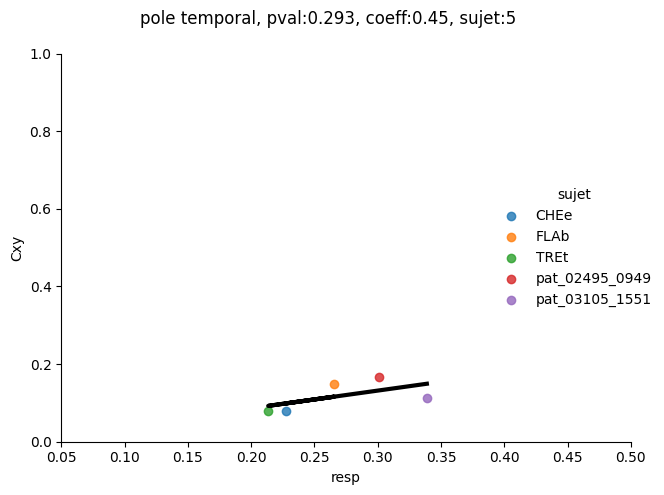

...

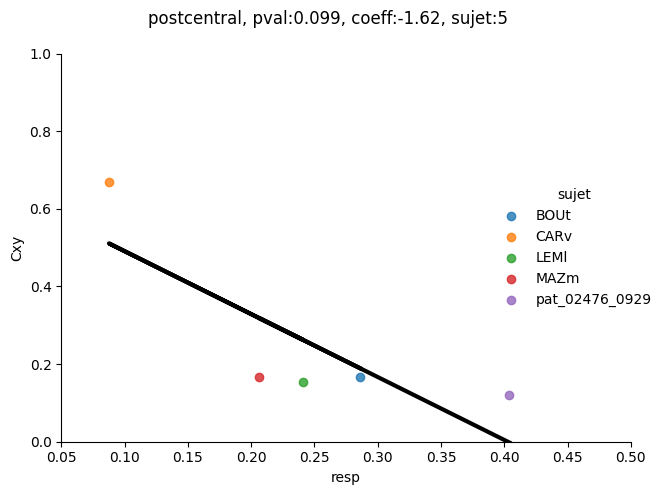

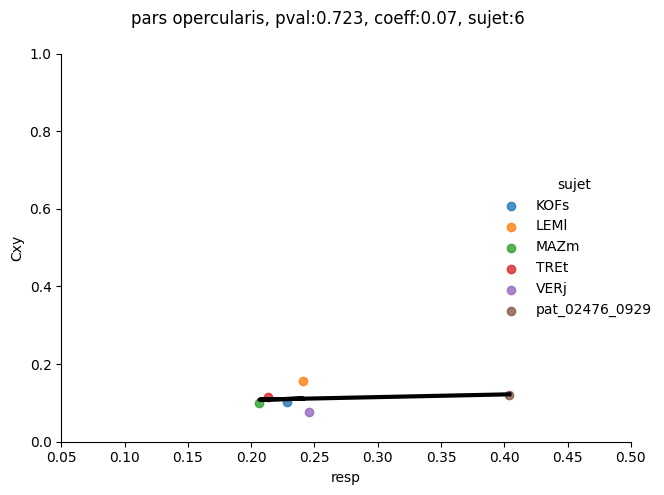

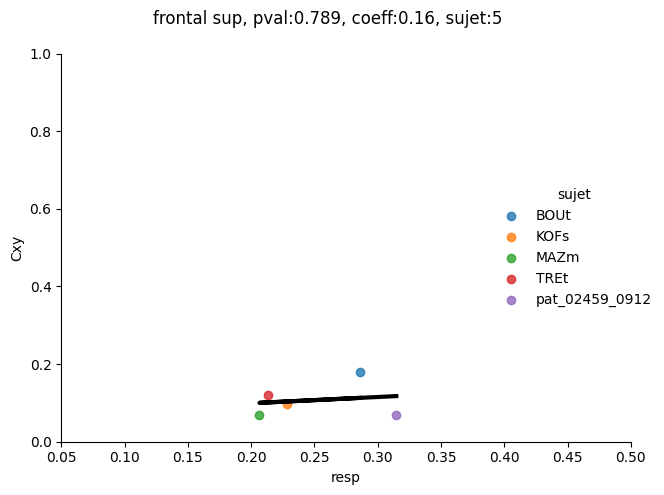

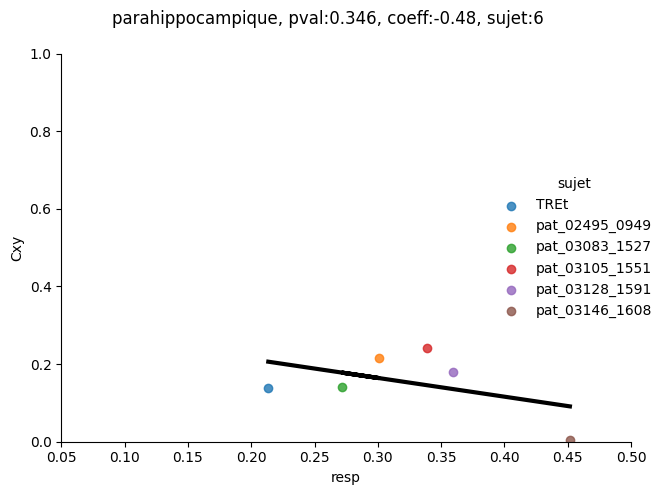

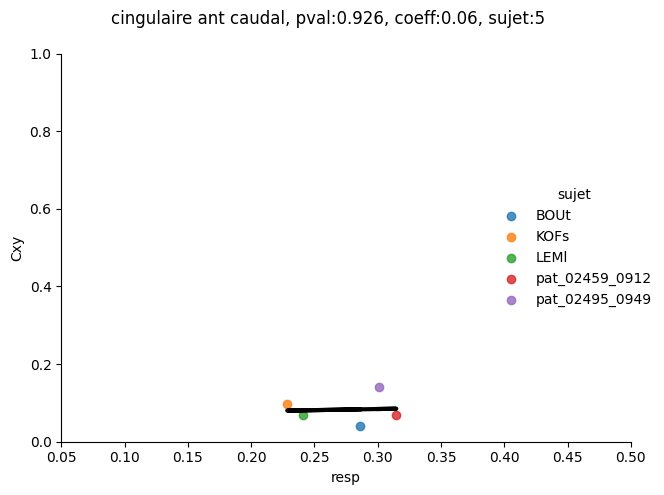

In [19]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_lmm = df_Cxy_FR_CV_subjectwise.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]

    if df_lmm.query(f"ROI == '{ROI}'")['p'].values == 1:
        continue
    
    pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(data=_df_lmm, x="resp", y="Cxy", hue='sujet')
    _coeff = df_lmm.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_lmm['resp'].values*_coeff + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05,0.5)
    plt.plot(_df_lmm['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{pval}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

### Spearman allplot

In [20]:
def spearman_permutation_test(x, y, n_perm, percentile_thresh_list):

    rho_obs, _ = scipy.stats.spearmanr(x, y)

    null_dist = np.zeros(n_perm)
    for i in range(n_perm):
        y_perm = np.random.permutation(y)
        null_dist[i], _ = scipy.stats.spearmanr(x, y_perm)

    signi = rho_obs > np.percentile(null_dist, percentile_thresh_list[1]) or rho_obs < np.percentile(null_dist, percentile_thresh_list[0])

    return rho_obs, signi

percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 500

data = {'ROI': [], 'rho': [], 'signi': []}

for ROI in Cxy_ROI_list_FR_CV_filt:

    _df = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['Cxy', 'resp']]

    x = _df['resp'].values
    y = _df['Cxy'].values

    rho, signi = spearman_permutation_test(x, y, n_perm_spearman, percentile_thresh_list)

    data['ROI'].append(ROI)
    data['rho'].append(rho)
    data['signi'].append(signi)

# Build dataframe
df_spearman = pd.DataFrame(data)



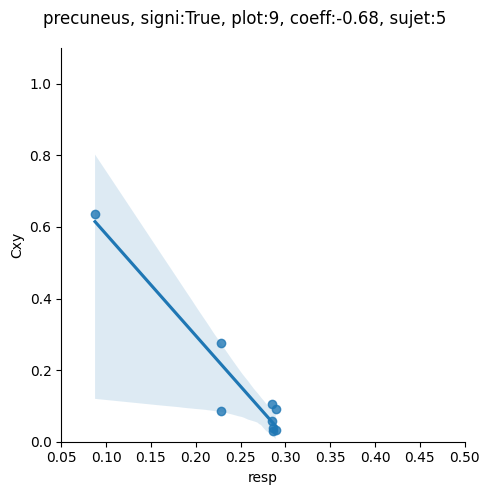

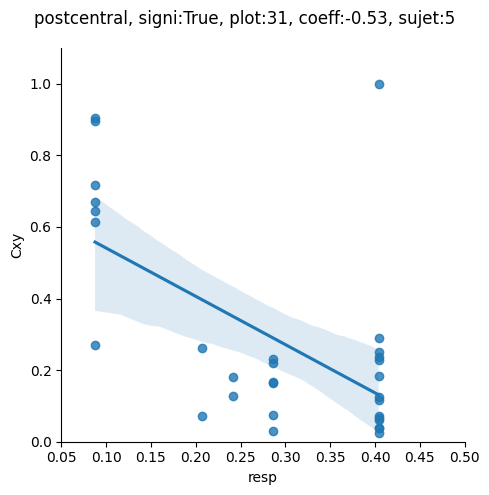

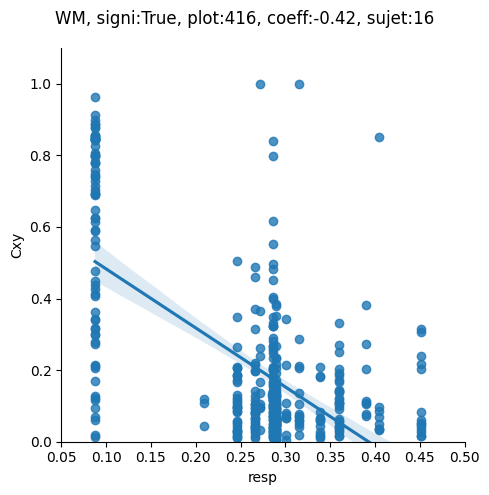

In [21]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    if df_spearman.query(f"ROI == '{ROI}'")['signi'].values == False:
        continue
    
    pval = df_spearman.query(f"ROI == '{ROI}'")['signi'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=df_Cxy_FR_CV.query(f"ROI == '{ROI}'"))
    _coeff = df_spearman.query(f"ROI == '{ROI}'")['rho'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

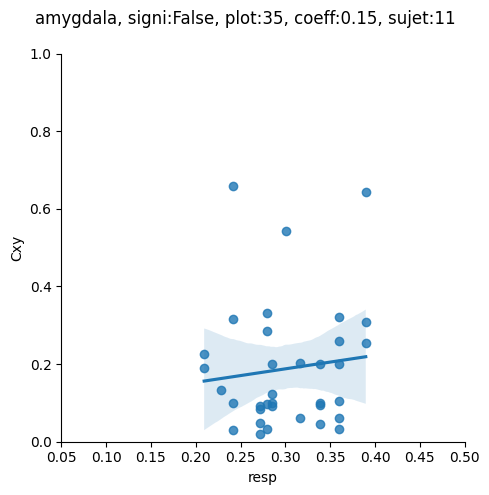

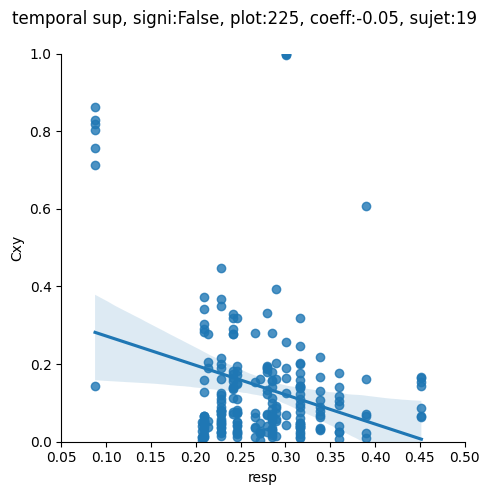

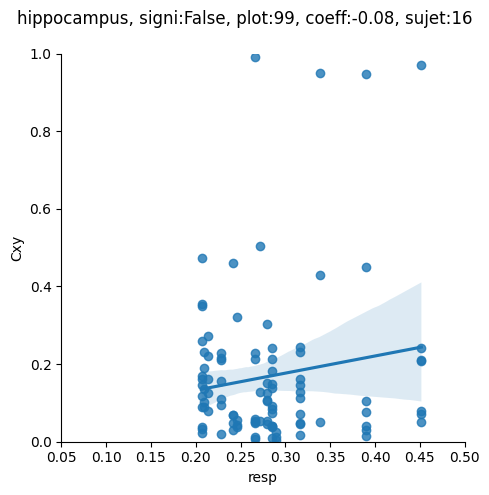

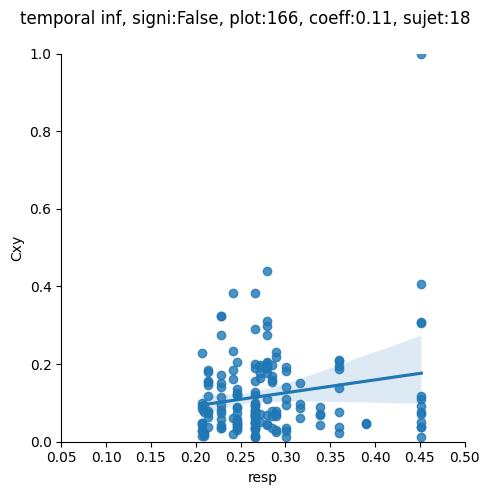

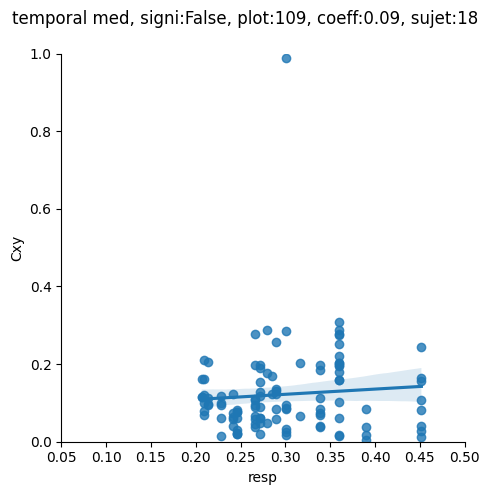

...

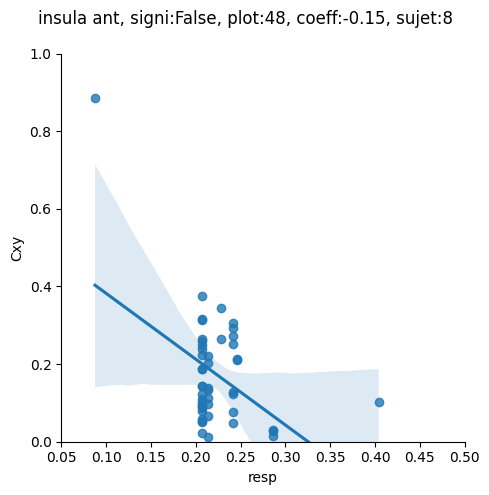

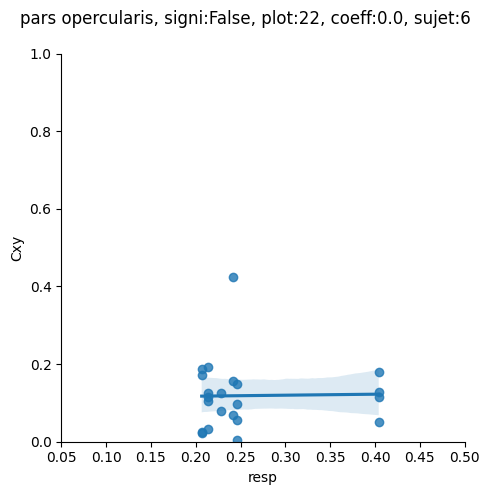

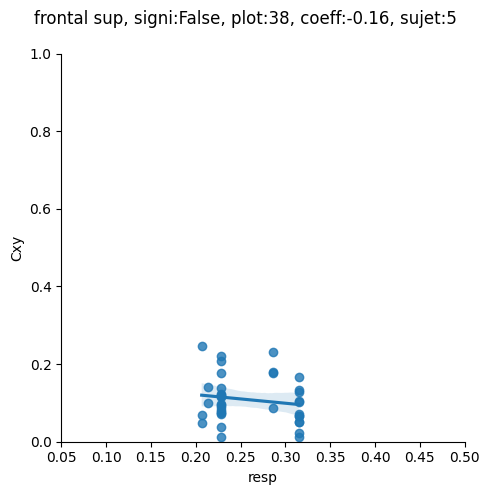

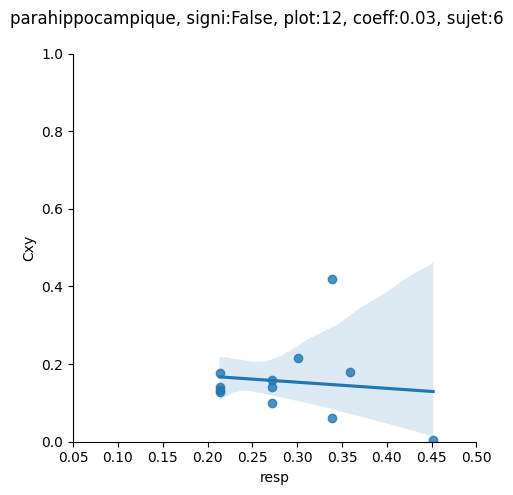

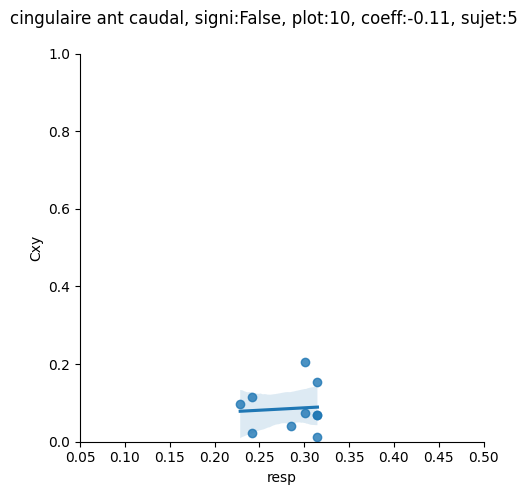

In [22]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    if df_spearman.query(f"ROI == '{ROI}'")['signi'].values == True:
        continue
    
    pval = df_spearman.query(f"ROI == '{ROI}'")['signi'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=df_Cxy_FR_CV.query(f"ROI == '{ROI}'"))
    _coeff = df_spearman.query(f"ROI == '{ROI}'")['rho'].values[0]
    plt.ylim(0,1)
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

### OLS allplot

In [23]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_lmm = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['Cxy', 'resp']]

    x = _df_lmm['resp']
    y = _df_lmm['Cxy']

    x = sm.add_constant(x)

    mdl = sm.OLS(y, x).fit()
    mdl_fit = mdl.predict(x) 

    coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
    intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
    pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)

    
    # fig, axs = plt.subplots(ncols=2, figsize=(10,5))

    # sns.histplot(mdl_fit.resid, ax=axs[0])
    # sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

    # plt.suptitle(f"{ROI}")

    # fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', 'stats', f'{ROI}_qqplot_distrib_LMM_FR_CV_Cxy.png'))

    # plt.close()

    # plt.show()


df_lmm = pd.DataFrame(data)

/tmp/ipykernel_494082/3005007422.py:15: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/tmp/ipykernel_494082/3005007422.py:16: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
/tmp/ipykernel_494082/3005007422.py:17: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]
/tmp/ipykernel_494082/3005007422.py:15: FutureWarning: Passin

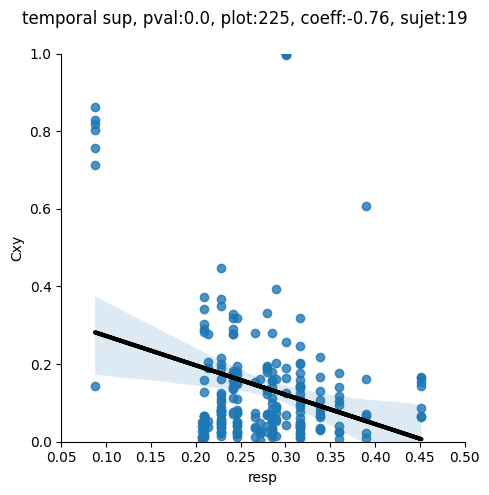

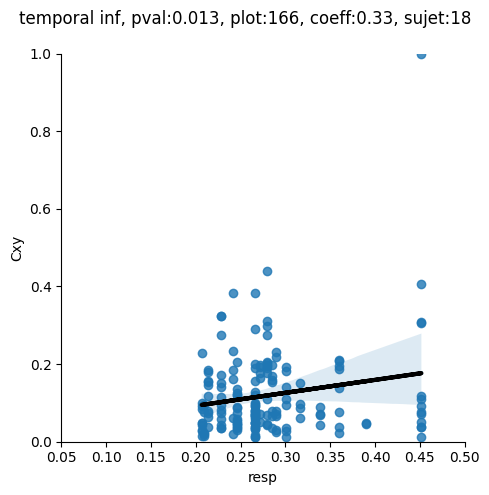

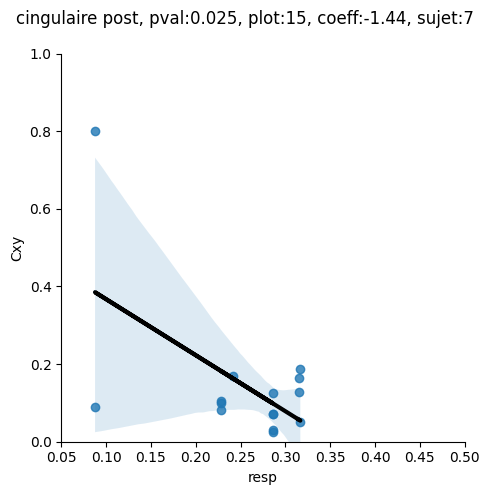

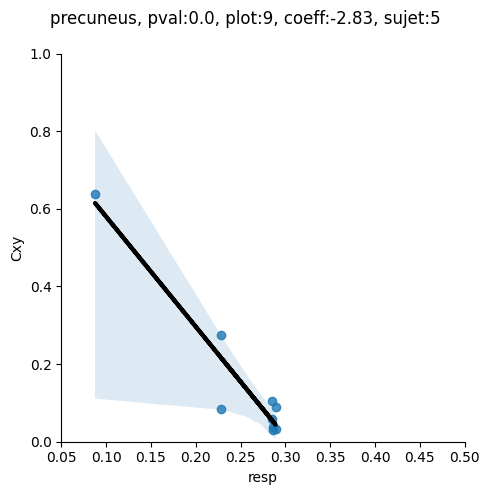

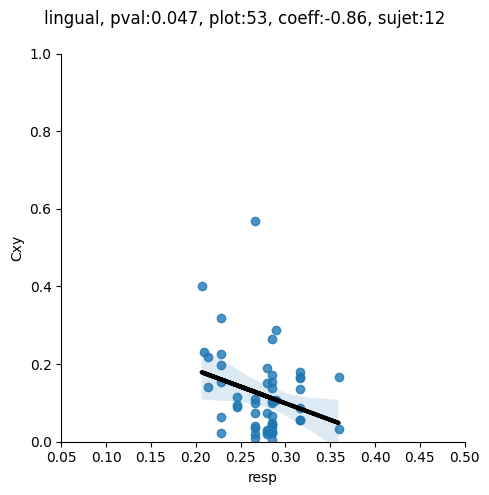

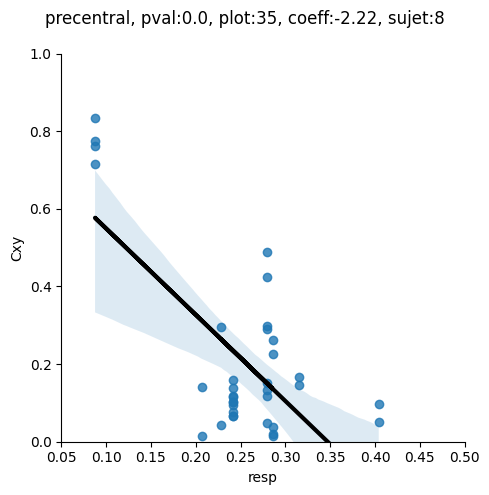

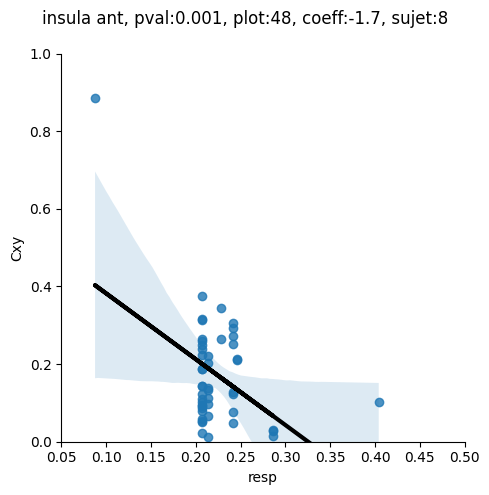

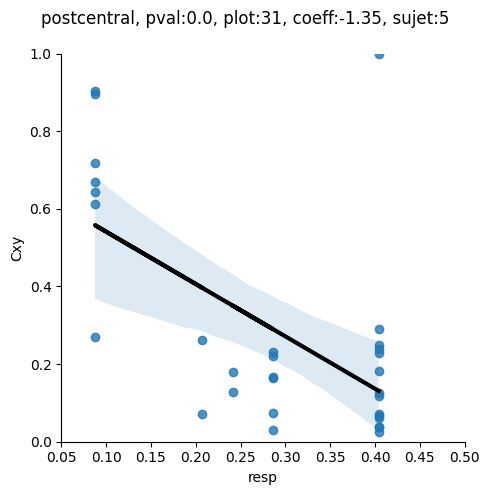

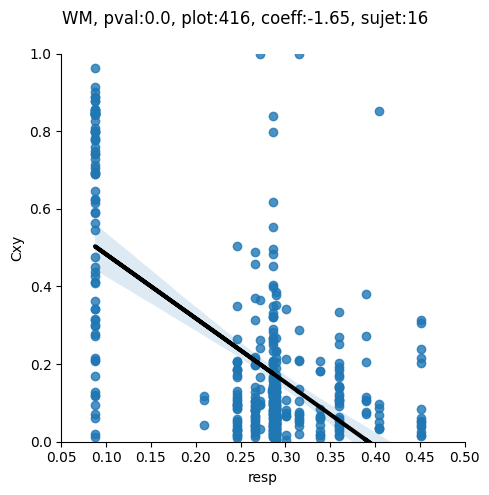

In [24]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    df_plot = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]

    if df_lmm.query(f"ROI == '{ROI}'")['p'].values != 1:
        continue
    
    pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=df_plot)
    _coeff = df_lmm.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = df_plot['resp'].values*_coeff + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05,0.5)
    plt.plot(df_plot['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

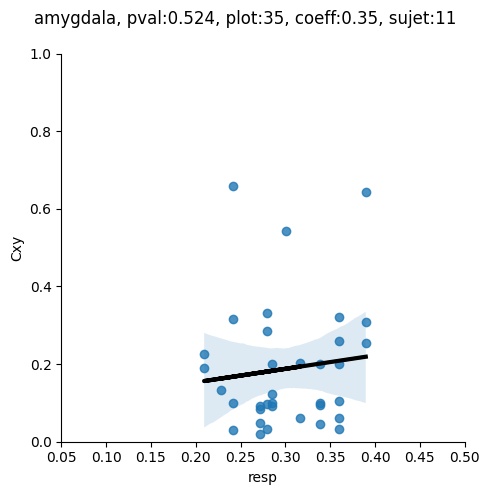

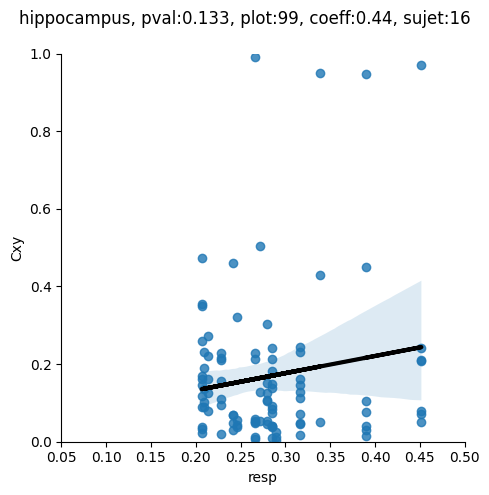

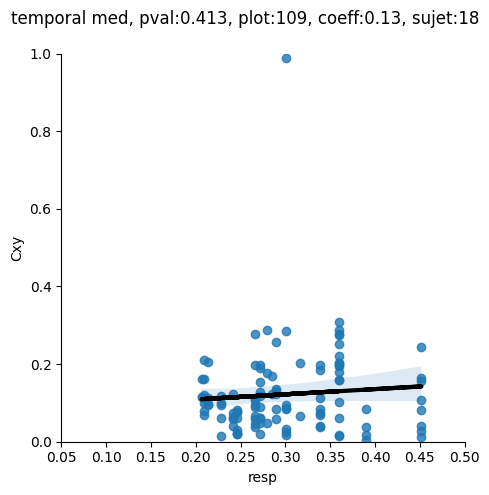

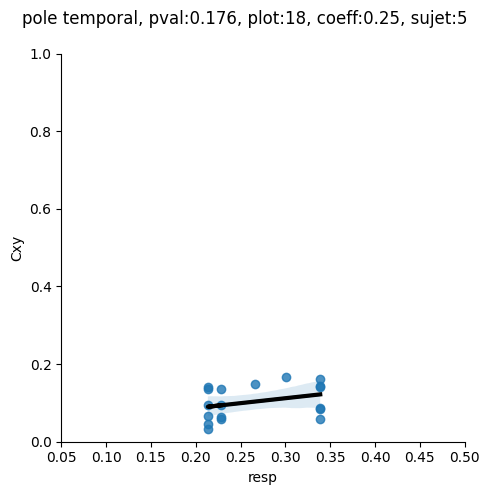

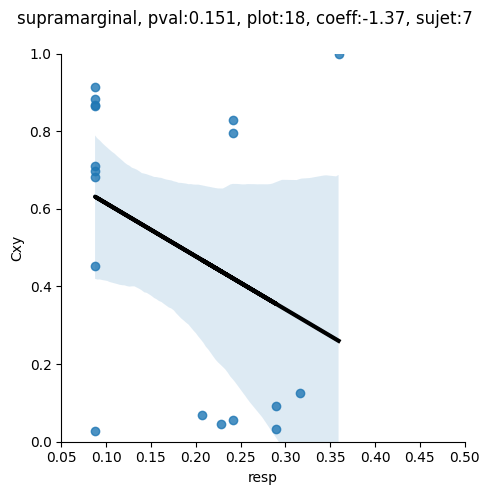

...

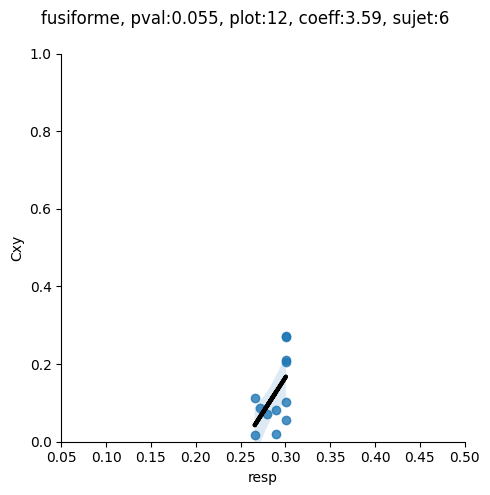

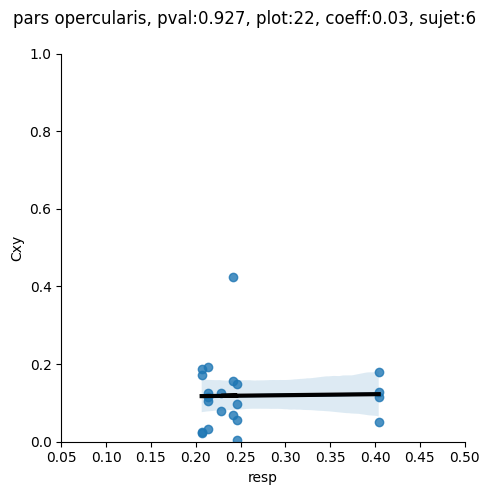

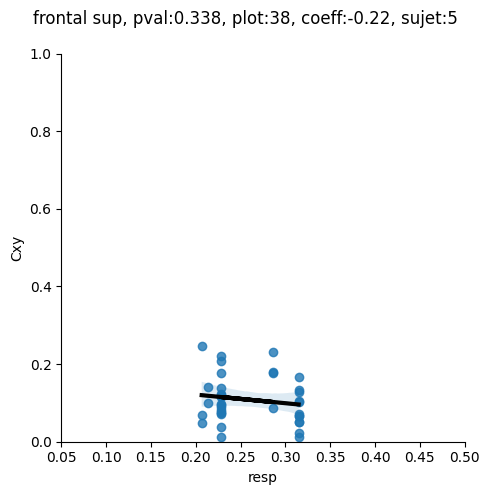

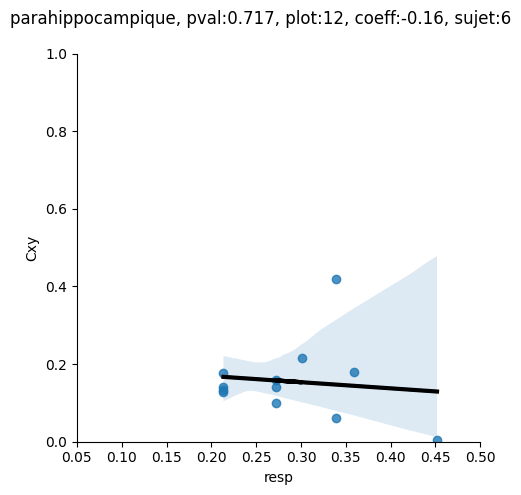

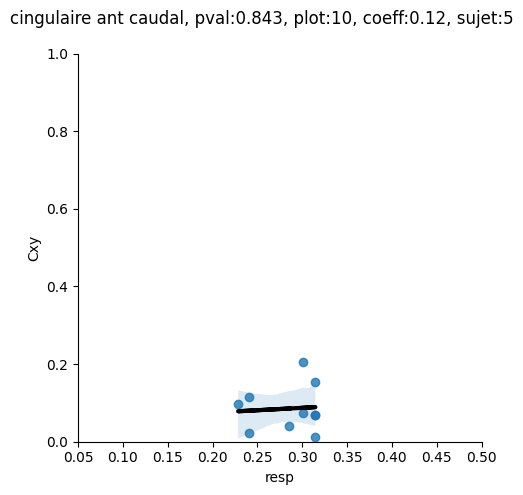

In [25]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_lmm = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]

    if df_lmm.query(f"ROI == '{ROI}'")['p'].values == 1:
        continue
    
    pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=_df_lmm)
    _coeff = df_lmm.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_lmm['resp'].values*_coeff + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05,0.5)
    plt.plot(_df_lmm['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

### LMM

In [26]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'Cxy', 'df_lmm'))
df_lmm_FR_CV = pd.DataFrame()

for ROI in Cxy_ROI_list_FR_CV_filt:

    _df = pd.read_excel(f'FR_CV_Cxy_lmm_{ROI}_res_bi.xlsx')
    _df['ROI'] = [ROI] * _df.shape[0]
    df_lmm_FR_CV = pd.concat([df_lmm_FR_CV, _df])

In [27]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:

    coeff = df_lmm_FR_CV.query(f"ROI == '{ROI}' and term == 'resp'")['estimate'].values[0]
    pval = df_lmm_FR_CV.query(f"ROI == '{ROI}' and term == 'resp'")['p.value'].values[0]
    intercept = df_lmm_FR_CV.query(f"ROI == '{ROI}' and term == '(Intercept)'")['estimate'].values[0]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)


df_lmm_FR_CV_summary = pd.DataFrame(data)
df_lmm_FR_CV_summary

,ROI,coeff,intercept,pval,p
0,amygdala,1.463681,-2.114464,0.614646,0
1,temporal sup,-3.195395,-1.114342,0.008404,1
2,hippocampus,2.231191,-2.436053,0.127736,0
3,temporal inf,2.088670,-2.799459,0.169761,0
4,temporal med,-0.059959,-2.199548,0.973813,0
5,pole temporal,2.546028,-2.956238,0.172109,0
6,cingulaire post,-6.086120,-0.526754,0.033441,1
7,precuneus,-12.533803,0.802630,0.000039,1
8,supramarginal,-1.462108,-1.240757,0.803780,0
9,lingual,-5.593652,-0.596307,0.069315,0


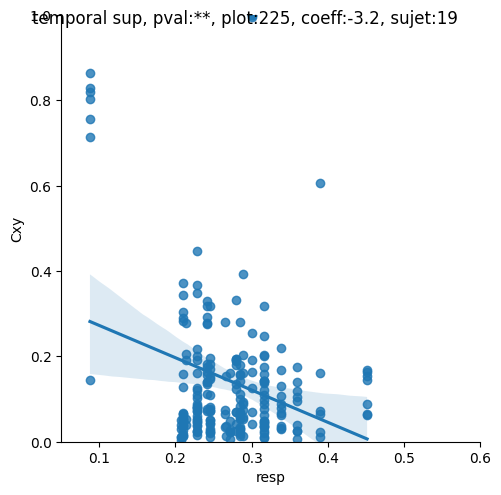

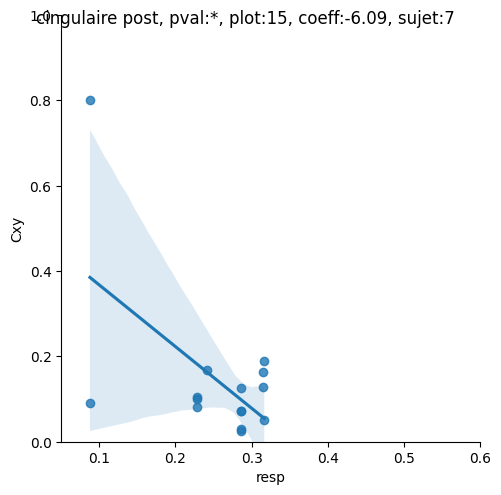

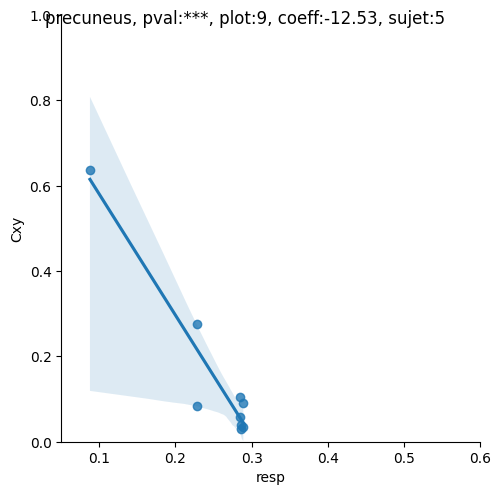

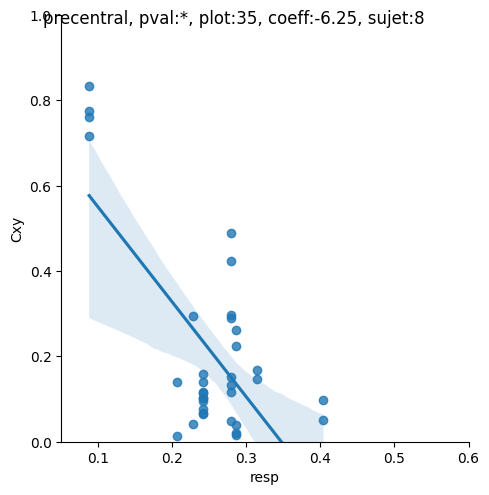

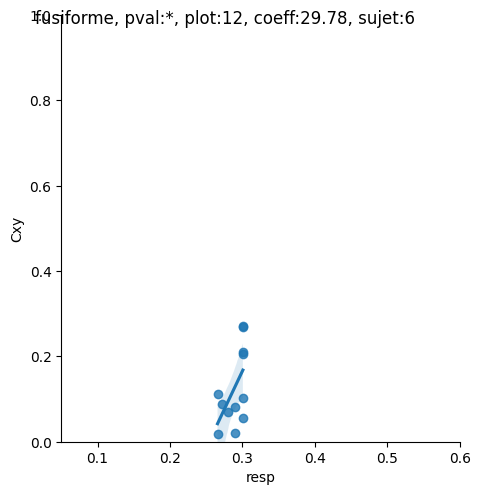

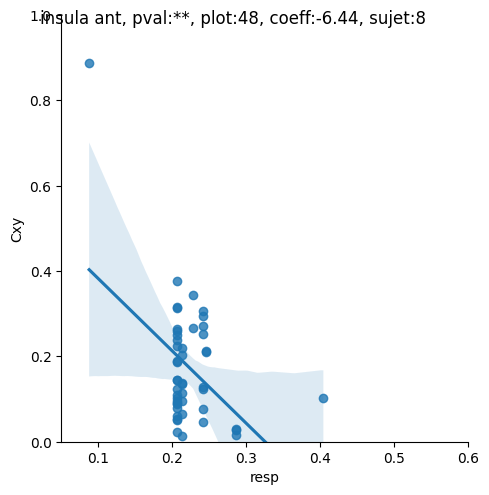

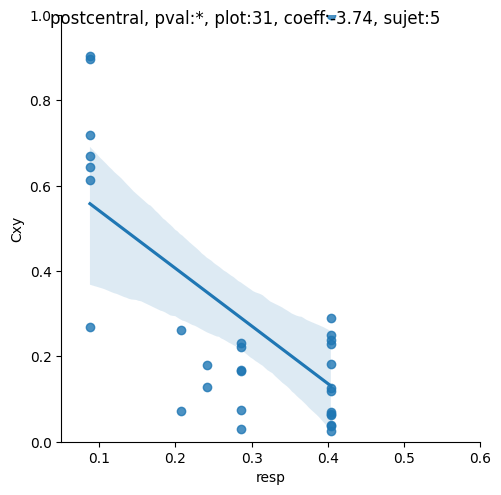

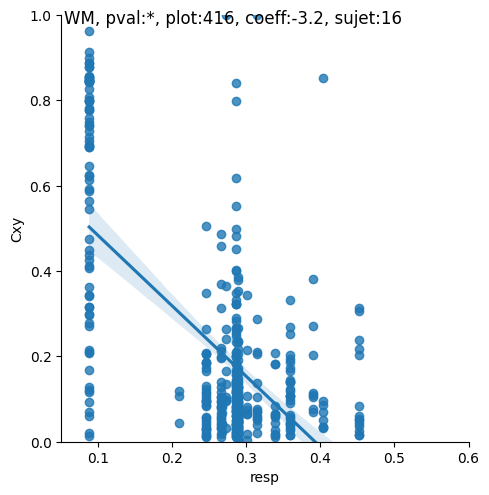

In [28]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    if df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['p'].values != 1:

        continue 

    _df_Cxy_FR_CV = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]
    
    pval = df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=_df_Cxy_FR_CV)
    _coeff = df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_Cxy_FR_CV['resp'].values*_coeff + df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05, 0.6)
    plt.plot(_df_Cxy_FR_CV['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{get_pval(pval)}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
        

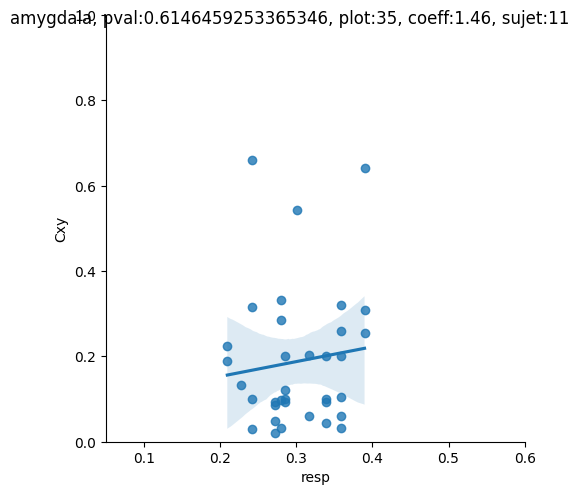

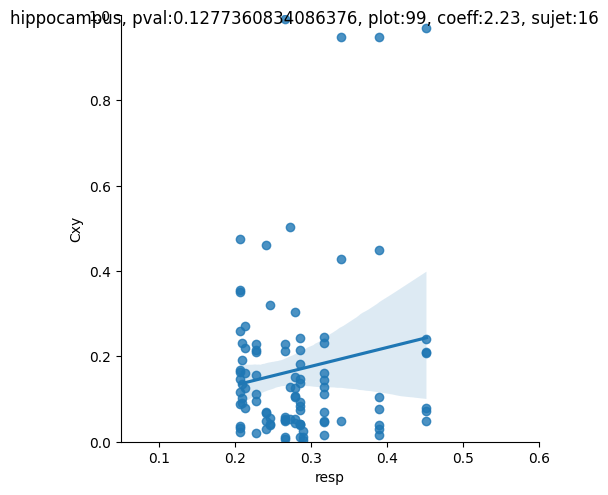

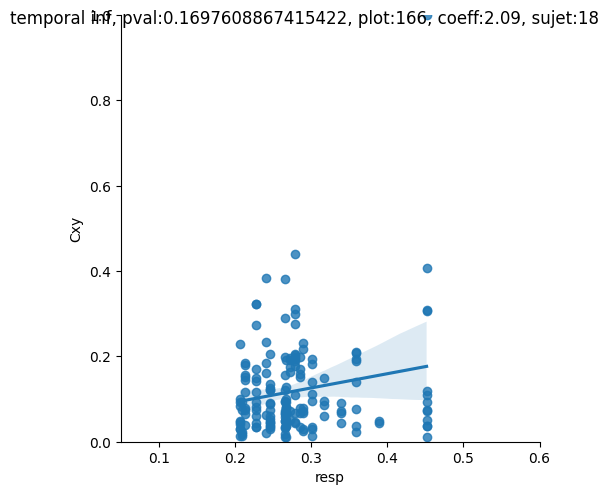

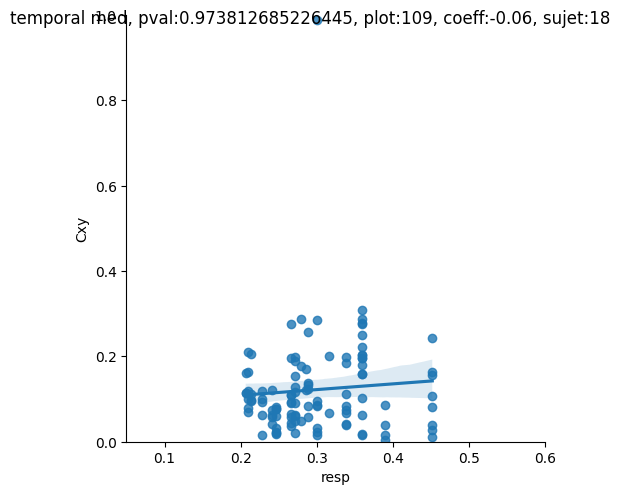

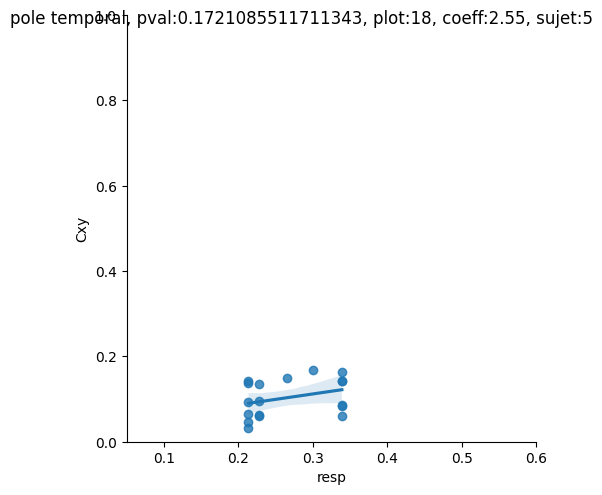

...

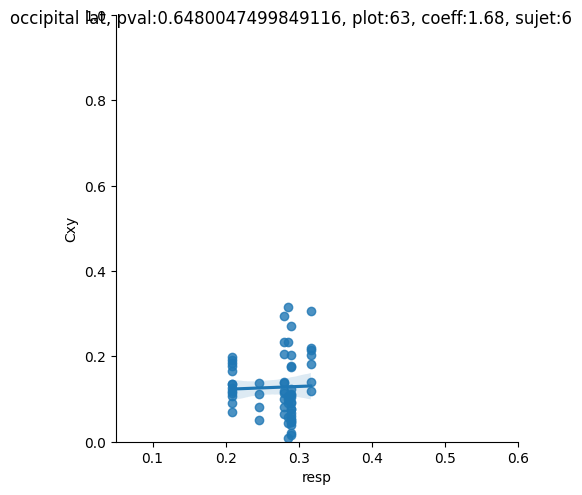

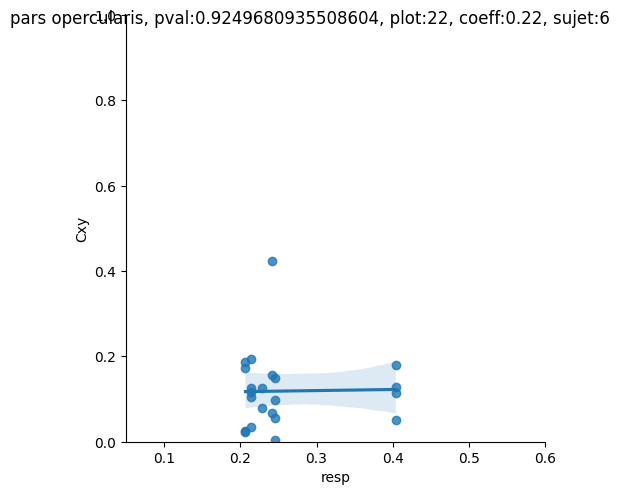

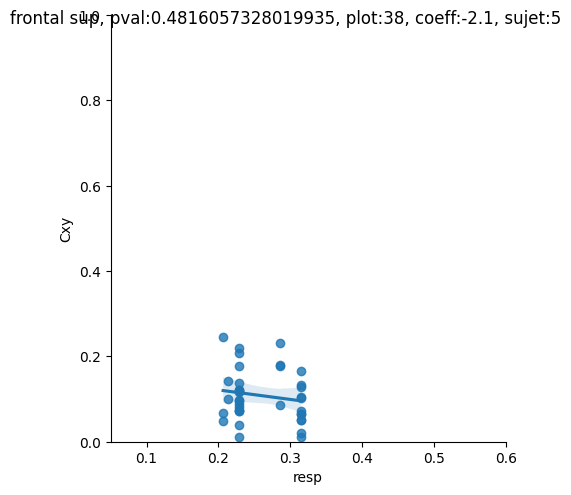

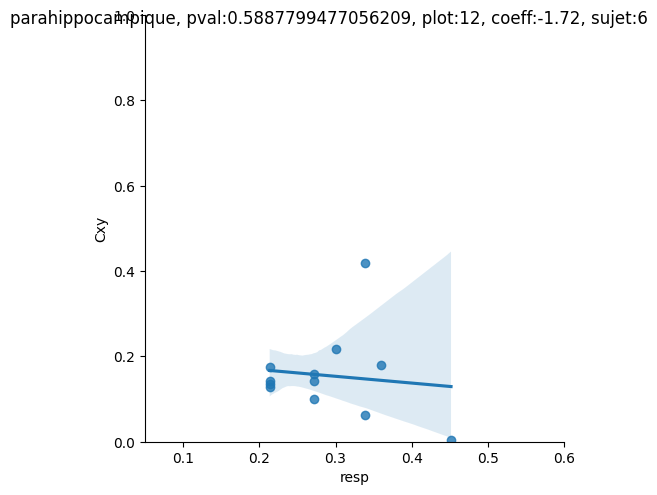

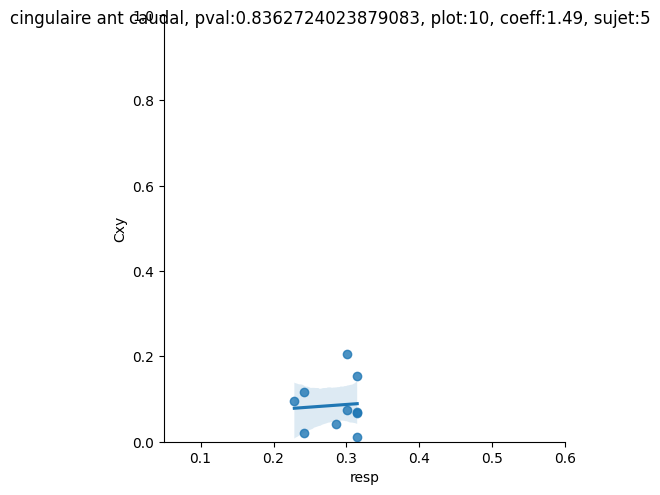

In [29]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    if df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['p'].values == 1:

        continue 

    _df_Cxy_FR_CV = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]
    
    pval = df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=_df_Cxy_FR_CV)
    _coeff = df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_Cxy_FR_CV['resp'].values*_coeff + df_lmm_FR_CV_summary.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05, 0.6)
    plt.plot(_df_Cxy_FR_CV['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{get_pval(pval)}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
        

## ALL CONDITIONS

### PROPORTION

In [30]:
data_df = {'cond' : [], 'ROI' : [], 'Cxy_p' : []}

for cond in conditions:

    for ROI in Cxy_ROI_list_ALLCOND_filt:
        
        signi = (df_Cxy_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy'] > df_Cxy_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy_surr']).sum()
        prop_Cxy = signi/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        
        data_df['cond'].append(cond)
        data_df['ROI'].append(ROI)
        data_df['Cxy_p'].append(prop_Cxy)

df_Cxy_p = pd.DataFrame(data_df) 

Text(0.5, 1.0, 'Cxy_p')

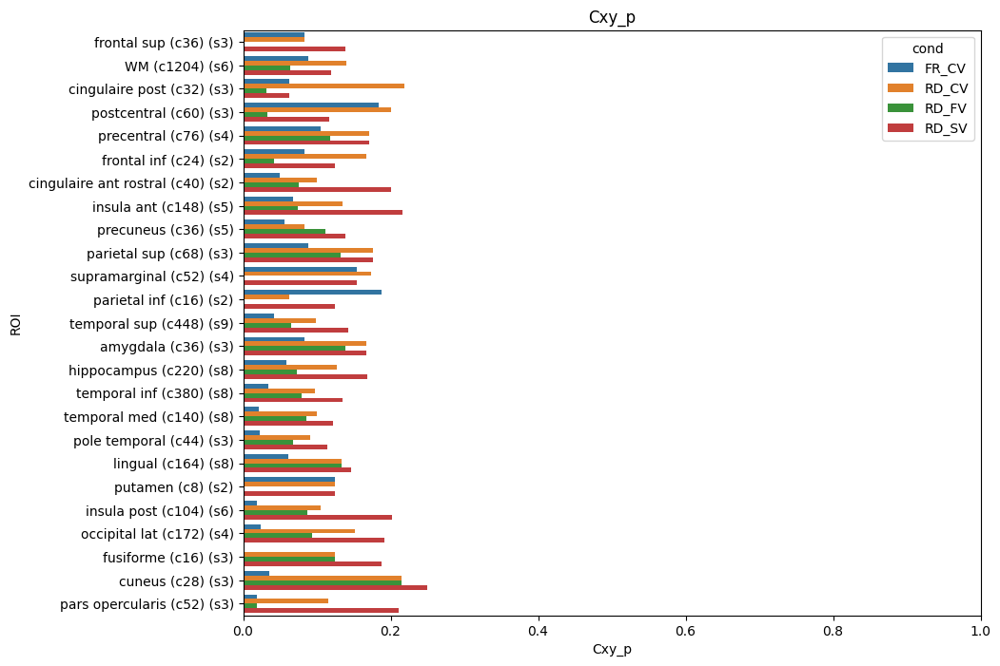

In [31]:
df_plot = df_Cxy_p

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_p', y='ROI', hue='cond', ax=ax)

ROI_labels = []

for ROI_i, ROI in enumerate(Cxy_ROI_list_ALLCOND_filt):

    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0,1)

ax.set_title('Cxy_p')

<Axes: xlabel='cond', ylabel='Cxy_p'>

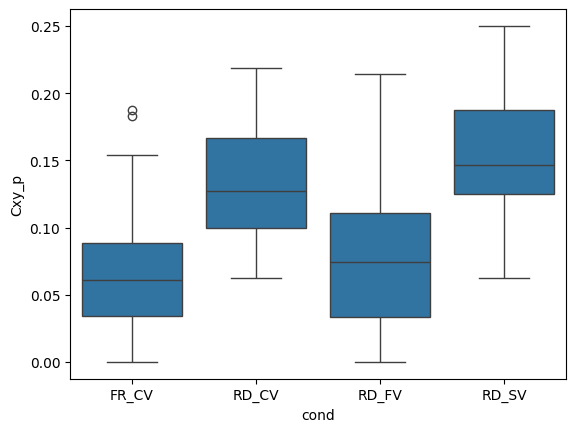

In [32]:
sns.boxplot(data=df_Cxy_p, x="cond", y="Cxy_p")

In [33]:
df_Cxy_allcond_diff = pd.melt(pd.DataFrame({'ROI' : df_Cxy_p.query(f"cond == 'RD_CV'")['ROI'].values,
'RD_CV' : df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'FR_CV'")['Cxy_p'].values}),           

id_vars='ROI', 
value_vars=['RD_CV'], 
var_name='cond', 
value_name='Cxy_p')

Text(0.5, 1.0, 'Cxy_p RD_CV - FR_CV')

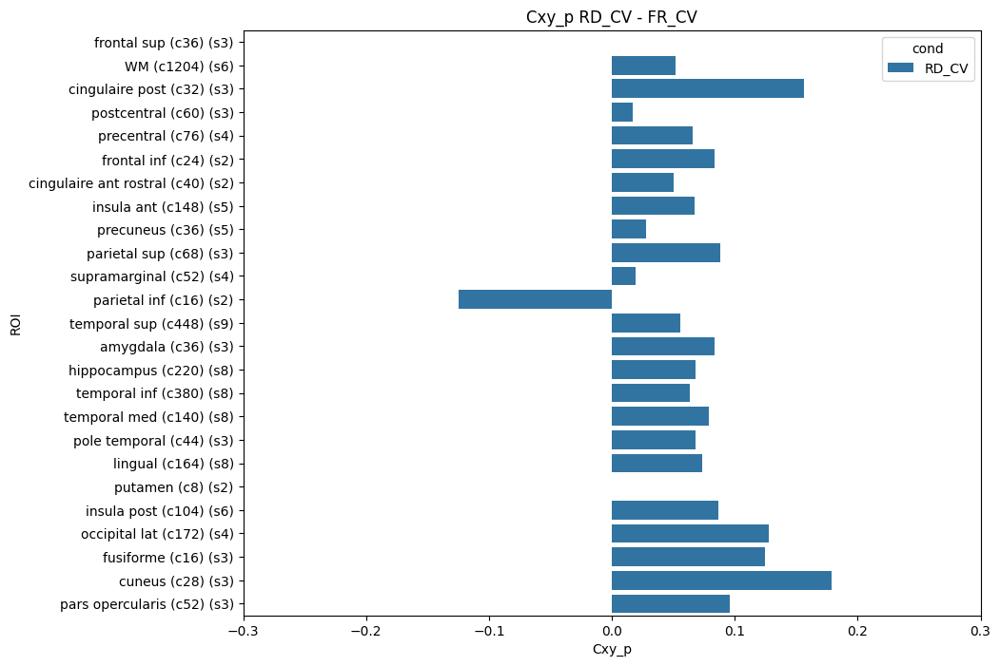

In [34]:
df_plot = df_Cxy_allcond_diff

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_p', y='ROI', hue='cond', ax=ax)

ROI_labels = []

for ROI_i, ROI in enumerate(Cxy_ROI_list_ALLCOND_filt):

    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(-0.3,0.3)

ax.set_title('Cxy_p RD_CV - FR_CV')

In [35]:
df_Cxy_allcond_diff = pd.melt(pd.DataFrame({'ROI' : df_Cxy_p.query(f"cond == 'RD_CV'")['ROI'].values, 'RD_CV' : df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'FR_CV'")['Cxy_p'].values,
'RD_SV' : df_Cxy_p.query(f"cond == 'RD_SV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'FR_CV'")['Cxy_p'].values,
'RD_FV' : df_Cxy_p.query(f"cond == 'RD_FV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'FR_CV'")['Cxy_p'].values}),           

id_vars='ROI', 
value_vars=['RD_CV', 'RD_SV', 'RD_FV'], 
var_name='cond', 
value_name='Cxy_p')

Text(0.5, 1.0, 'Cxy_p - FR_CV')

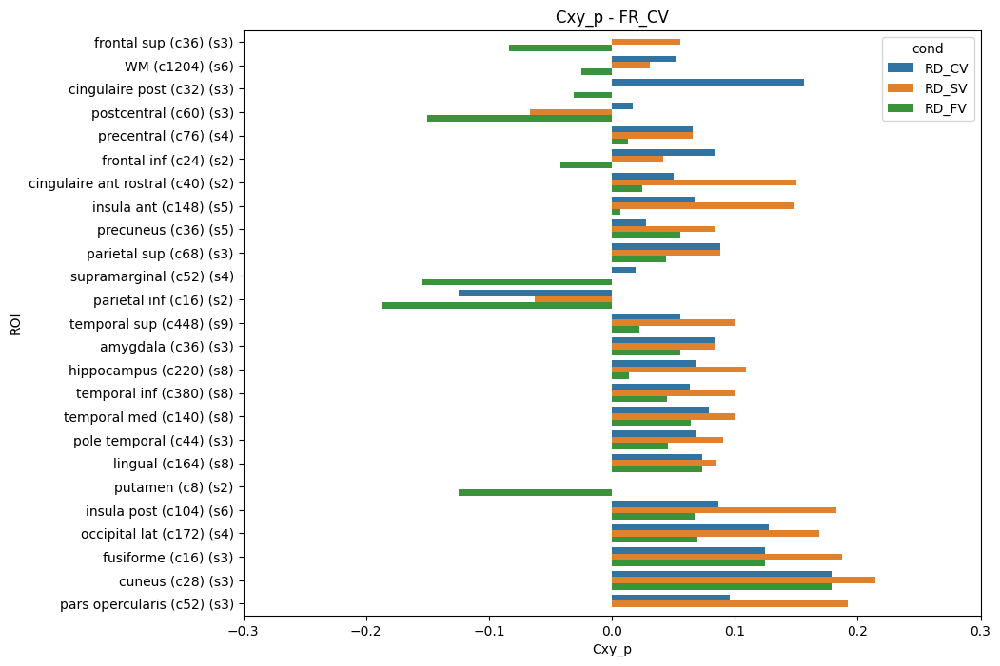

In [36]:
df_plot = df_Cxy_allcond_diff

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_p', y='ROI', hue='cond', ax=ax)

ROI_labels = []

for ROI_i, ROI in enumerate(Cxy_ROI_list_ALLCOND_filt):

    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(-0.3,0.3)

ax.set_title('Cxy_p - FR_CV')

<Axes: xlabel='cond', ylabel='Cxy_p'>

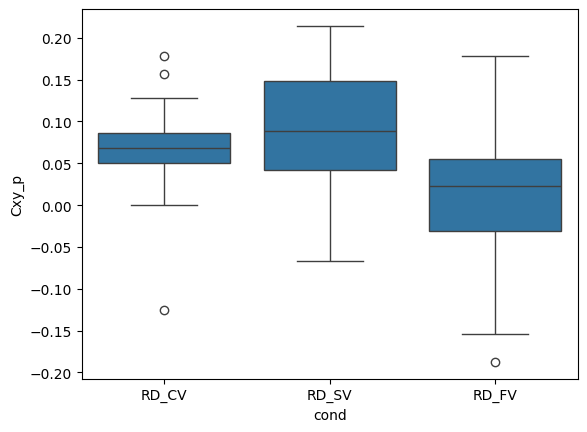

In [37]:
sns.boxplot(data=df_Cxy_allcond_diff, x="cond", y="Cxy_p")

In [38]:
df_Cxy_allcond_diff = pd.melt(pd.DataFrame({'ROI' : df_Cxy_p.query(f"cond == 'RD_CV'")['ROI'].values,
'RD_SV' : df_Cxy_p.query(f"cond == 'RD_SV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values,
'RD_FV' : df_Cxy_p.query(f"cond == 'RD_FV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values}),           

id_vars='ROI', 
value_vars=['RD_SV', 'RD_FV'], 
var_name='cond', 
value_name='Cxy_p')

Text(0.5, 1.0, 'Cxy_p - RD_CV')

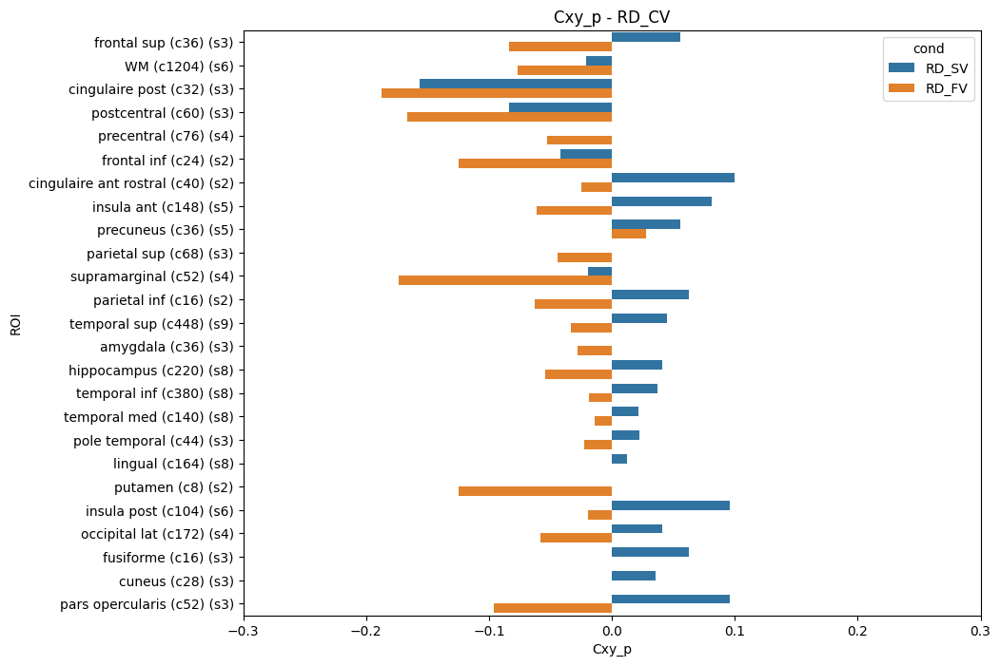

In [39]:
df_plot = df_Cxy_allcond_diff

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_p', y='ROI', hue='cond', ax=ax)

ROI_labels = []

for ROI_i, ROI in enumerate(Cxy_ROI_list_ALLCOND_filt):

    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(-0.3,0.3)

ax.set_title('Cxy_p - RD_CV')

<Axes: xlabel='cond', ylabel='Cxy_p'>

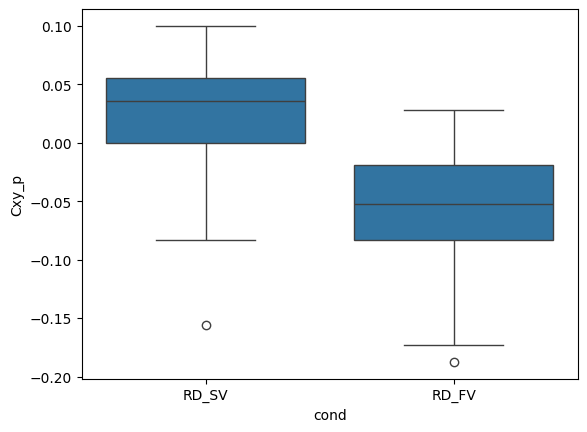

In [40]:
sns.boxplot(data=df_Cxy_allcond_diff, x="cond", y="Cxy_p")

### LMM

In [41]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'Cxy', 'df_lmm'))
df_lmm_allcond = pd.DataFrame()

for ROI in Cxy_ROI_list_ALLCOND_filt:

    _df = pd.read_excel(f'ALLCOND_Cxy_lmm_{ROI}_res_bi.xlsx')
    _df['ROI'] = [ROI] * _df.shape[0]
    df_lmm_allcond = pd.concat([df_lmm_allcond, _df])

In [42]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_ALLCOND_filt:

    coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and term == 'resp'")['estimate'].values[0]
    pval = df_lmm_allcond.query(f"ROI == '{ROI}' and term == 'resp'")['p.value'].values[0]
    intercept = df_lmm_allcond.query(f"ROI == '{ROI}' and term == '(Intercept)'")['estimate'].values[0]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)


df_lmm_allcond_summary = pd.DataFrame(data)
df_lmm_allcond_summary

,ROI,coeff,intercept,pval,p
0,frontal sup,-2.271862,-1.506717,2.169818e-02,1
1,WM,-2.062008,-1.191442,1.744889e-22,1
2,cingulaire post,-1.427829,-1.378055,2.476759e-01,0
3,postcentral,-3.405098,-0.450546,6.292740e-05,1
4,precentral,-1.619970,-0.704078,1.089193e-02,1
5,frontal inf,-0.295029,-1.871467,8.237107e-01,0
6,cingulaire ant rostral,-1.044673,-1.719627,2.826502e-01,0
7,insula ant,-2.806648,-0.678556,1.679724e-09,1
8,precuneus,-2.339366,-1.312704,2.362013e-02,1
9,parietal sup,-2.681185,-0.586603,3.575218e-05,1


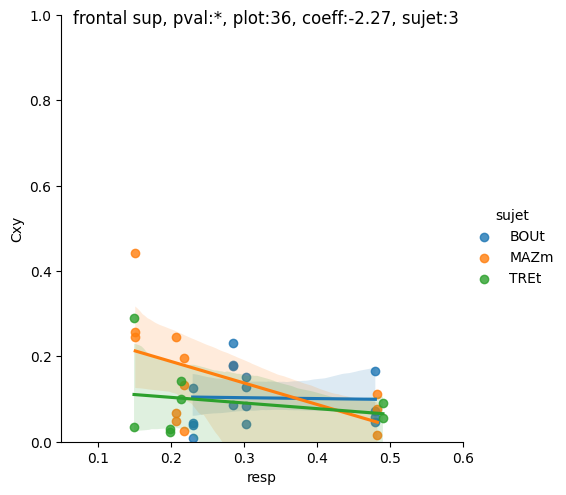

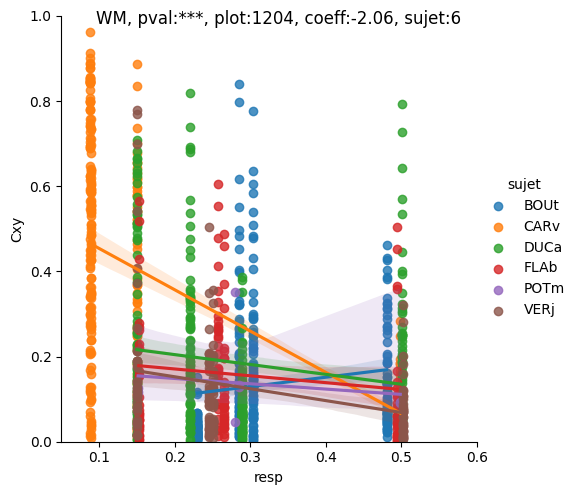

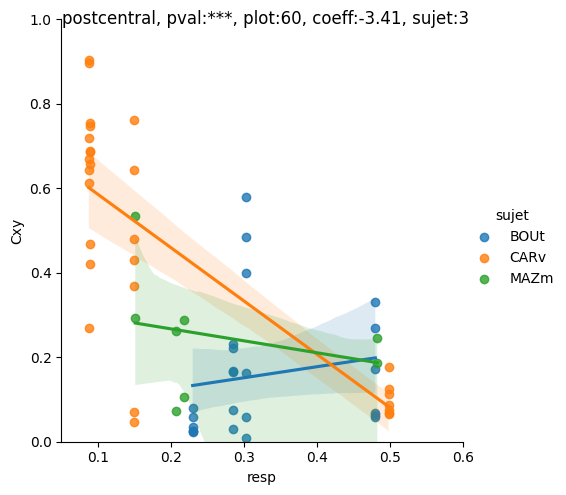

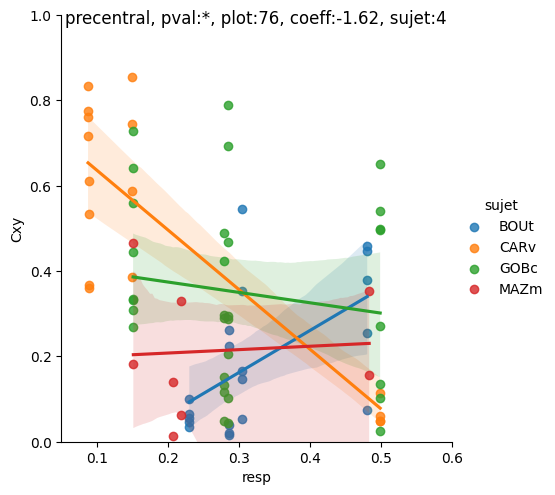

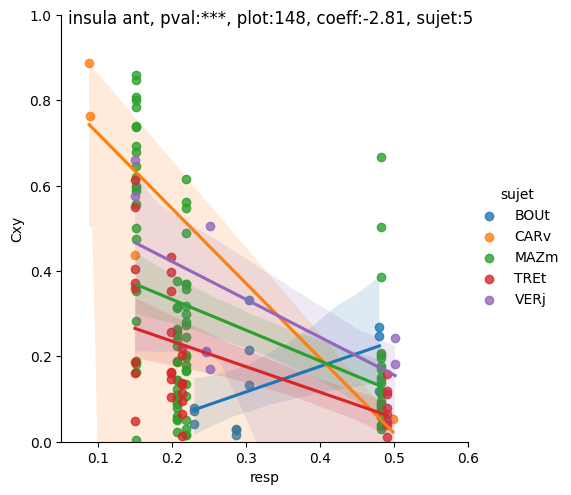

...

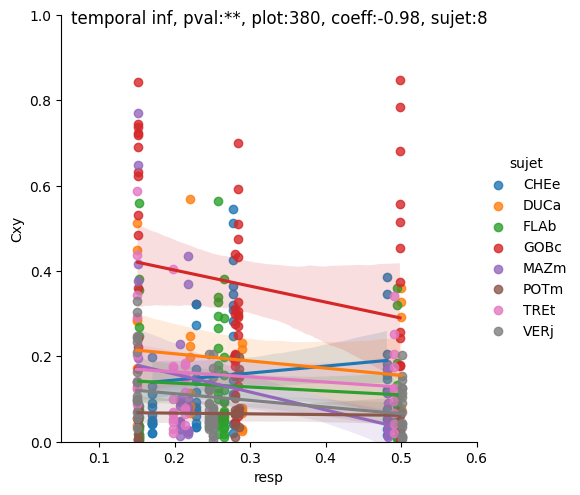

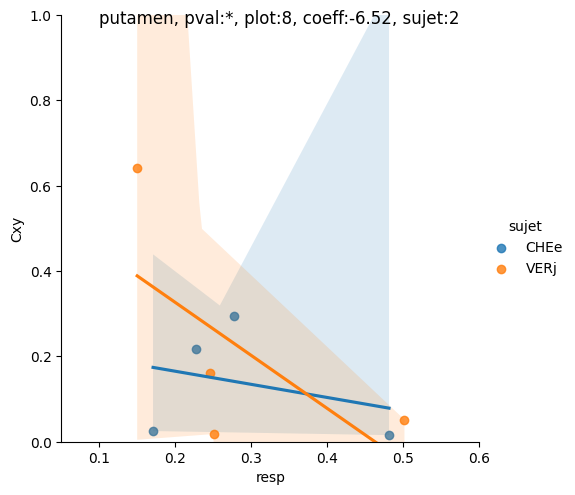

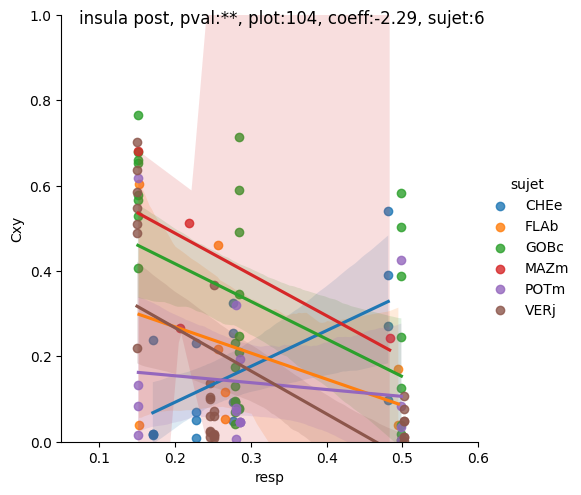

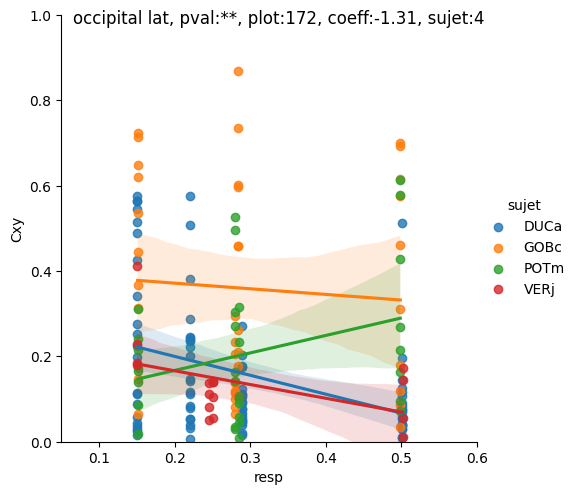

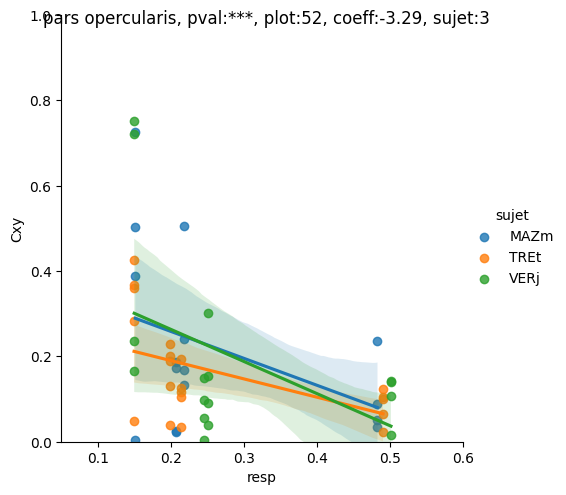

In [43]:
for ROI in Cxy_ROI_list_ALLCOND_filt:

    if df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['p'].values != 1:

        continue 

    _df_Cxy_ALLCOND = df_Cxy_ALLCOND.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]
    
    pval = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", hue='sujet', data=_df_Cxy_ALLCOND)
    _coeff = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_Cxy_ALLCOND['resp'].values*_coeff + df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05, 0.6)
    plt.plot(_df_Cxy_ALLCOND['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{get_pval(pval)}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
        

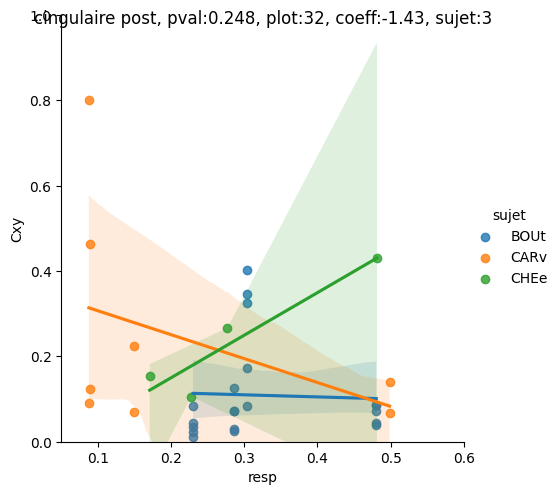

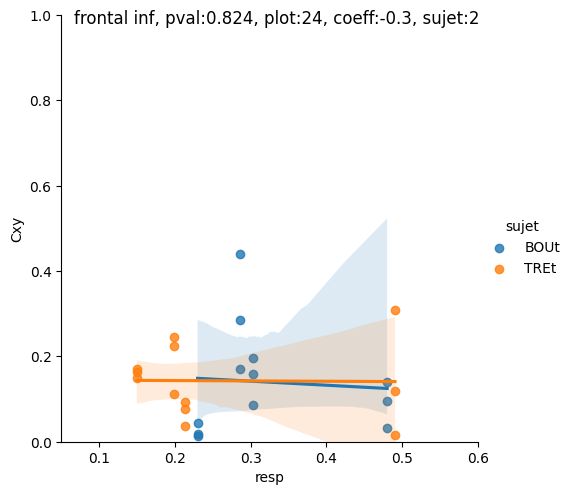

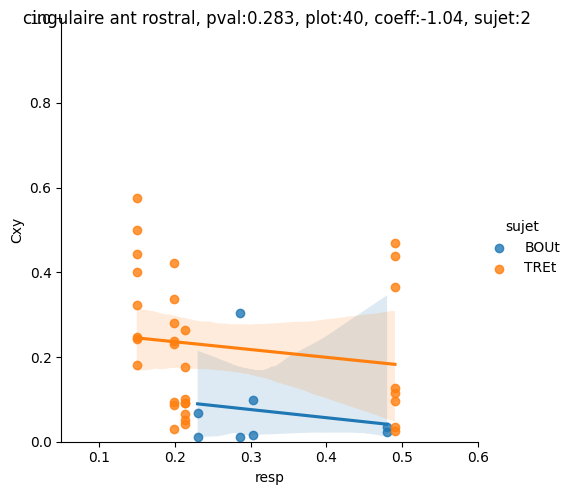

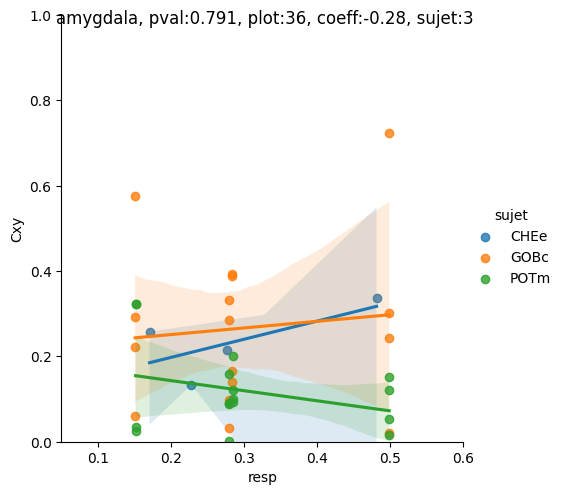

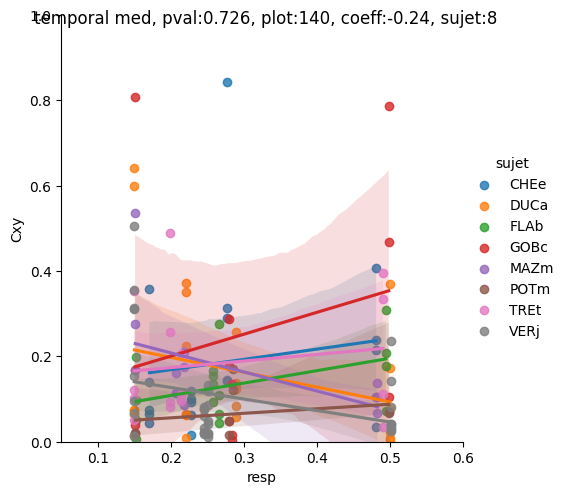

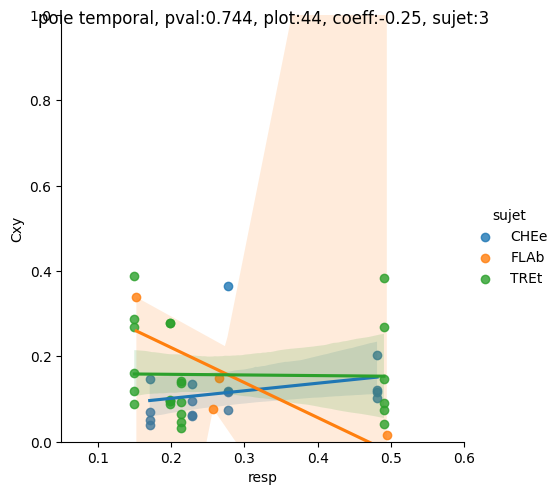

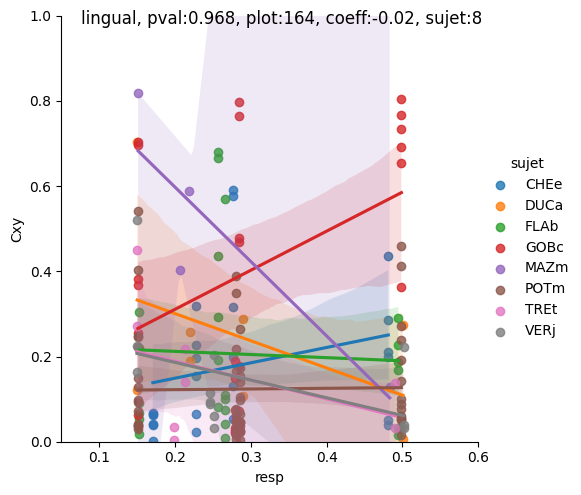

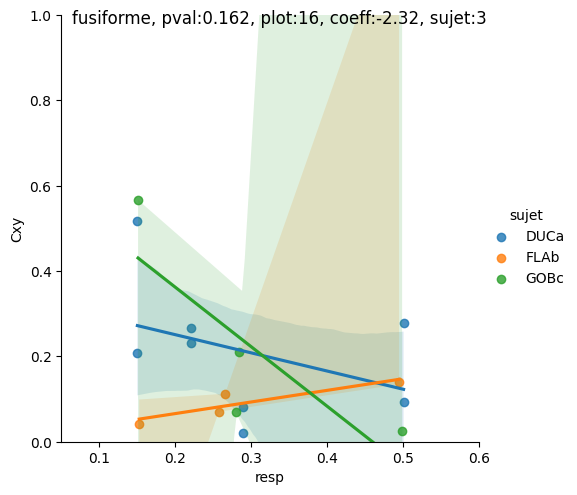

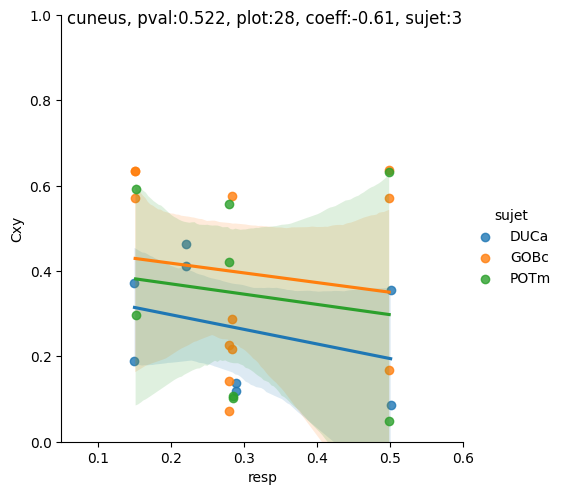

In [44]:
for ROI in Cxy_ROI_list_ALLCOND_filt:

    if df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['p'].values == 1:

        continue 

    _df_Cxy_ALLCOND = df_Cxy_ALLCOND.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]
    
    pval = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", hue='sujet', data=_df_Cxy_ALLCOND)
    _coeff = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_Cxy_ALLCOND['resp'].values*_coeff + df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05, 0.6)
    plt.plot(_df_Cxy_ALLCOND['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{get_pval(np.round(pval,3))}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")

# Pxx

## FR_CV

### PHASE LMM

In [45]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'Pxx', 'df_lmm'))
df_lmm_FR_CV = pd.DataFrame()

for ROI in Pxx_ROI_list_FR_CV_filt:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'FR_CV_Pxx_lmm_{ROI}_{band}_res_bi.xlsx')
        _df['ROI'] = [ROI] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_FR_CV = pd.concat([df_lmm_FR_CV, _df])

In [46]:
data = {'ROI' : [], 'band' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for ROI in Pxx_ROI_list_FR_CV_filt:

    for band in freq_band_dict_FC_lmm['wb']:

        df = df_lmm_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'")
        _estimate = df.query("term == 'phaseinspi'")['estimate'].iloc[0]
        pval = df.query("term == 'phaseinspi'")['p.value'].iloc[0]
        if pval < 0.05:
            p = 1
        else:
            p = 0

        data['ROI'].append(ROI)
        data['band'].append(band)
        data['estimate'].append(_estimate)
        data['pval'].append(pval)
        data['p'].append(p)

df_phase_FR_CV_pval = pd.DataFrame(data)
df_phase_FR_CV_pval


,ROI,band,estimate,pval,p
0,amygdala,theta,0.029251,0.001436,1
1,amygdala,alpha,0.029668,0.007951,1
2,amygdala,beta,0.007648,0.278281,0
3,amygdala,gamma,0.001152,0.748037,0
4,temporal sup,theta,0.006712,0.100688,0
...,...,...,...,...,...
83,cingulaire ant caudal,gamma,-0.004583,0.363378,0
84,parahippocampique,theta,0.030797,0.048825,1
85,parahippocampique,alpha,0.047042,0.074134,0
86,parahippocampique,beta,0.029210,0.010920,1


In [47]:
ROI_labels = []

for ROI in df_phase_FR_CV_pval.query("p == 1")['ROI'].unique():
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"{ROI} (c{_count_plot}) (s{_count_sujet})")


/tmp/ipykernel_494082/90455578.py:2: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot.query("p == 1"), x='ROI', y='estimate', hue='band', join=False)
/tmp/ipykernel_494082/90455578.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(ROI_labels)


Text(0.5, 0.98, 'FR_CV')

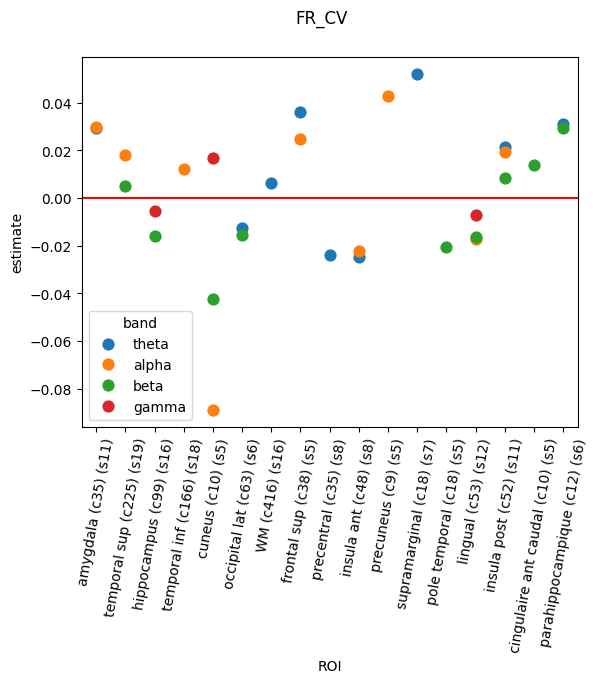

In [48]:
df_plot = df_phase_FR_CV_pval
g = sns.pointplot(data=df_plot.query("p == 1"), x='ROI', y='estimate', hue='band', join=False)
g.axhline(0, color='r')
g.set_xticklabels(ROI_labels)
plt.xticks(rotation=80)
plt.suptitle('FR_CV')

/tmp/ipykernel_494082/195286412.py:2: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot.query("p == 1"), x='estimate', y='ROI', hue='band', join=False)
/tmp/ipykernel_494082/195286412.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_yticklabels(ROI_labels)


Text(0.5, 0.98, 'FR_CV')

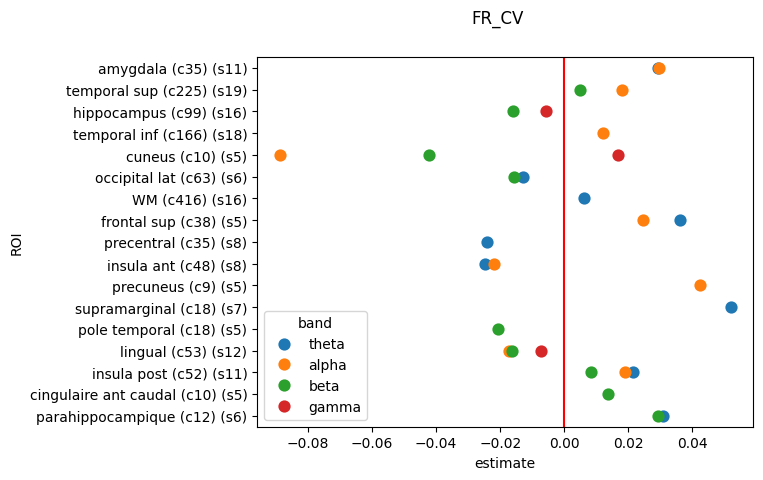

In [49]:
df_plot = df_phase_FR_CV_pval
g = sns.pointplot(data=df_plot.query("p == 1"), x='estimate', y='ROI', hue='band', join=False)
g.axvline(0, color='r')
g.set_yticklabels(ROI_labels)
plt.suptitle('FR_CV')

### Spearman allplot

In [50]:
def spearman_permutation_test(x, y, n_perm, percentile_thresh_list):

    rho_obs, _ = scipy.stats.spearmanr(x, y)

    null_dist = np.zeros(n_perm)
    for i in range(n_perm):
        y_perm = np.random.permutation(y)
        null_dist[i], _ = scipy.stats.spearmanr(x, y_perm)

    signi = rho_obs > np.percentile(null_dist, percentile_thresh_list[1]) or rho_obs < np.percentile(null_dist, percentile_thresh_list[0])

    return rho_obs, signi

percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 500

data = {'ROI': [], 'band' : [], 'phase' : [], 'rho': [], 'signi': []}

for ROI in Pxx_ROI_list_FR_CV_filt:

    for band in freq_band_dict_FC_lmm['wb']:

        for phase in ['inspi', 'expi']:

            _df = df_Pxx_FR_CV.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")[['Pxx', 'resp']]

            x = _df['resp'].values
            y = _df['Pxx'].values

            rho, signi = spearman_permutation_test(x, y, n_perm_spearman, percentile_thresh_list)

            data['ROI'].append(ROI)
            data['band'].append(band)
            data['phase'].append(phase)
            data['rho'].append(rho)
            data['signi'].append(signi)

# Build dataframe
df_spearman = pd.DataFrame(data)


/tmp/ipykernel_494082/1914919028.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


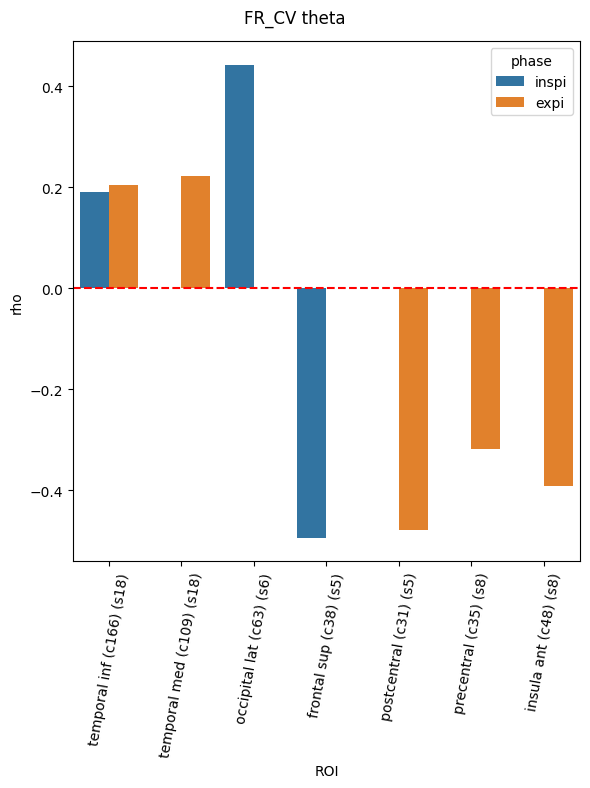

/tmp/ipykernel_494082/1914919028.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


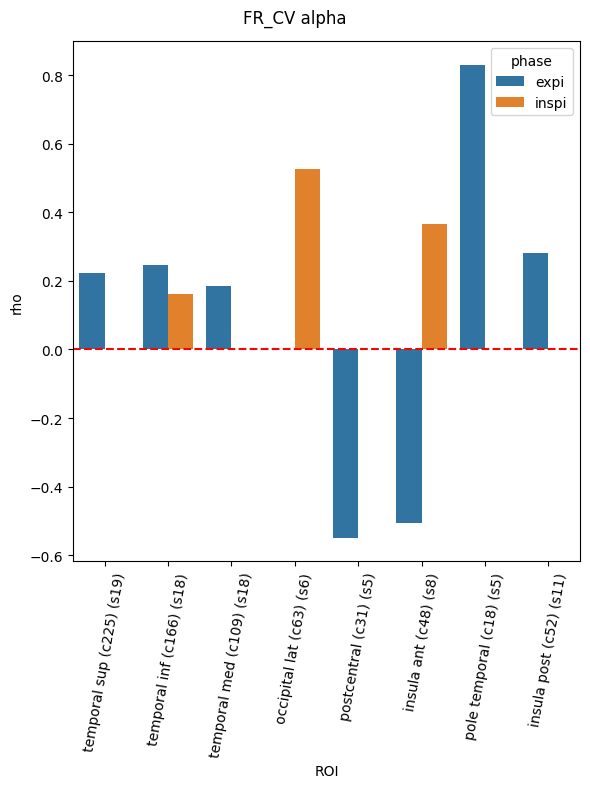

/tmp/ipykernel_494082/1914919028.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


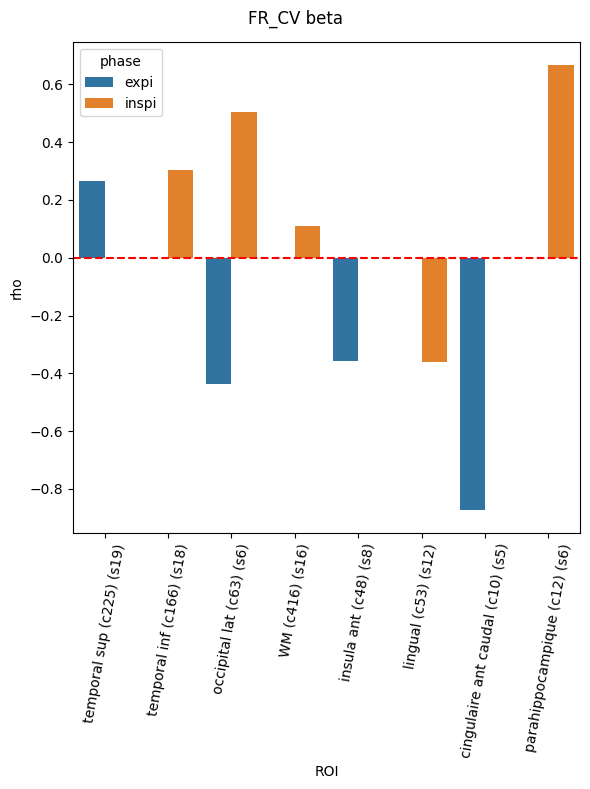

/tmp/ipykernel_494082/1914919028.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


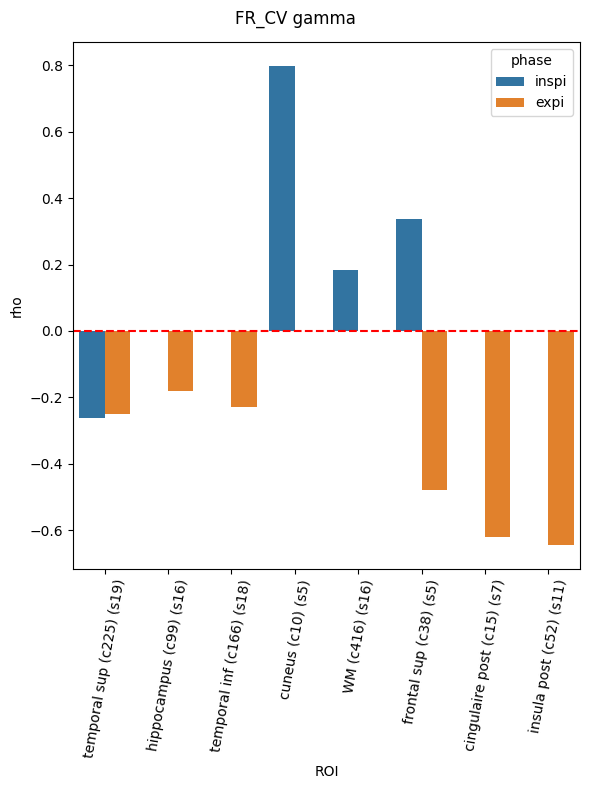

In [51]:
for band in freq_band_dict_FC_lmm['wb']:

    df_plot = df_spearman.query(f"signi == True and band == '{band}'")

    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"{ROI} (c{_count_plot}) (s{_count_sujet})")

    plt.figure(figsize=(6, 8))
    ax = sns.barplot(data=df_plot, x='ROI', y='rho', hue='phase')
    ax.axhline(0, color='r', linestyle='--')
    ax.set_xticklabels(ROI_labels, rotation=80)
    plt.suptitle(f"FR_CV {band}")
    plt.tight_layout()
    plt.show()

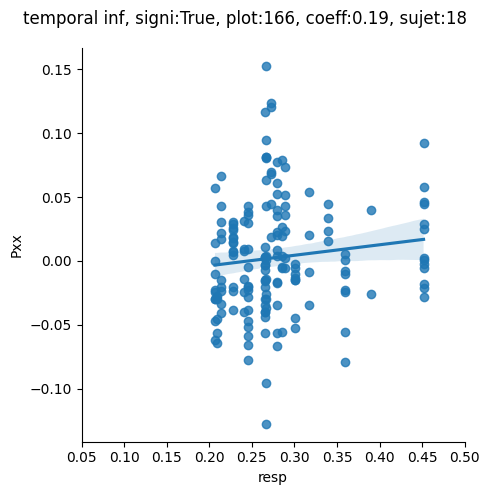

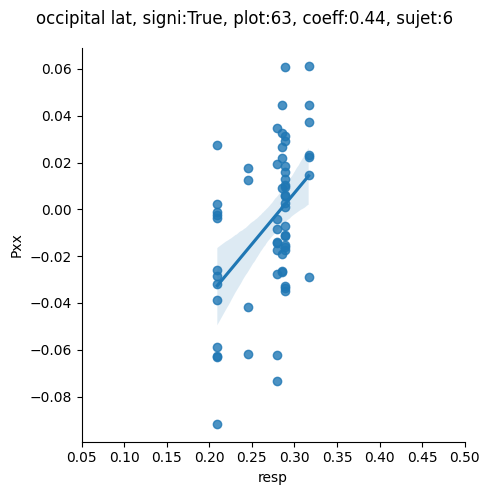

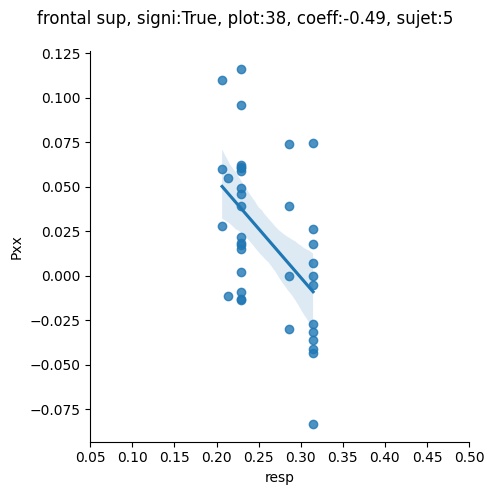

In [52]:
band = 'theta'
phase = 'inspi'

df_select_signi = df_spearman.query(f"signi == True and band == '{band}' and phase == '{phase}'")

for ROI in df_select_signi['ROI'].unique():
    
    df_plot = df_Pxx_FR_CV.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")
    sns.lmplot(x="resp", y="Pxx", data=df_plot)
    _coeff = df_spearman.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")['rho'].values[0]
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:True, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

## ALL CONDITIONS

### LMM

In [53]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'Pxx', 'df_lmm'))
df_lmm_allcond = pd.DataFrame()

for ROI in Pxx_ROI_list_ALLCOND_filt:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'ALLCOND_Pxx_lmm_{ROI}_{band}_res_bi.xlsx')
        _df['ROI'] = [ROI] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_allcond = pd.concat([df_lmm_allcond, _df])

In [54]:
df_lmm_allcond

,term,estimate,std.error,statistic,p.value,conf.low,conf.high,ROI,band,effect,df
0,(Intercept),-0.031589,0.012172,-2.595255,0.011708,-0.055904,-0.007273,frontal sup,theta,NaN,NaN
1,phaseinspi,0.067761,0.017213,3.936516,0.000207,0.033373,0.102148,frontal sup,theta,NaN,NaN
2,condRD_CV,0.019437,0.017213,1.129152,0.263048,-0.014951,0.053824,frontal sup,theta,NaN,NaN
3,condRD_FV,0.056556,0.017213,3.285570,0.001654,0.022168,0.090943,frontal sup,theta,NaN,NaN
4,condRD_SV,0.033897,0.017213,1.969198,0.053263,-0.000491,0.068284,frontal sup,theta,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
3,condRD_FV,-0.004866,0.003156,-1.541857,0.126467,-0.011132,0.001400,pars opercularis,gamma,fixed,94.031135
4,condRD_SV,0.001389,0.003156,0.440254,0.660763,-0.004877,0.007655,pars opercularis,gamma,fixed,94.031135
5,phaseinspi:condRD_CV,0.003843,0.004463,0.861067,0.391392,-0.005018,0.012704,pars opercularis,gamma,fixed,94.031135
6,phaseinspi:condRD_FV,0.003567,0.004463,0.799248,0.426161,-0.005294,0.012428,pars opercularis,gamma,fixed,94.031135


In [55]:
data = {'ROI' : [], 'band' : [], 'phase' :[], 'cond' : [], 'coeff' : [], 'pval' : [], 'p' : []}

for ROI in Pxx_ROI_list_ALLCOND_filt:

    for band in freq_band_dict_FC_lmm['wb']:

        for phase in ['inspi', 'expi']:

            for cond in conditions:

                if cond == 'FR_CV' and phase == 'expi':

                    coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == '(Intercept)'")['estimate'].values[0]
                    pval = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == '(Intercept)'")['p.value'].values[0]

                    if pval < 0.05:

                        p = 1

                    else:

                        p = 0

                    data['ROI'].append(ROI)
                    data['band'].append(band)
                    data['phase'].append(phase)
                    data['cond'].append(cond)
                    data['coeff'].append(coeff)
                    data['pval'].append(pval)
                    data['p'].append(p)

                elif cond == 'FR_CV' and phase != 'expi':

                    coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'phaseinspi'")['estimate'].values[0]
                    pval = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'phaseinspi'")['p.value'].values[0]

                    if pval < 0.05:

                        p = 1

                    else:

                        p = 0

                    data['ROI'].append(ROI)
                    data['band'].append(band)
                    data['phase'].append(phase)
                    data['cond'].append(cond)
                    data['coeff'].append(coeff)
                    data['pval'].append(pval)
                    data['p'].append(p)

                elif cond != 'FR_CV' and phase == 'expi':

                    coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'cond{cond}'")['estimate'].values[0]
                    pval = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'cond{cond}'")['p.value'].values[0]

                    if pval < 0.05:

                        p = 1

                    else:

                        p = 0

                    data['ROI'].append(ROI)
                    data['band'].append(band)
                    data['phase'].append(phase)
                    data['cond'].append(cond)
                    data['coeff'].append(coeff)
                    data['pval'].append(pval)
                    data['p'].append(p)

                else:

                    coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'phaseinspi:cond{cond}'")['estimate'].values[0]
                    pval = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'phaseinspi:cond{cond}'")['p.value'].values[0]

                    if pval < 0.05:

                        p = 1

                    else:

                        p = 0

                    data['ROI'].append(ROI)
                    data['band'].append(band)
                    data['phase'].append(phase)
                    data['cond'].append(cond)
                    data['coeff'].append(coeff)
                    data['pval'].append(pval)
                    data['p'].append(p)

df_lmm_allcond_summary = pd.DataFrame(data)
df_lmm_allcond_summary

,ROI,band,phase,cond,coeff,pval,p
0,frontal sup,theta,inspi,FR_CV,0.067761,0.000207,1
1,frontal sup,theta,inspi,RD_CV,-0.037127,0.132153,0
2,frontal sup,theta,inspi,RD_FV,-0.073118,0.003804,1
3,frontal sup,theta,inspi,RD_SV,-0.062744,0.012267,1
4,frontal sup,theta,expi,FR_CV,-0.031589,0.011708,1
...,...,...,...,...,...,...,...
763,pars opercularis,gamma,inspi,RD_SV,-0.004956,0.269578,0
764,pars opercularis,gamma,expi,FR_CV,-0.001436,0.549641,0
765,pars opercularis,gamma,expi,RD_CV,-0.003821,0.229057,0
766,pars opercularis,gamma,expi,RD_FV,-0.004866,0.126467,0


/tmp/ipykernel_494082/1729624864.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


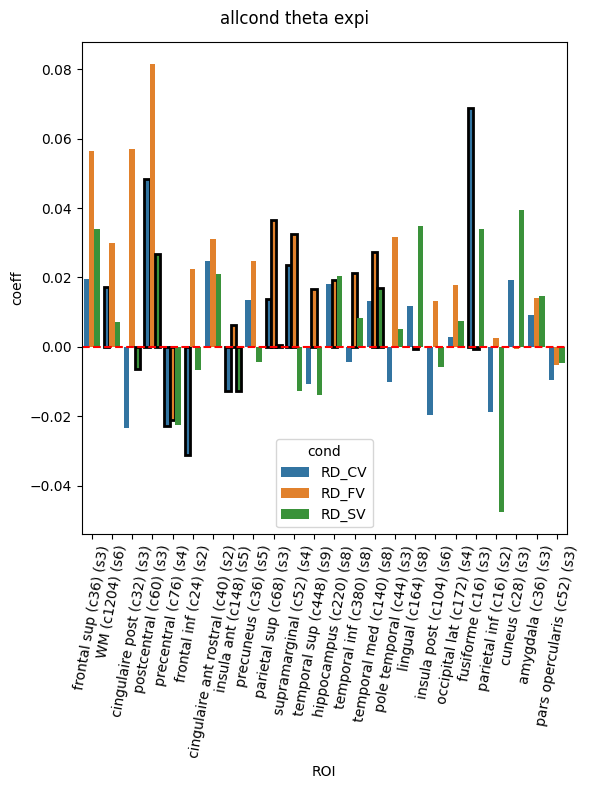

/tmp/ipykernel_494082/1729624864.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


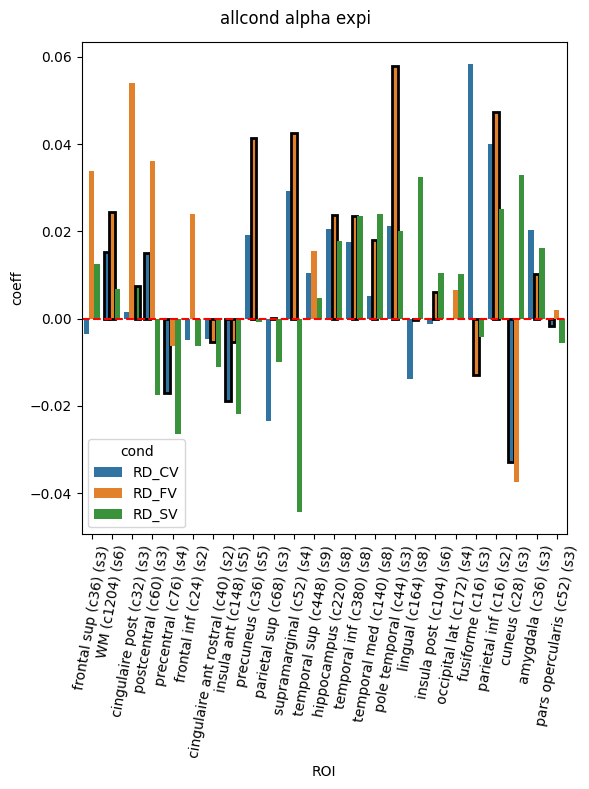

/tmp/ipykernel_494082/1729624864.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


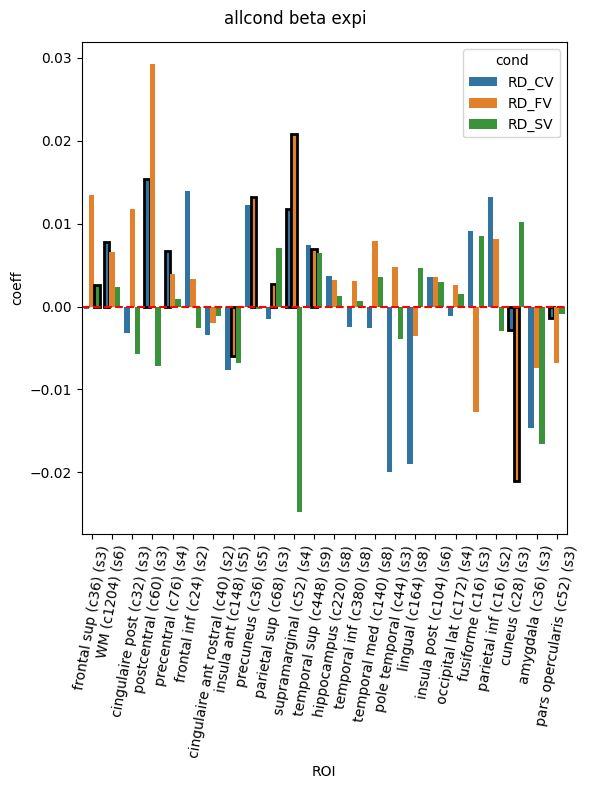

/tmp/ipykernel_494082/1729624864.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


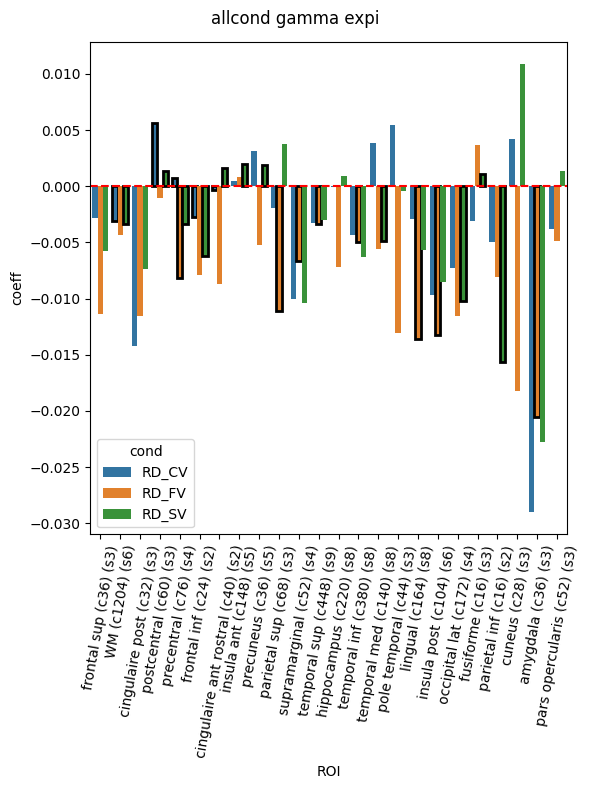

In [56]:
phase = 'expi'

for band in freq_band_dict_FC_lmm['wb']:

    # Include both p == 0 and p == 1
    df_plot = df_lmm_allcond_summary.query(f"band == '{band}' and phase == '{phase}' and cond != 'FR_CV' ")

    # Create annotated ROI labels
    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"{ROI} (c{_count_plot}) (s{_count_sujet})")

    # Plot
    plt.figure(figsize=(6, 8))
    ax = sns.barplot(data=df_plot, x='ROI', y='coeff', hue='cond')

    # Horizontal line at 0
    ax.axhline(0, color='r', linestyle='--')

    # Set custom x-tick labels
    ax.set_xticklabels(ROI_labels, rotation=80)

    # Add black border to bars where p == 1
    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['p'] == 1:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    plt.suptitle(f"allcond {band} {phase}")
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_494082/3948892220.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


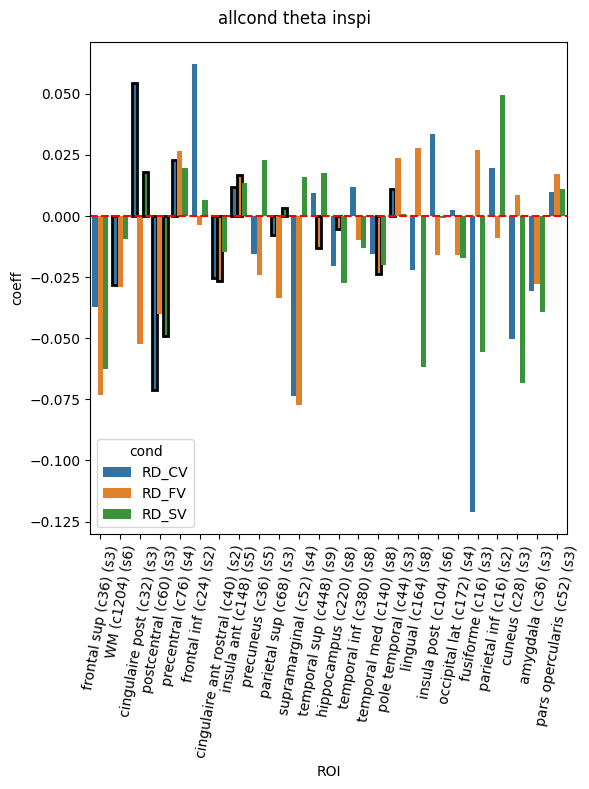

/tmp/ipykernel_494082/3948892220.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


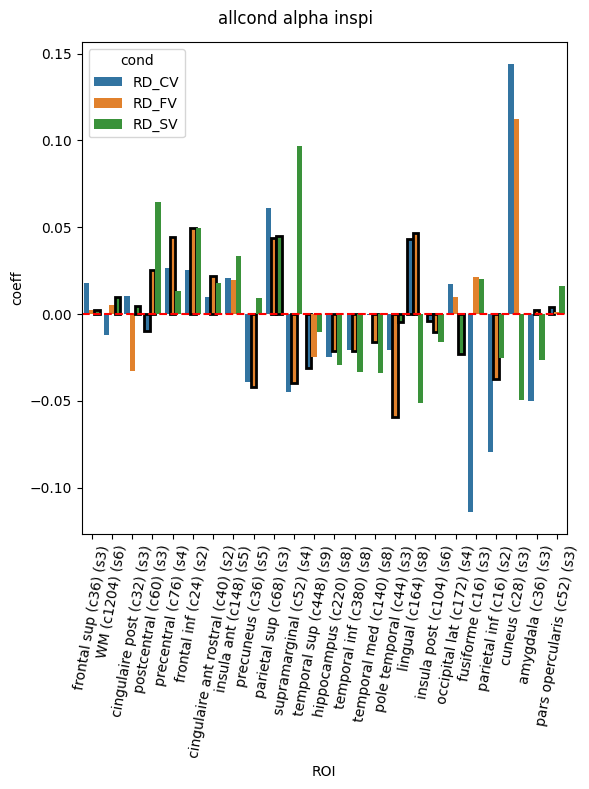

/tmp/ipykernel_494082/3948892220.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


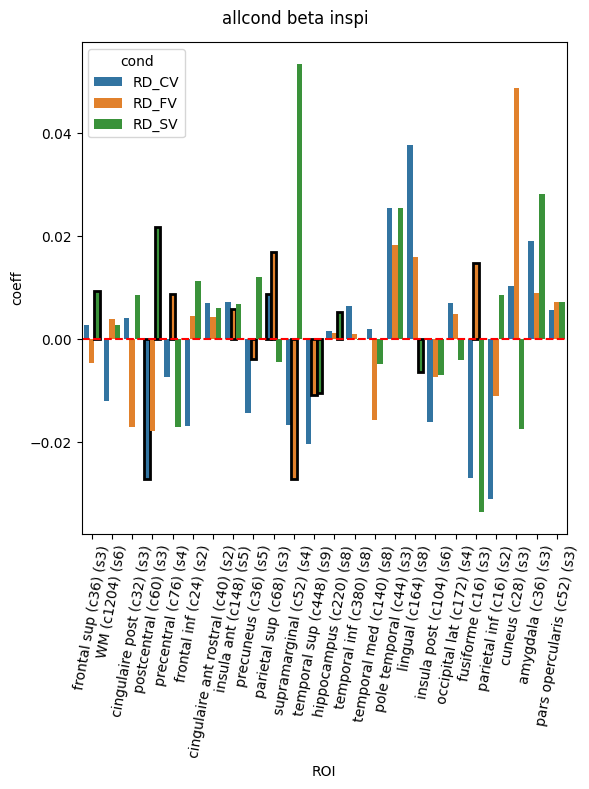

/tmp/ipykernel_494082/3948892220.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


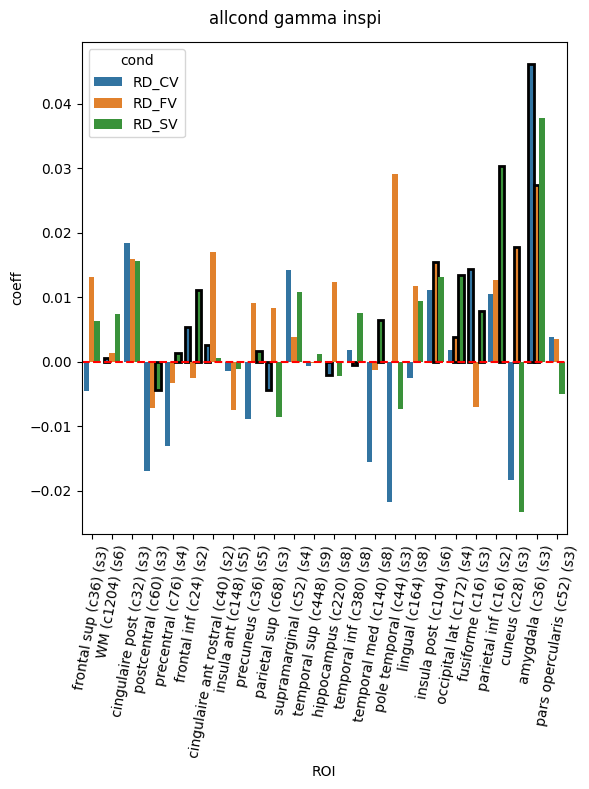

In [58]:
phase = 'inspi'

for band in freq_band_dict_FC_lmm['wb']:

    # Include both p == 0 and p == 1
    df_plot = df_lmm_allcond_summary.query(f"band == '{band}' and phase == '{phase}' and cond != 'FR_CV'")

    # Create annotated ROI labels
    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"{ROI} (c{_count_plot}) (s{_count_sujet})")

    # Plot
    plt.figure(figsize=(6, 8))
    ax = sns.barplot(data=df_plot, x='ROI', y='coeff', hue='cond')

    # Horizontal line at 0
    ax.axhline(0, color='r', linestyle='--')

    # Set custom x-tick labels
    ax.set_xticklabels(ROI_labels, rotation=80)

    # Add black border to bars where p == 1
    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['p'] == 1:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    plt.suptitle(f"allcond {band} {phase}")
    plt.tight_layout()
    plt.show()


### Spearman allplot

In [59]:
def spearman_permutation_test(x, y, n_perm, percentile_thresh_list):

    rho_obs, _ = scipy.stats.spearmanr(x, y)

    null_dist = np.zeros(n_perm)
    for i in range(n_perm):
        y_perm = np.random.permutation(y)
        null_dist[i], _ = scipy.stats.spearmanr(x, y_perm)

    signi = rho_obs > np.percentile(null_dist, percentile_thresh_list[1]) or rho_obs < np.percentile(null_dist, percentile_thresh_list[0])

    return rho_obs, signi

percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 500

data = {'ROI': [], 'band' : [], 'phase' : [], 'rho': [], 'signi': []}

for ROI in Pxx_ROI_list_ALLCOND_filt:

    for band in freq_band_dict_FC_lmm['wb']:

        for phase in ['inspi', 'expi']:

            _df = df_Pxx_ALLCOND.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")[['Pxx', 'resp']]

            x = _df['resp'].values
            y = _df['Pxx'].values

            rho, signi = spearman_permutation_test(x, y, n_perm_spearman, percentile_thresh_list)

            data['ROI'].append(ROI)
            data['band'].append(band)
            data['phase'].append(phase)
            data['rho'].append(rho)
            data['signi'].append(signi)

# Build dataframe
df_spearman = pd.DataFrame(data)

/tmp/ipykernel_494082/1980368432.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


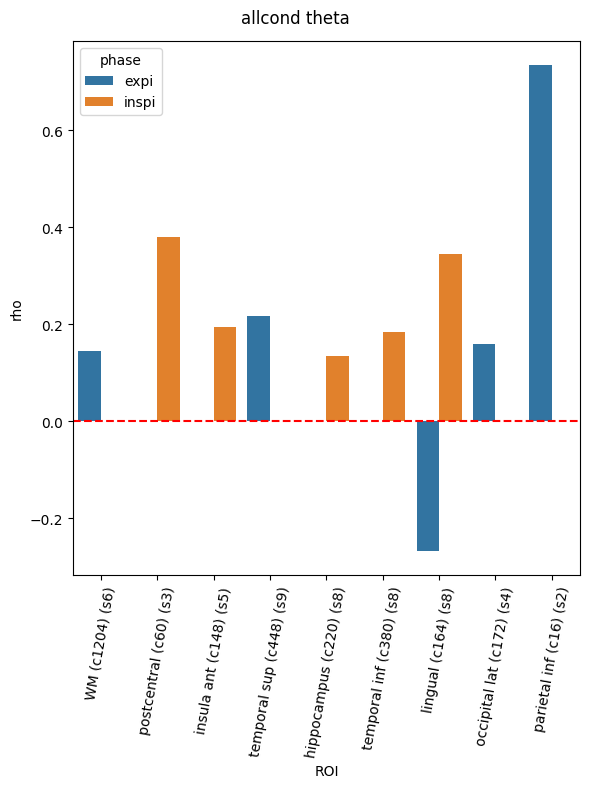

/tmp/ipykernel_494082/1980368432.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


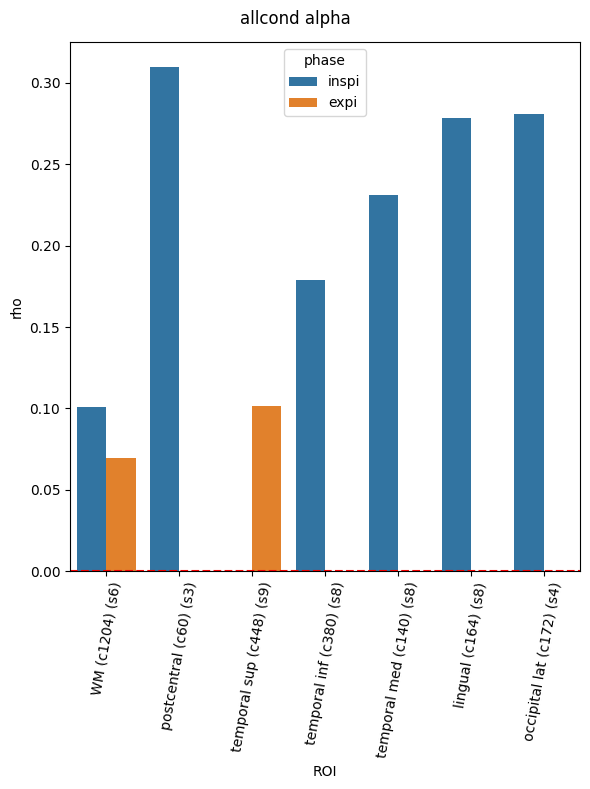

/tmp/ipykernel_494082/1980368432.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


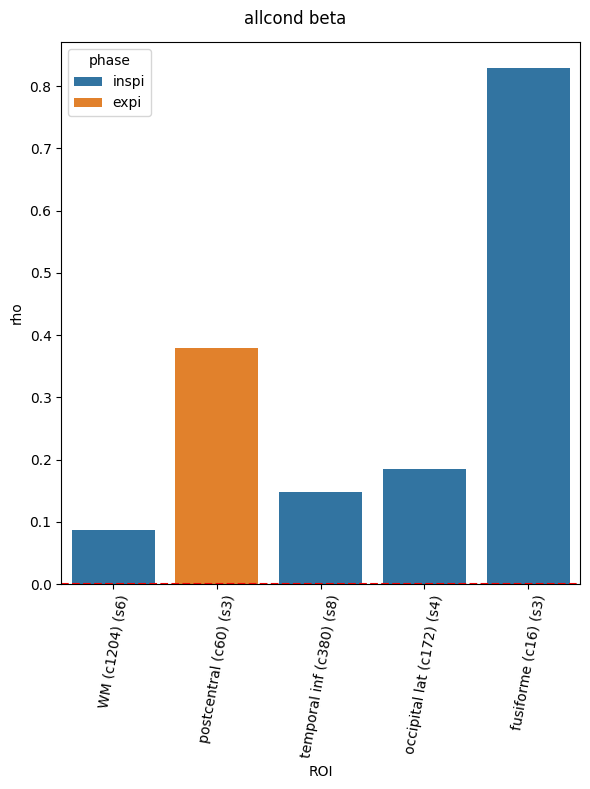

/tmp/ipykernel_494082/1980368432.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ROI_labels, rotation=80)


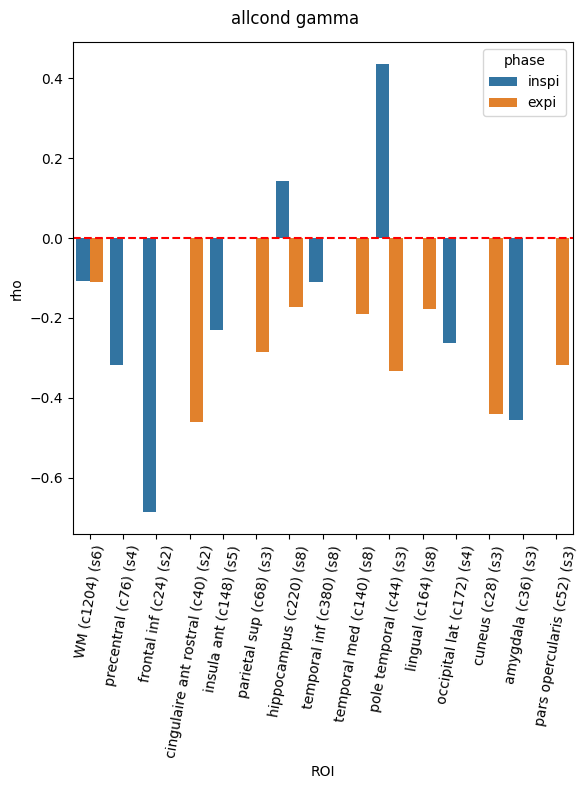

In [60]:
for band in freq_band_dict_FC_lmm['wb']:

    df_plot = df_spearman.query(f"signi == True and band == '{band}'")

    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"{ROI} (c{_count_plot}) (s{_count_sujet})")

    plt.figure(figsize=(6, 8))
    ax = sns.barplot(data=df_plot, x='ROI', y='rho', hue='phase')
    ax.axhline(0, color='r', linestyle='--')
    ax.set_xticklabels(ROI_labels, rotation=80)
    plt.suptitle(f"allcond {band}")
    plt.tight_layout()
    plt.show()

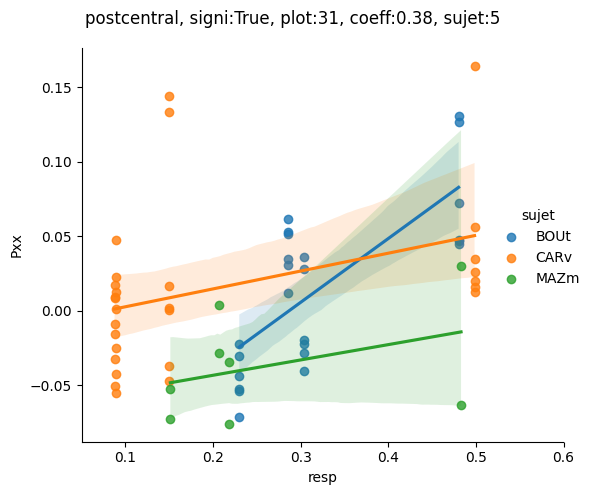

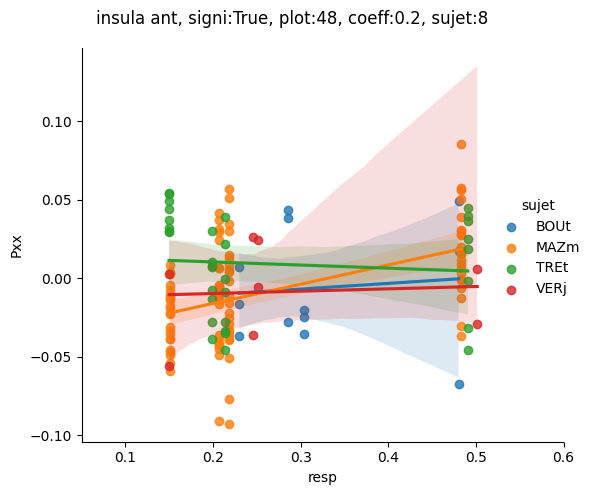

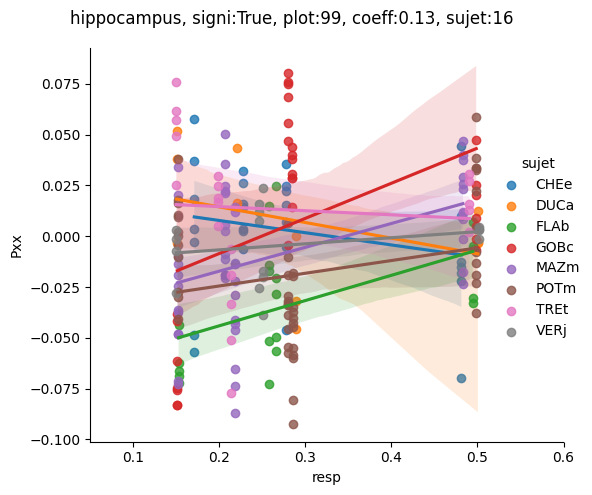

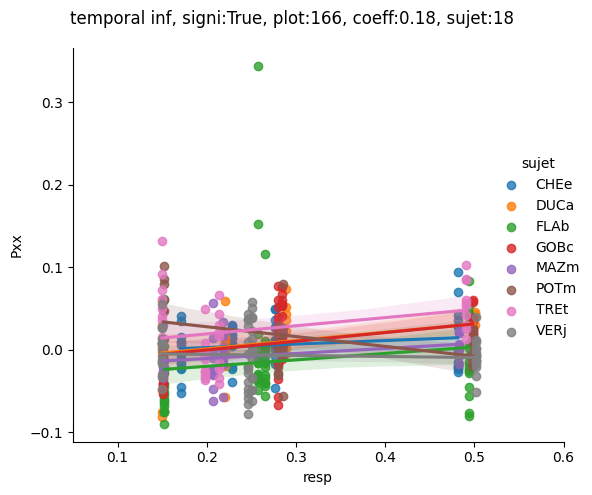

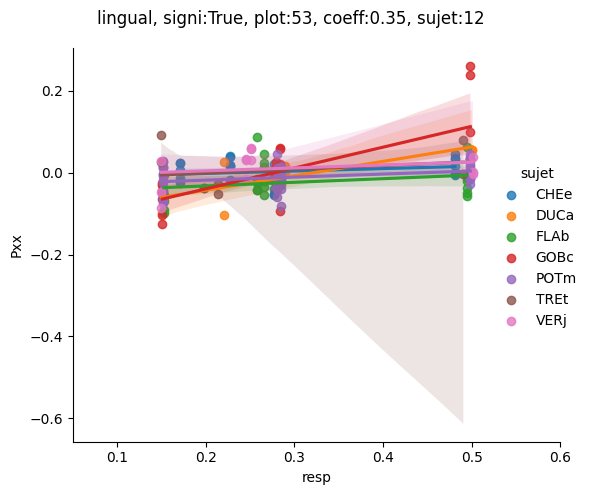

In [61]:
band = 'theta'
phase = 'inspi'

df_select_signi = df_spearman.query(f"signi == True and band == '{band}' and phase == '{phase}'")

for ROI in df_select_signi['ROI'].unique():
    
    df_plot = df_Pxx_ALLCOND.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")
    sns.lmplot(x="resp", y="Pxx", hue='sujet', data=df_plot)
    _coeff = df_spearman.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")['rho'].values[0]
    plt.xlim(0.05,0.6)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:True, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

# DFC

## FR_CV

### ANATOMY

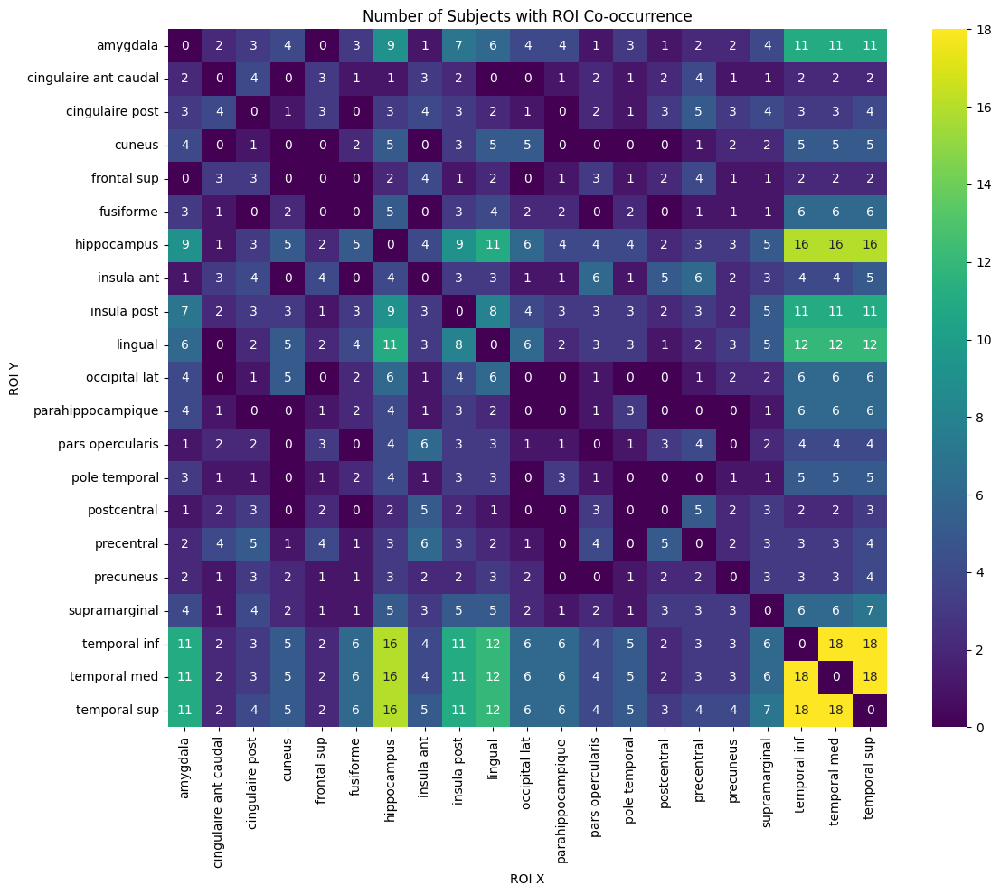

In [62]:
sujet_roi_map = df_Cxy_FR_CV.query(f"ROI != 'WM'").groupby('sujet')['ROI'].unique()

# Get the full unique ROI list
all_rois = np.unique(df_Cxy_FR_CV.query(f"ROI != 'WM'")['ROI'])

# Create an empty DataFrame to store counts
roi_matrix = pd.DataFrame(0, index=all_rois, columns=all_rois)

# Count co-occurrence
for rois in sujet_roi_map:
    for roi1 in rois:
        for roi2 in rois:
            if roi1 == roi2:
                continue
            roi_matrix.loc[roi1, roi2] += 1

plt.figure(figsize=(12, 10))
sns.heatmap(roi_matrix, annot=True, fmt="d", cmap="viridis")
plt.title("Number of Subjects with ROI Co-occurrence")
plt.ylabel("ROI Y")
plt.xlabel("ROI X")
plt.tight_layout()
plt.show()

### LMM

In [63]:
pairs_to_compute = []

for pair_A_i, pair_A in enumerate(ROI_list_dfc):
    
    for pair_B_i, pair_B in enumerate(ROI_list_dfc):

        if pair_A == pair_B or f'{pair_A}-{pair_B}' in pairs_to_compute or f'{pair_B}-{pair_A}' in pairs_to_compute:
            continue

        pairs_to_compute.append(f'{pair_A}-{pair_B}')


pair_list = ['-'.join(sorted(pair.split('-'))) for pair in pairs_to_compute]

In [90]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'FC', 'df_lmm'))
df_lmm_FR_CV = pd.DataFrame()

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'lmm_{pair}_{band}_res_FC_FR_CV_bi.xlsx')
        _df['pair'] = [pair] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_FR_CV = pd.concat([df_lmm_FR_CV, _df])

In [65]:
data = {'pair' : [], 'band' : [], 'phase' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        for phase in ['I', 'IE', 'E', 'EI']:

            if phase == 'I':
                    
                _term = '(Intercept)'

            else:

                _term = f"phase{phase}"

            df = df_lmm_FR_CV.query(f"pair == '{pair}' and band == '{band}'")
            _estimate = df.query(f"term == '{_term}'")['estimate'].iloc[0]
            pval = df.query(f"term == '{_term}'")['p.value'].iloc[0]
            if pval < 0.05:
                p = 1
            else:
                p = 0

            data['pair'].append(pair)
            data['band'].append(band)
            data['phase'].append(phase)
            data['estimate'].append(_estimate)
            data['pval'].append(pval)
            data['p'].append(p)

df_phase_FR_CV_pval = pd.DataFrame(data)
df_phase_FR_CV_pval

,pair,band,phase,estimate,pval,p
0,amygdala-hippocampus,theta,I,0.004841,0.747676,0
1,amygdala-hippocampus,theta,IE,-0.000717,0.973100,0
2,amygdala-hippocampus,theta,E,-0.004246,0.841831,0
3,amygdala-hippocampus,theta,EI,-0.005310,0.802958,0
4,amygdala-hippocampus,alpha,I,0.001701,0.907394,0
5,amygdala-hippocampus,alpha,IE,0.000242,0.990676,0
6,amygdala-hippocampus,alpha,E,0.015938,0.441253,0
7,amygdala-hippocampus,alpha,EI,-0.028361,0.171134,0
8,amygdala-hippocampus,beta,I,-0.004165,0.784513,0
9,amygdala-hippocampus,beta,IE,0.033683,0.118768,0


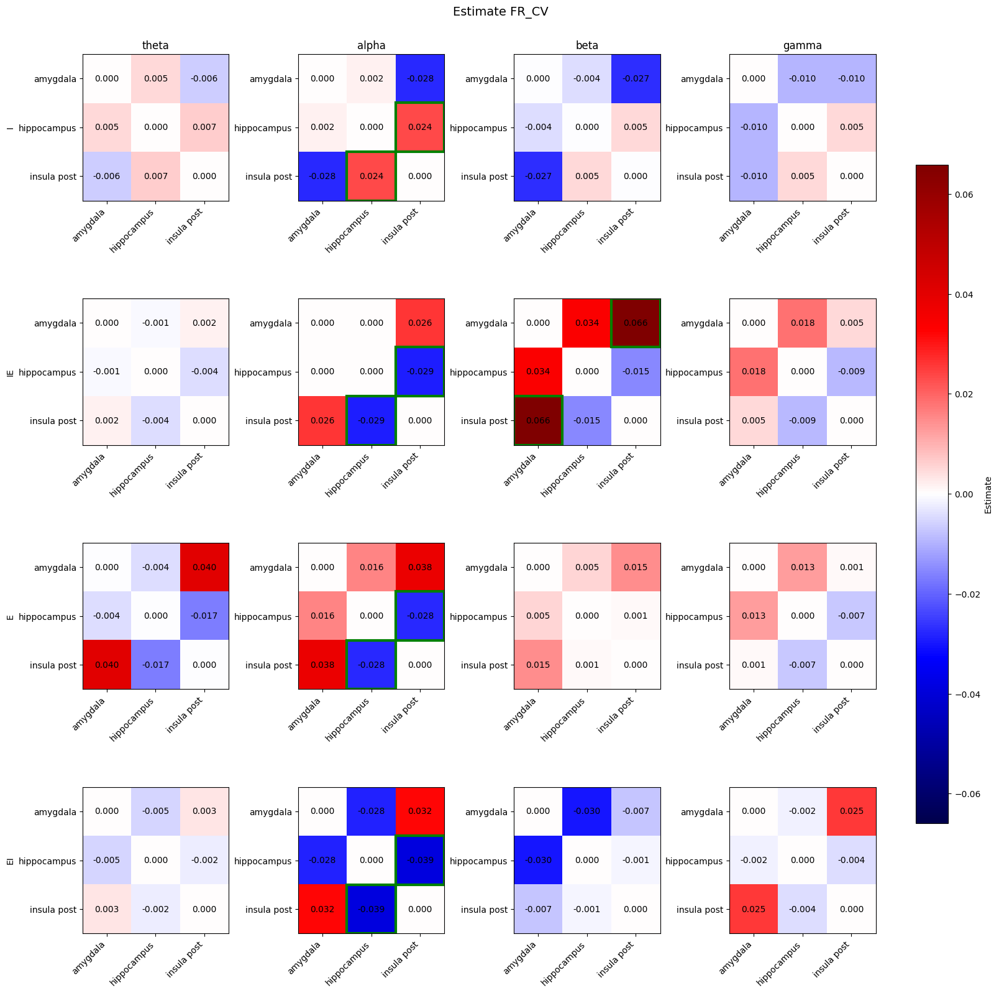

In [66]:
bands = freq_band_dict_FC_lmm['wb']

vlim = np.abs([df_phase_FR_CV_pval['estimate'].min(), df_phase_FR_CV_pval['estimate'].max()]).max()
fig, axs = plt.subplots(4, len(bands), figsize=(16, 16), constrained_layout=True)

# Loop through each band to plot
for col_i, band in enumerate(bands):

    for row_i, phase in enumerate(['I', 'IE', 'E', 'EI']):

        ax = axs[row_i, col_i]
        _estimate = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
        mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

        # Fill matrix with estimates
        for _, row in df_phase_FR_CV_pval.query(f"band == '{band}' and phase == '{phase}'").iterrows():
            r1, r2 = row['pair'].split('-')
            i1 = ROI_list_dfc.index(r1)
            i2 = ROI_list_dfc.index(r2)
            _estimate[i1, i2] = row['estimate']
            _estimate[i2, i1] = row['estimate']
            mask_p[i1, i2] = row['p'] == 1
            mask_p[i2, i1] = row['p'] == 1

        im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

        # Add text + green highlight if significant
        for x in range(3):
            for y in range(3):
                val = _estimate[x, y]
                if not np.isnan(val):
                    ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                    if mask_p[x, y]:
                        rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                        ax.add_patch(rect)

        ax.set_xticks(range(3))
        ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
        ax.set_yticks(range(3))
        ax.set_yticklabels(ROI_list_dfc)
        if row_i == 0:
            ax.set_title(f"{band}")
        if col_i == 0:
            ax.set_ylabel(phase)

# Colorbar (shared)
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
cbar.set_label('Estimate')

plt.suptitle("Estimate FR_CV", fontsize=14)
plt.show()


### CLUSTER BASED

In [73]:
phase_list = df_fc_FR_CV['phase'].unique()
band_list = df_fc_FR_CV['band'].unique()
pair_list = df_fc_FR_CV['pair'].unique()
sujet_list_fc = df_fc_FR_CV['sujet'].unique()
print(phase_list)
print(band_list)
print(pair_list)
print(sujet_list_fc)

['EI' 'I' 'IE' 'E']
['theta' 'alpha' 'beta' 'gamma']
['amygdala-hippocampus' 'amygdala-insula post' 'hippocampus-insula post']
['BANc' 'CHEe' 'GOBc' 'LEMl' 'MUGa' 'POTm' 'pat_03083_1527'
 'pat_03105_1551' 'pat_03174_1634']


In [ ]:
df_fc_stats_FR_CV = pd.DataFrame()

for band in band_list:

    for pair in pair_list:

        print(band, pair)

        data_baseline = df_fc_FR_CV.query(f"band == '{band}' and pair == '{pair}' and phase == 'I'")['fc'].values
        _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : ['I'], 'fc' : [np.median(data_baseline)], 'signi' : [False]})
        df_fc_stats_FR_CV = pd.concat([df_fc_stats_FR_CV, _df_fc])

        for phase in phase_list:

            if phase == 'I':
                continue

            data_cond = df_fc_FR_CV.query(f"band == '{band}' and pair == '{pair}' and phase == '{phase}'")['fc'].values

            stats_res = get_permutation_2groups(data_baseline, data_cond, n_surr_fc, stat_design='within', mode_grouped='median', mode_generate_surr='percentile', percentile_thresh=fc_percentile_thresh)

            _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : [phase], 'fc' : [np.median(data_cond)], 'signi' : [stats_res]})

            df_fc_stats_FR_CV = pd.concat([df_fc_stats_FR_CV, _df_fc])

theta amygdala-hippocampus
theta amygdala-insula post
theta hippocampus-insula post
alpha amygdala-hippocampus
alpha amygdala-insula post
alpha hippocampus-insula post
beta amygdala-hippocampus
beta amygdala-insula post
beta hippocampus-insula post
gamma amygdala-hippocampus
gamma amygdala-insula post
gamma hippocampus-insula post


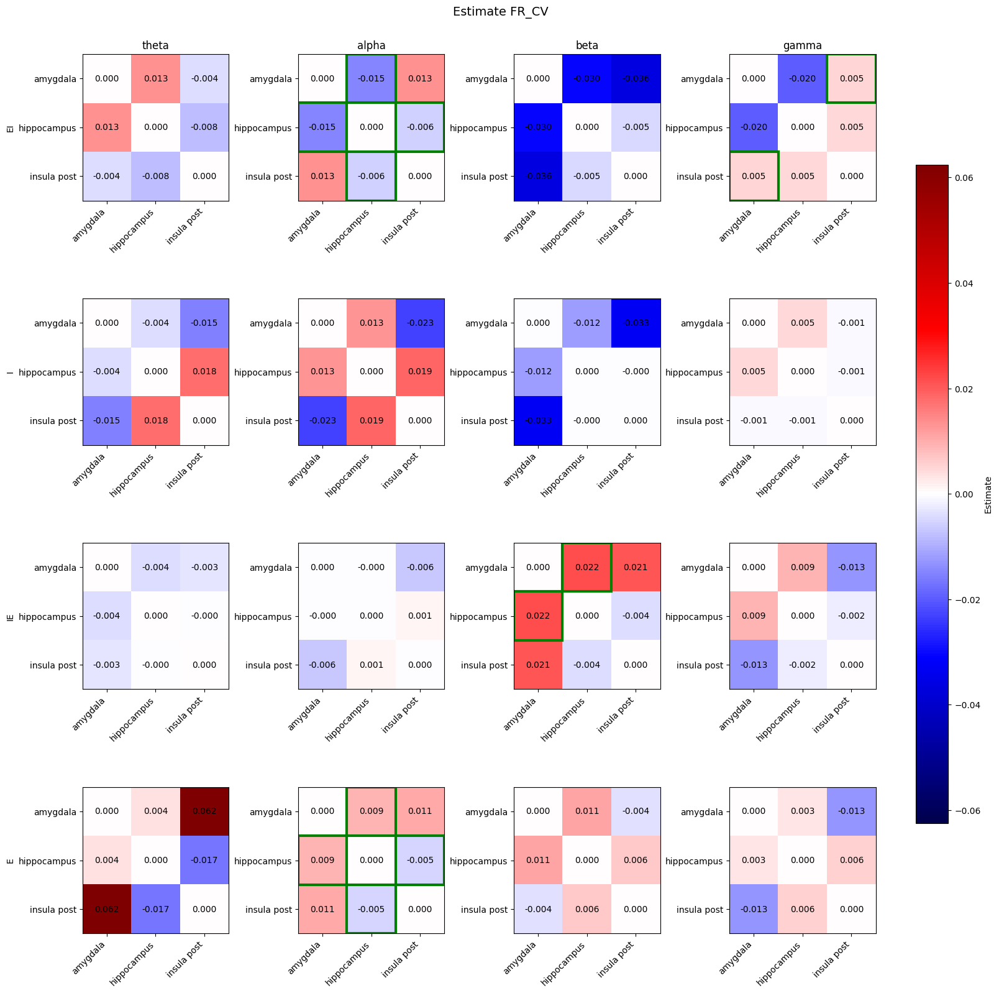

In [101]:
bands = freq_band_dict_FC_lmm['wb']

vlim = np.abs([df_fc_stats_FR_CV['fc'].min(), df_fc_stats_FR_CV['fc'].max()]).max()
fig, axs = plt.subplots(4, len(bands), figsize=(16, 16), constrained_layout=True)

# Loop through each band to plot
for col_i, band in enumerate(band_list):

    for row_i, phase in enumerate(phase_list):

        ax = axs[row_i, col_i]
        _fc = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
        mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

        # Fill matrix with estimates
        for _, row in df_fc_stats_FR_CV.query(f"band == '{band}' and phase == '{phase}'").iterrows():
            r1, r2 = row['pair'].split('-')
            i1 = ROI_list_dfc.index(r1)
            i2 = ROI_list_dfc.index(r2)
            _estimate[i1, i2] = row['fc']
            _estimate[i2, i1] = row['fc']
            mask_p[i1, i2] = row['signi'] == 1
            mask_p[i2, i1] = row['signi'] == 1

        im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

        # Add text + green highlight if significant
        for x in range(3):
            for y in range(3):
                val = _estimate[x, y]
                if not np.isnan(val):
                    ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                    if mask_p[x, y]:
                        rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                        ax.add_patch(rect)

        ax.set_xticks(range(3))
        ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
        ax.set_yticks(range(3))
        ax.set_yticklabels(ROI_list_dfc)
        if row_i == 0:
            ax.set_title(f"{band}")
        if col_i == 0:
            ax.set_ylabel(phase)

# Colorbar (shared)
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
cbar.set_label('Estimate')

plt.suptitle("Estimate FR_CV", fontsize=14)
plt.show()


## ALL CONDITIONS

### ANATOMY

In [83]:
df_Cxy_ALLCOND['ROI'].unique()

array(['frontal sup', 'WM', 'cingulaire post', 'postcentral',
       'precentral', 'frontal inf', 'cingulaire ant rostral',
       'insula ant', 'precuneus', 'parietal sup', 'supramarginal',
       'parietal inf', 'temporal sup', 'amygdala', 'hippocampus',
       'temporal inf', 'temporal med', 'pole temporal', 'lingual',
       'putamen', 'insula post', 'occipital lat', 'fusiforme', 'cuneus',
       'pars opercularis'], dtype=object)

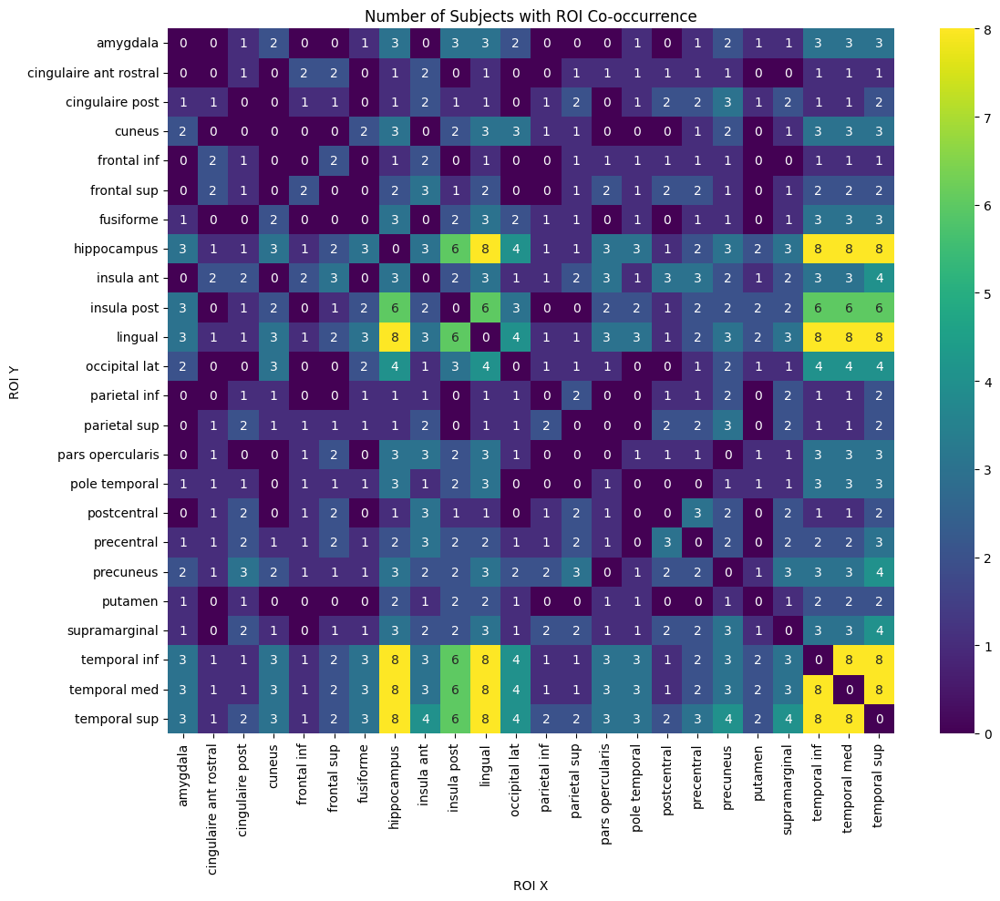

In [84]:
sujet_roi_map = df_Cxy_ALLCOND.query(f"ROI != 'WM'").groupby('sujet')['ROI'].unique()

# Get the full unique ROI list
all_rois = np.unique(df_Cxy_ALLCOND.query(f"ROI != 'WM'")['ROI'])

# Create an empty DataFrame to store counts
roi_matrix = pd.DataFrame(0, index=all_rois, columns=all_rois)

# Count co-occurrence
for rois in sujet_roi_map:
    for roi1 in rois:
        for roi2 in rois:
            if roi1 == roi2:
                continue
            roi_matrix.loc[roi1, roi2] += 1

plt.figure(figsize=(12, 10))
sns.heatmap(roi_matrix, annot=True, fmt="d", cmap="viridis")
plt.title("Number of Subjects with ROI Co-occurrence")
plt.ylabel("ROI Y")
plt.xlabel("ROI X")
plt.tight_layout()
plt.show()

In [85]:
ROI_dfc = ['frontal sup', 'frontal inf']
df_Cxy_ALLCOND.query(f"ROI in {ROI_dfc}").groupby(['sujet', 'ROI']).count().groupby(['sujet']).count().query(f"cond >= {len(ROI_dfc)}").reset_index()['sujet'].iloc[:]

0    BOUt
1    TREt
Name: sujet, dtype: object

In [86]:
ROI_dfc = ['amygdala', 'hippocampus', 'insula post']
df_Cxy_ALLCOND.query(f"ROI in {ROI_dfc}").groupby(['sujet', 'ROI']).count().groupby(['sujet']).count().query(f"cond >= {len(ROI_dfc)}").reset_index()['sujet'].iloc[:]

0    CHEe
1    GOBc
2    POTm
Name: sujet, dtype: object

In [87]:
ROI_dfc = ['amygdala', 'hippocampus', 'insula post']
sujet_sel_dfc = ['CHEe', 'GOBc', 'POTm']
df_Cxy_ALLCOND.query(f"ROI in {ROI_dfc} and sujet in {sujet_sel_dfc}").groupby(['sujet', 'ROI']).count()['cond']

sujet  ROI        
CHEe   amygdala        4
       hippocampus    28
       insula post    16
GOBc   amygdala       16
       hippocampus    28
       insula post    32
POTm   amygdala       16
       hippocampus    48
       insula post    16
Name: cond, dtype: int64

### LMM

In [88]:
pairs_to_compute = []

for pair_A_i, pair_A in enumerate(ROI_list_dfc):
    
    for pair_B_i, pair_B in enumerate(ROI_list_dfc):

        if pair_A == pair_B or f'{pair_A}-{pair_B}' in pairs_to_compute or f'{pair_B}-{pair_A}' in pairs_to_compute:
            continue

        pairs_to_compute.append(f'{pair_A}-{pair_B}')


pair_list = ['-'.join(sorted(pair.split('-'))) for pair in pairs_to_compute]

In [91]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'FC', 'df_lmm'))
df_lmm_ALLCOND = pd.DataFrame()

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'lmm_{pair}_{band}_res_FC_ALLCOND_bi.xlsx')
        _df['pair'] = [pair] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_ALLCOND = pd.concat([df_lmm_ALLCOND, _df])

In [92]:
data_cond = {'pair' : [], 'band' : [], 'phase' : [], 'cond' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        for cond in conditions:

            for phase in ['I', 'IE', 'E', 'EI']:

                if cond == 'FR_CV' and phase == 'I':
                    
                    _term = '(Intercept)'

                elif cond == 'FR_CV':

                    _term = f'phase{phase}'

                elif phase == 'I':

                    _term = f'cond{cond}'

                else:

                    _term = f"phase{phase}:cond{cond}"

                df = df_lmm_ALLCOND.query(f"pair == '{pair}' and band == '{band}'")
                _estimate = df.query(f"term == '{_term}'")['estimate'].iloc[0]
                pval = df.query(f"term == '{_term}'")['p.value'].iloc[0]
                if pval < 0.05:
                    p = 1
                else:
                    p = 0

                data_cond['pair'].append(pair)
                data_cond['band'].append(band)
                data_cond['cond'].append(cond)
                data_cond['phase'].append(phase)
                data_cond['estimate'].append(_estimate)
                data_cond['pval'].append(pval)
                data_cond['p'].append(p)

df_FR_CV_pval_cond_phase = pd.DataFrame(data_cond)

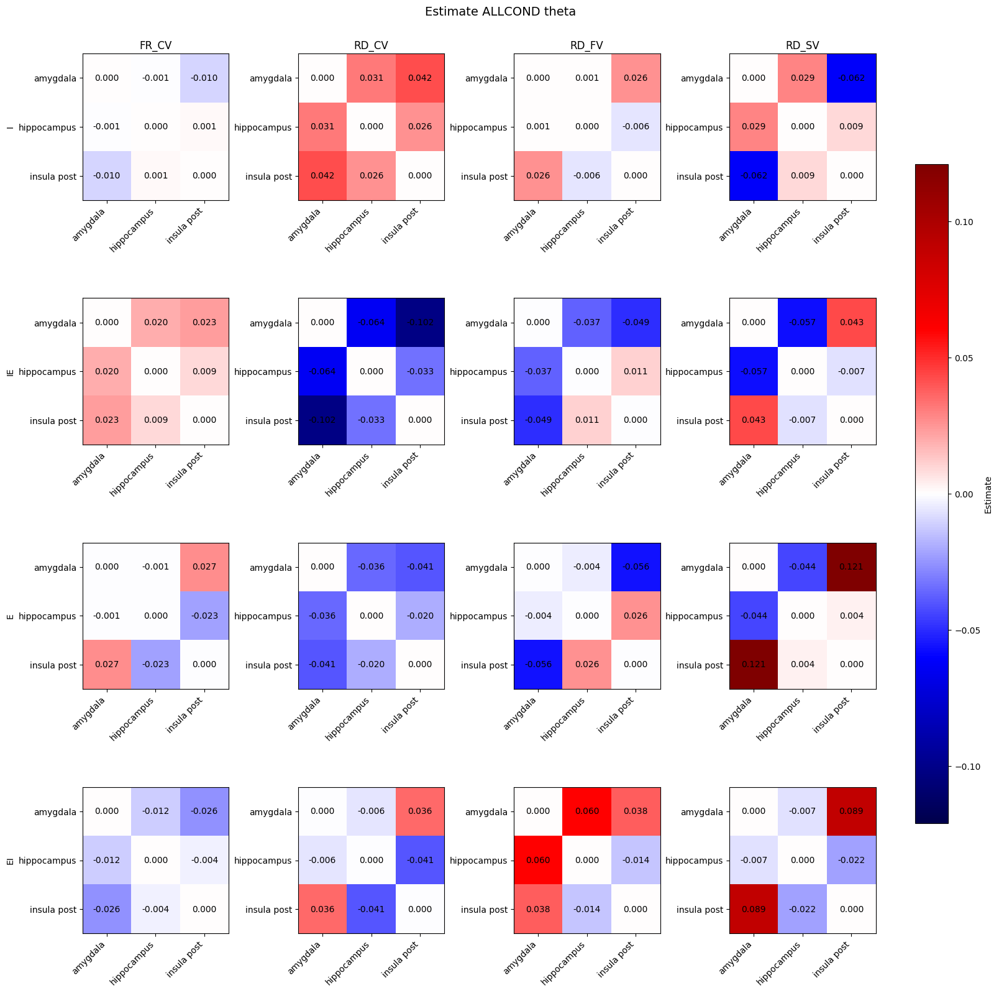

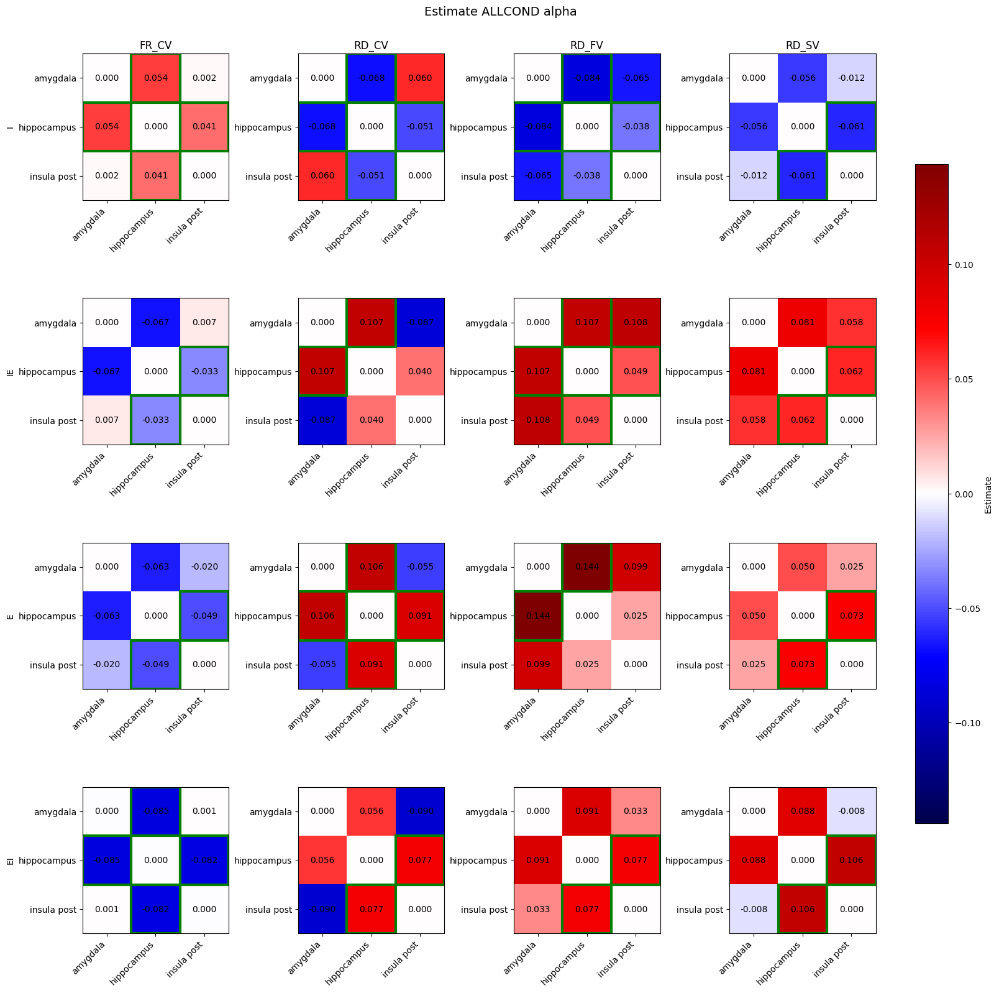

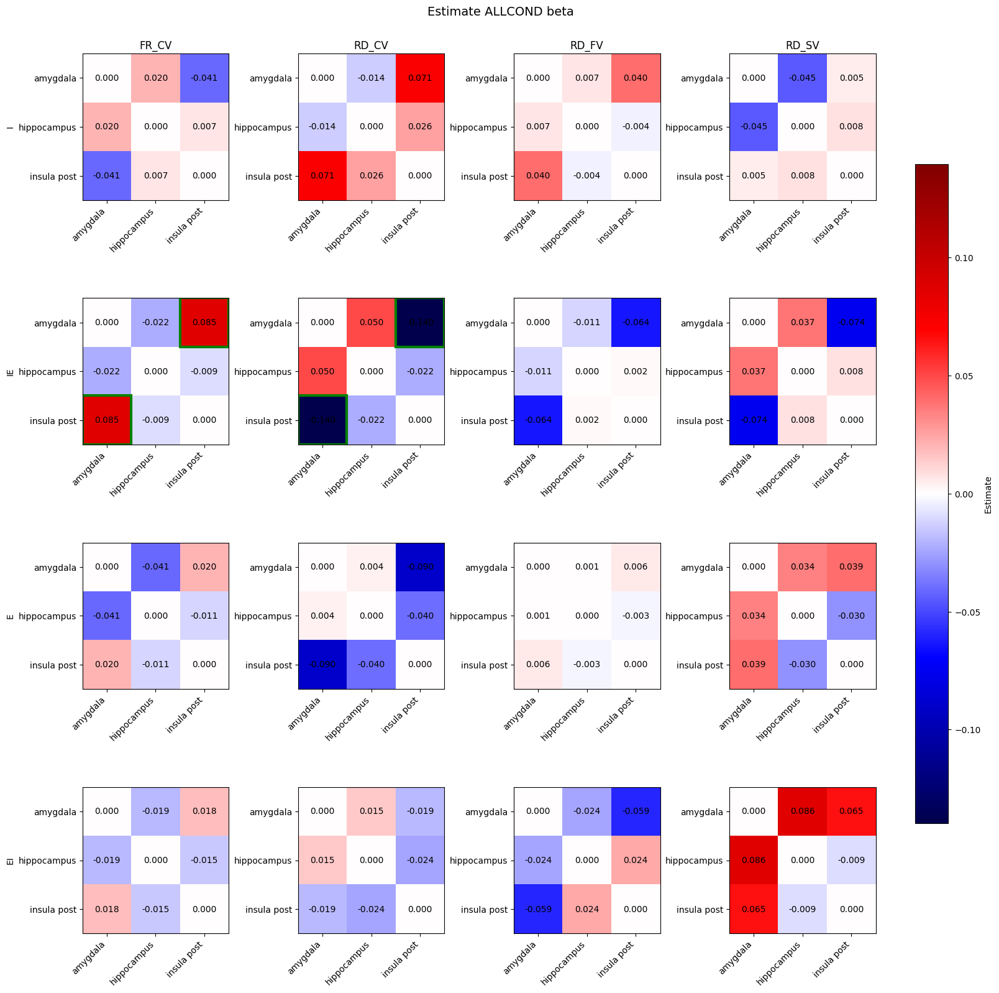

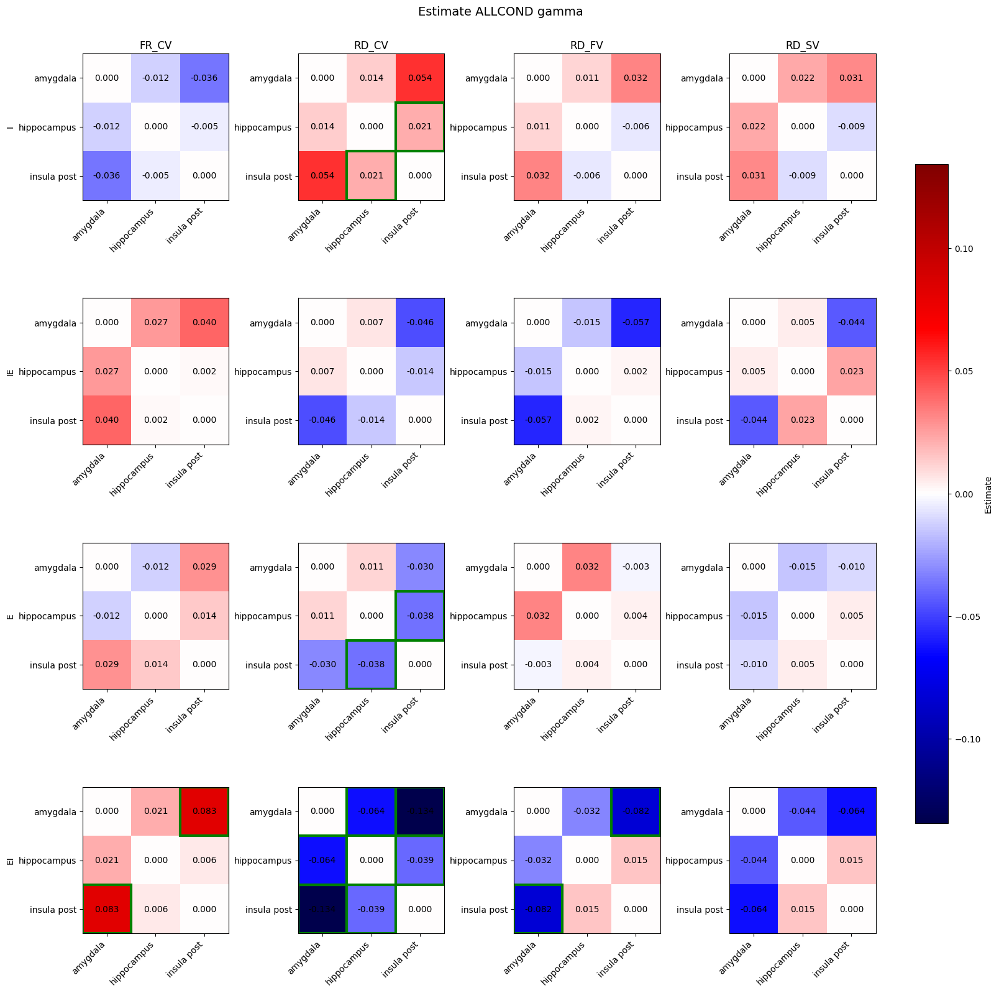

In [93]:
bands = freq_band_dict_FC_lmm['wb']

for i, band in enumerate(bands):

    df_plot = df_FR_CV_pval_cond_phase.query(f"band == '{band}'")

    vlim = np.abs([df_plot['estimate'].min(), df_plot['estimate'].max()]).max()
    fig, axs = plt.subplots(4, len(conditions), figsize=(16, 16), constrained_layout=True)

    # Loop through each band to plot
    for col_i, cond in enumerate(conditions):

        for row_i, phase in enumerate(['I', 'IE', 'E', 'EI']):

            ax = axs[row_i, col_i]
            _estimate = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
            mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

            # Fill matrix with estimates
            for _, row in df_plot.query(f"cond == '{cond}' and phase == '{phase}'").iterrows():
                r1, r2 = row['pair'].split('-')
                i1 = ROI_list_dfc.index(r1)
                i2 = ROI_list_dfc.index(r2)
                _estimate[i1, i2] = row['estimate']
                _estimate[i2, i1] = row['estimate']
                mask_p[i1, i2] = row['p'] == 1
                mask_p[i2, i1] = row['p'] == 1

            im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

            # Add text + green highlight if significant
            for x in range(3):
                for y in range(3):
                    val = _estimate[x, y]
                    if not np.isnan(val):
                        ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                        if mask_p[x, y]:
                            rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                            ax.add_patch(rect)

            ax.set_xticks(range(3))
            ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
            ax.set_yticks(range(3))
            ax.set_yticklabels(ROI_list_dfc)
            if row_i == 0:
                ax.set_title(cond)
            if col_i == 0:
                ax.set_ylabel(phase)

    # Colorbar (shared)
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
    cbar.set_label('Estimate')

    plt.suptitle(f"Estimate ALLCOND {band}", fontsize=14)
    plt.show()


### CLUSTER BASED

In [95]:
phase_list = df_fc_ALLCOND['phase'].unique()
band_list = df_fc_ALLCOND['band'].unique()
pair_list = df_fc_ALLCOND['pair'].unique()
sujet_list_fc = df_fc_ALLCOND['sujet'].unique()
cond_list = df_fc_ALLCOND['cond'].unique()
print(phase_list)
print(band_list)
print(pair_list)
print(sujet_list_fc)
print(cond_list)

['EI' 'I' 'IE' 'E']
['theta' 'alpha' 'beta' 'gamma']
['amygdala-hippocampus' 'amygdala-insula post' 'hippocampus-insula post']
['CHEe' 'GOBc' 'POTm']
['FR_CV' 'RD_CV' 'RD_FV' 'RD_SV']


In [ ]:
df_fc_stats_ALLCOND = pd.DataFrame()

for band in band_list:

    for pair in pair_list:

        print(band, pair)

        for phase in phase_list:

            data_baseline = df_fc_ALLCOND.query(f"band == '{band}' and pair == '{pair}' and phase == '{phase}' and cond == 'FR_CV'")['fc'].values
            _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : [phase], 'cond' : ['FR_CV'], 'fc' : [np.median(data_baseline)], 'signi' : [False]})
            df_fc_stats_ALLCOND = pd.concat([df_fc_stats_ALLCOND, _df_fc])

            for cond in cond_list:

                if cond == 'FR_CV':
                    continue

                data_cond = df_fc_ALLCOND.query(f"band == '{band}' and pair == '{pair}' and phase == '{phase}' and cond == '{cond}'")['fc'].values

                stats_res = get_permutation_2groups(data_baseline, data_cond, n_surr_fc, stat_design='within', mode_grouped='median', mode_generate_surr='percentile', percentile_thresh=fc_percentile_thresh)

                _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : [phase], 'cond' : [cond], 'fc' : [np.median(data_cond)], 'signi' : [stats_res]})

                df_fc_stats_ALLCOND = pd.concat([df_fc_stats_ALLCOND, _df_fc])

theta amygdala-hippocampus EI
theta amygdala-hippocampus I
theta amygdala-hippocampus IE
theta amygdala-hippocampus E
theta amygdala-insula post EI
theta amygdala-insula post I
theta amygdala-insula post IE
theta amygdala-insula post E
theta hippocampus-insula post EI
theta hippocampus-insula post I
theta hippocampus-insula post IE
theta hippocampus-insula post E
alpha amygdala-hippocampus EI
alpha amygdala-hippocampus I
alpha amygdala-hippocampus IE
alpha amygdala-hippocampus E
alpha amygdala-insula post EI
alpha amygdala-insula post I
alpha amygdala-insula post IE
alpha amygdala-insula post E
alpha hippocampus-insula post EI
alpha hippocampus-insula post I
alpha hippocampus-insula post IE
alpha hippocampus-insula post E
beta amygdala-hippocampus EI
beta amygdala-hippocampus I
beta amygdala-hippocampus IE
beta amygdala-hippocampus E
beta amygdala-insula post EI
beta amygdala-insula post I
beta amygdala-insula post IE
beta amygdala-insula post E
beta hippocampus-insula post EI
beta hip

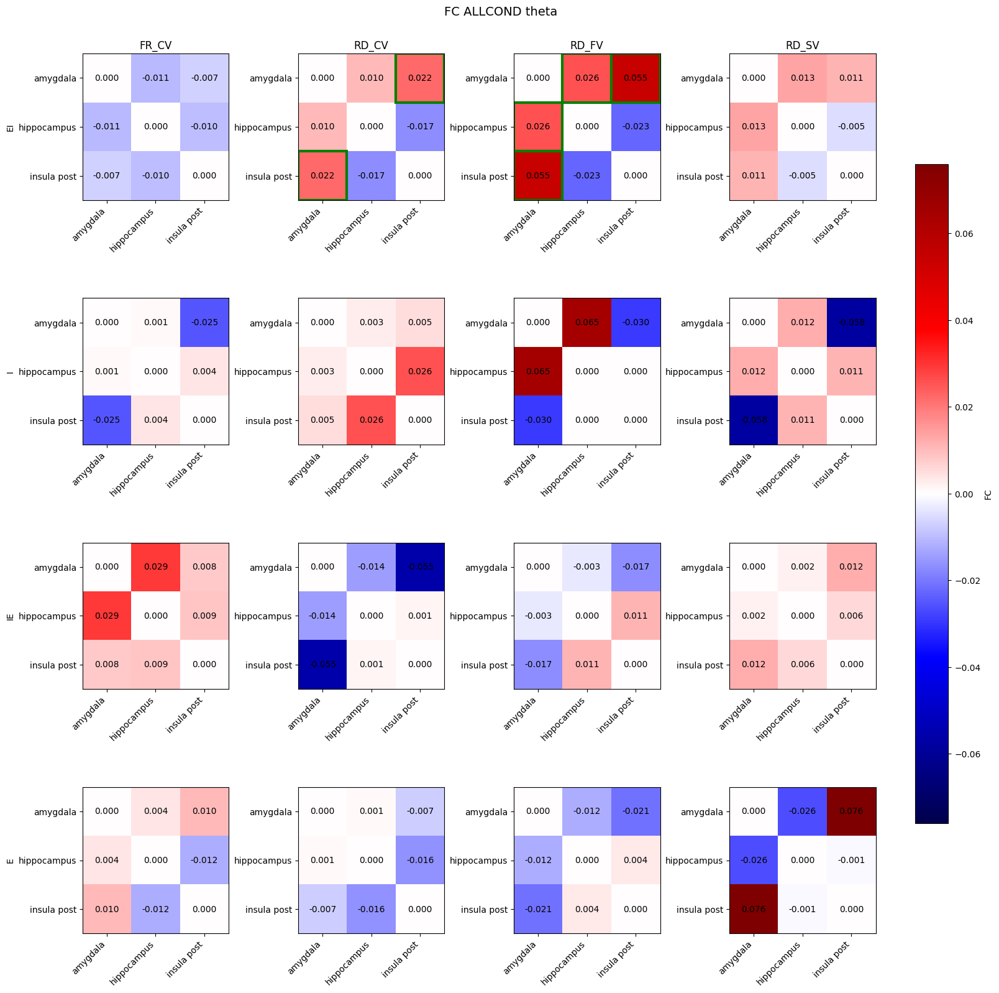

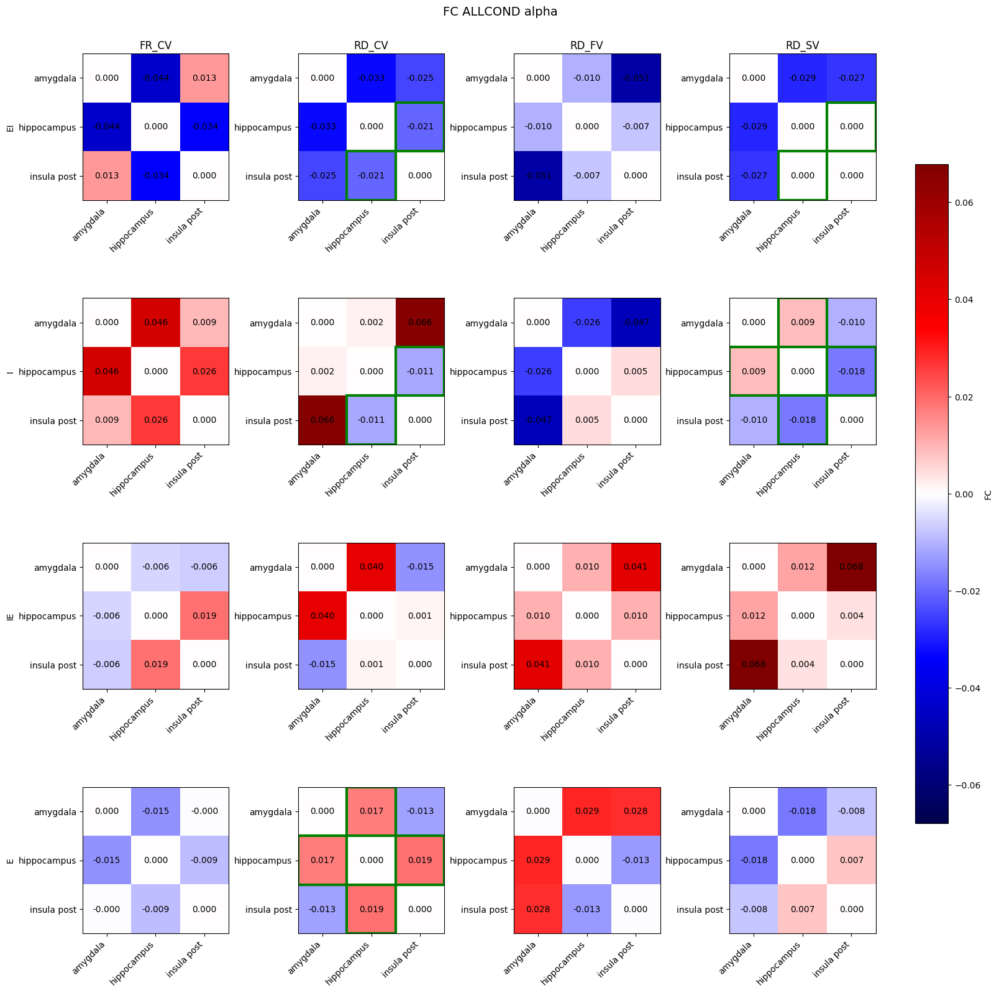

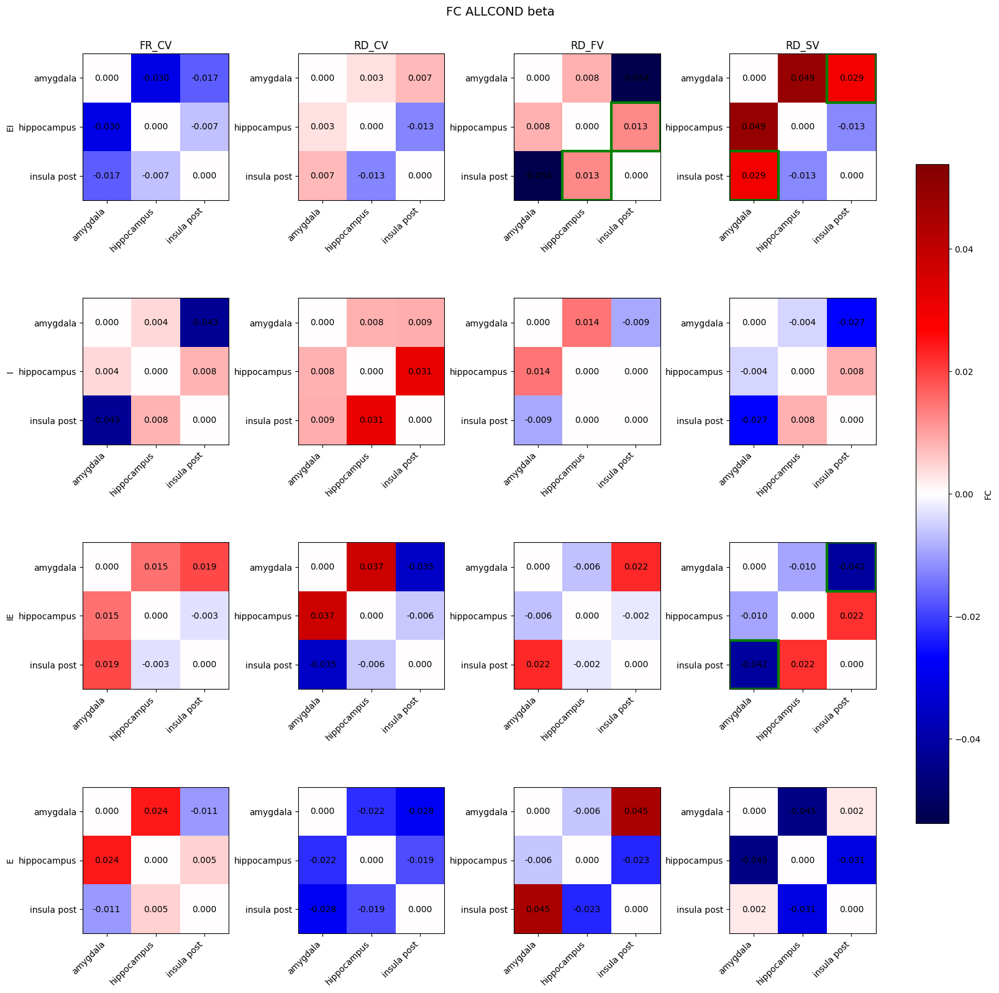

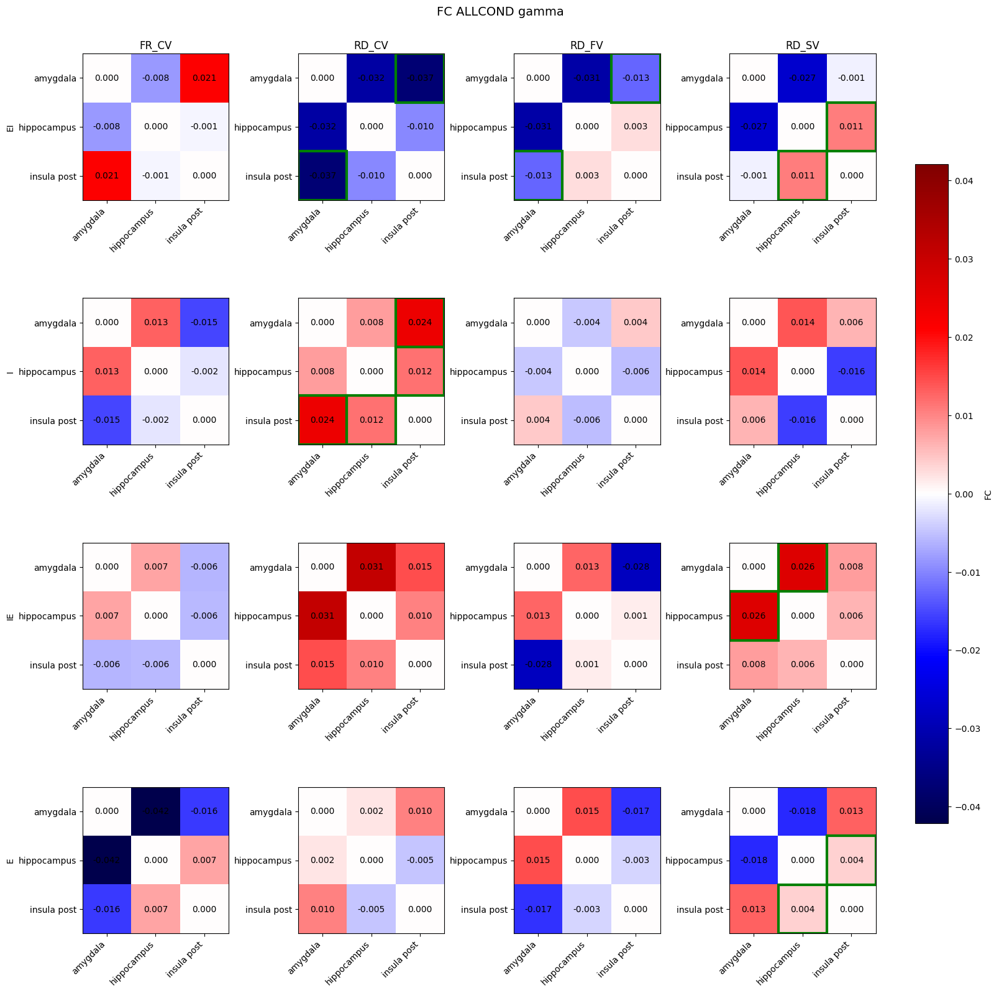

In [100]:
for i, band in enumerate(band_list):

    df_plot = df_fc_stats_ALLCOND.query(f"band == '{band}'")

    vlim = np.abs([df_plot['fc'].min(), df_plot['fc'].max()]).max()
    fig, axs = plt.subplots(4, len(conditions), figsize=(16, 16), constrained_layout=True)

    # Loop through each band to plot
    for col_i, cond in enumerate(conditions):

        for row_i, phase in enumerate(phase_list):

            ax = axs[row_i, col_i]
            _fc = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
            mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

            # Fill matrix with estimates
            for _, row in df_plot.query(f"cond == '{cond}' and phase == '{phase}'").iterrows():
                r1, r2 = row['pair'].split('-')
                i1 = ROI_list_dfc.index(r1)
                i2 = ROI_list_dfc.index(r2)
                _estimate[i1, i2] = row['fc']
                _estimate[i2, i1] = row['fc']
                mask_p[i1, i2] = row['signi'] == 1
                mask_p[i2, i1] = row['signi'] == 1

            im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

            # Add text + green highlight if significant
            for x in range(3):
                for y in range(3):
                    val = _estimate[x, y]
                    if not np.isnan(val):
                        ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                        if mask_p[x, y]:
                            rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                            ax.add_patch(rect)

            ax.set_xticks(range(3))
            ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
            ax.set_yticks(range(3))
            ax.set_yticklabels(ROI_list_dfc)
            if row_i == 0:
                ax.set_title(cond)
            if col_i == 0:
                ax.set_ylabel(phase)

    # Colorbar (shared)
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
    cbar.set_label('FC')

    plt.suptitle(f"FC ALLCOND {band}", fontsize=14)
    plt.show()